# MultiOmics RNA + ATAC for Chao dataset emphasis on OL population (MORNAATACCOL) technical documentation
## Multiomics RNAseq & ATACseq on EAE model

<hr>

**This notebook is the following of MORNAATACCOL 11 notebook**

<hr>

Data used in this notebook :

In [ ]:
#Memory needed for a full run : 256Gb

In [ ]:
#Early1               = P21208_1003_EAE_ARC
#PeakCtrl2            = P21208_1004_EAE_ARC
#Peak2                = P21208_1005_EAE_ARC
#LateCtrl1            = MORNAATACC_1002 (P21520_1002)
#Late1                = MORNAATACC_1003 (P21520_1003)
#Early2               = P23605_1001
#EarlyCtrl2           = P23605_1002
#Peak3                = P23605_1003
#PeakCtrl3            = P23605_1004
#EarlyCtrl3           = P24115_1001
#EarlyFemale3         = P24115_1002
#EarlyMale3           = P24115_1003
#Late2                = P25316_1001
#LateCtrl2            = P25316_1002
#Late3                = P25316_1003
#LateCtrl3            = P25316_1004
#PeakMale4            = P27208_1001
#PeakFemale4          = P27208_1002
#LateMale4            = P27208_1003
#LateFemale4          = P27208_1004
#Naive1               = P26203_1003
#Naive2               = P26203_1004
#Peak5                = P29557_1001
#Late5                = P29557_1002
#Naive3               = P29557_1004
#EarlyCtrl4           = P29557_1005
#EarlyCtrlMale5       = P29557_1006
#EarlyCtrlFemale5     = P29557_1007
#Early4               = P29557_1008
#EarlyMale5           = P29557_1009
#EarlyFemale5         = P29557_1010

## 0. Environment status

In [5]:
%use

Subkernel,Kernel Name,Language,Language Module,Interpreter
Bash,bash,bash,sos_bash,/usr/bin/python3
Bash,calysto_bash,bash,sos_bash,python
Python3,python3,python,sos_python,python
R,ir,R,sos_r,/usr/lib/R/bin/R
SoS,sos,sos,,/usr/bin/python3


In [3]:
lsb_release -a

No LSB modules are available.
Distributor ID:	Ubuntu
Description:	Ubuntu 20.04 LTS
Release:	20.04
Codename:	focal


In [4]:
lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
Address sizes:       46 bits physical, 48 bits virtual
CPU(s):              20
On-line CPU(s) list: 0-19
Thread(s) per core:  1
Core(s) per socket:  10
Socket(s):           2
NUMA node(s):        2
Vendor ID:           GenuineIntel
CPU family:          6
Model:               79
Model name:          Intel(R) Xeon(R) CPU E5-2630 v4 @ 2.20GHz
Stepping:            1
CPU MHz:             2735.498
CPU max MHz:         3100.0000
CPU min MHz:         1200.0000
BogoMIPS:            4390.12
Virtualization:      VT-x
L1d cache:           640 KiB
L1i cache:           640 KiB
L2 cache:            5 MiB
L3 cache:            50 MiB
NUMA node0 CPU(s):   0-9
NUMA node1 CPU(s):   10-19
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cm
                     ov pat pse36 clflush dts acpi mmx fxsr sse sse2 ss ht tm pb
                     e syscall nx pdpe1gb rdtscp lm constant_t

In [5]:
grep MemTotal /proc/meminfo | awk '{print $2 / 1024}'

128374


In [ ]:
apt list --installed

In [ ]:
pip list

In [9]:
jupyter --version

Selected Jupyter core packages...
IPython          : 7.30.1
ipykernel        : 6.6.0
ipywidgets       : 7.6.5
jupyter_client   : 7.1.0
jupyter_core     : 4.9.1
jupyter_server   : 1.13.1
jupyterlab       : 3.1.17
nbclient         : 0.5.9
nbconvert        : 6.2.0
nbformat         : 5.1.3
notebook         : 6.4.6
qtconsole        : 5.2.2
traitlets        : 5.1.0


In [1]:
#conda env export -n jupyter

## 1. Loading environments

### 1.1 R Packages

In [1]:
library(Seurat)
library(Signac)
library(EnsDb.Mmusculus.v79)
library(BSgenome.Mmusculus.UCSC.mm10)
library(dplyr)
library(stringr)
library(harmony)
library(clustree)
library(data.table)
library(biomaRt)
library(cowplot)
library(randomForest)
library(ggplot2)
library(caret)
library(tidyverse)
library(pheatmap)
library(grid)
library(gridExtra)
library(biovizBase)
library(ggrepel)
library(viridis)
library(reshape2)
library(hues)
library(clusterProfiler)
library(org.Mm.eg.db)
library(ggnewscale)
library(scales)
library(aplot)
library(patchwork)

#conda dependencies trouble
library(enrichplot)
library(ReactomePA)

library(textclean)
library(mclust)

library(muscat)
library(SingleCellExperiment)
library(magrittr)
library(plyr)
library(scater)
library(cowplot)
library(UpSetR)
library(limma)
library(Matrix.utils)
library(purrr)
library(DESeq2)
library(EnhancedVolcano)


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Loading required package: ensembldb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    Filter, Find, Map, Position, Reduce, anyDuplicated, aperm, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted,
    lapply, mapply, match, mget, order, paste, pmax, pmax.int, pmin,
    pmin.int, rank, rbind, rownames, sapply, setdiff, sort, table,
    tapply, union, unique, unsplit, which.max, which.min


Loading required package: GenomicRanges

Loading required package: stats4

Loading require

In [2]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 22.04 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/blas/libblas.so.3.10.0 
LAPACK: /usr/lib/x86_64-linux-gnu/lapack/liblapack.so.3.10.0

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Etc/UTC
tzcode source: system (glibc)

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] EnhancedVolcano_1.20.0             DESeq2_1.42.1                     
 [3] Matrix.utils_0.9.8                 Matrix_1.6-5                      
 [5] limma_3.58.1                       UpSetR_1.4.0                      
 [7] scater_1.30.1                      scuttle_1.12.0        

### 1.2 Functions

In [3]:
PrctCellExpringGene <- function(object, genes, group.by = "all"){
    if(group.by == "all"){
        prct = unlist(lapply(genes,calc_helper, object=object))
        result = data.frame(Markers = genes, Cell_proportion = prct)
        return(result)
    }

    else{        
        list = SplitObject(object, group.by)
        factors = names(list)

        results = lapply(list, PrctCellExpringGene, genes=genes)
        for(i in 1:length(factors)){
        results[[i]]$Feature = factors[i]
        }
        combined = do.call("rbind", results)
        return(combined)
    }
}

calc_helper <- function(object,genes){
    counts = object[['RNA']]@counts
    ncells = ncol(counts)
    if(genes %in% row.names(counts)){
    sum(counts[genes,]>0)/ncells
    }else{return(NA)}
}

NbCellExpringGene <- function(object, genes, group.by = "all"){
    if(group.by == "all"){
        nb = unlist(lapply(genes,calc_helper_nb, object=object))
        result = data.frame(Markers = genes, Cell_nb = nb)
        return(result)
    }

    else{        
        list = SplitObject(object, group.by)
        factors = names(list)

        results = lapply(list, NbCellExpringGene, genes=genes)
        for(i in 1:length(factors)){
        results[[i]]$Feature = factors[i]
        }
        combined = do.call("rbind", results)
        return(combined)
    }
}

calc_helper_nb <- function(object,genes){
    counts = object[['RNA']]@counts
    if(genes %in% row.names(counts)){
    length(counts[genes,][counts[genes,] > 0])
    }else{return(NA)}
}

DoMultiBarHeatmap <- function (object, features = NULL, cells = NULL, group.by = "ident", additional.group.by = NULL, additional.group.sort.by = NULL,  cols.use = NULL, group.bar = TRUE, disp.min = -2.5, disp.max = NULL, layer = "scale.data", assay = NULL, label = TRUE, size = 5.5, hjust = 0, angle = 45, raster = TRUE, draw.lines = TRUE, lines.width = NULL, group.bar.height = 0.02, combine = TRUE){

  cells <- cells %||% colnames(x = object)
  if (is.numeric(x = cells)) {
    cells <- colnames(x = object)[cells]
  }
  assay <- assay %||% DefaultAssay(object = object)
  DefaultAssay(object = object) <- assay
  features <- features %||% VariableFeatures(object = object)
  ## Why reverse???
  features <- rev(x = unique(x = features))
  disp.max <- disp.max %||% ifelse(test = layer == "scale.data", yes = 2.5, no = 6)
  possible.features <- rownames(x = LayerData(object = object, assay = assay, layer = layer))
  if (any(!features %in% possible.features)) {
    bad.features <- features[!features %in% possible.features]
    features <- features[features %in% possible.features]
    if (length(x = features) == 0) {
      stop("No requested features found in the ", layer,
      " slot for the ", assay, " assay.")
    }
    warning("The following features were omitted as they were not found in the ", layer, " slot for the ", assay, " assay: ", paste(bad.features, collapse = ", "))
  }

  if (!is.null(additional.group.sort.by)) {
    if (any(!additional.group.sort.by %in% additional.group.by)) {
      bad.sorts <- additional.group.sort.by[!additional.group.sort.by %in% additional.group.by]
      additional.group.sort.by <- additional.group.sort.by[additional.group.sort.by %in% additional.group.by]
      if (length(x = bad.sorts) > 0) {
        warning("The following additional sorts were omitted as they were not a subset of additional.group.by : ",
        paste(bad.sorts, collapse = ", "))
      }
    }
  }

  data <- as.data.frame(x = as.matrix(x = t(x = LayerData(object = object, assay = assay, layer = layer)[features, cells, drop = FALSE])))

  object <- suppressMessages(expr = StashIdent(object = object, save.name = "ident"))
  group.by <- group.by %||% "ident"
  groups.use <- object[[c(group.by, additional.group.by[!additional.group.by %in% group.by])]][cells, , drop = FALSE]
  plots <- list()
  for (i in group.by) {
    data.group <- data
    if (!is.null(additional.group.by)) {
      additional.group.use <- additional.group.by[additional.group.by!=i]
      if (!is.null(additional.group.sort.by)){
        additional.sort.use = additional.group.sort.by[additional.group.sort.by != i]
      } else {
        additional.sort.use = NULL
      }
    } else {
      additional.group.use = NULL
      additional.sort.use = NULL
    }

    group.use <- groups.use[, c(i, additional.group.use), drop = FALSE]

    for(colname in colnames(group.use)){
      if (!is.factor(x = group.use[[colname]])) {
        group.use[[colname]] <- factor(x = group.use[[colname]])
      }
    }

    if (draw.lines) {
      lines.width <- lines.width %||% ceiling(x = nrow(x = data.group) * 0.0025)
      placeholder.cells <- sapply(X = 1:(length(x = levels(x = group.use[[i]])) * lines.width), FUN = function(x) {
        return(Seurat:::RandomName(length = 20))
      })
      placeholder.groups <- data.frame(rep(x = levels(x = group.use[[i]]), times = lines.width))
      group.levels <- list()
      group.levels[[i]] = levels(x = group.use[[i]])
      for (j in additional.group.use) {
        group.levels[[j]] <- levels(x = group.use[[j]])
        placeholder.groups[[j]] = NA
      }

      colnames(placeholder.groups) <- colnames(group.use)
      rownames(placeholder.groups) <- placeholder.cells

      group.use <- sapply(group.use, as.vector)
      rownames(x = group.use) <- cells

      group.use <- rbind(group.use, placeholder.groups)

      for (j in names(group.levels)) {
        group.use[[j]] <- factor(x = group.use[[j]], levels = group.levels[[j]])
      }

      na.data.group <- matrix(data = NA, nrow = length(x = placeholder.cells), ncol = ncol(x = data.group), dimnames = list(placeholder.cells, colnames(x = data.group)))
      data.group <- rbind(data.group, na.data.group)
    }

    order_expr <- paste0('order(', paste(c(i, additional.sort.use), collapse=','), ')')
    group.use = with(group.use, group.use[eval(parse(text=order_expr)), , drop=F])

    plot <- Seurat:::SingleRasterMap(data = data.group, raster = raster, disp.min = disp.min, disp.max = disp.max, feature.order = features, cell.order = rownames(x = group.use), group.by = group.use[[i]])

    if (group.bar) {
      pbuild <- ggplot_build(plot = plot)
      group.use2 <- group.use
      cols <- list()
      na.group <- Seurat:::RandomName(length = 20)
      for (colname in rev(x = colnames(group.use2))) {
        if (colname == i) {
          colid = paste0('Identity (', colname, ')')
        } else {
          colid = colname
        }

        # Default
        cols[[colname]] <- c(scales::hue_pal()(length(x = levels(x = group.use[[colname]]))))

        #Overwrite if better value is provided
        if (!is.null(cols.use[[colname]])) {
          req_length = length(x = levels(group.use))
          if (length(cols.use[[colname]]) < req_length){
            warning("Cannot use provided colors for ", colname, " since there aren't enough colors.")
          } else {
            if (!is.null(names(cols.use[[colname]]))) {
              if (all(levels(group.use[[colname]]) %in% names(cols.use[[colname]]))) {
                cols[[colname]] <- as.vector(cols.use[[colname]][levels(group.use[[colname]])])
              } else {
                warning("Cannot use provided colors for ", colname, " since all levels (", paste(levels(group.use[[colname]]), collapse=","), ") are not represented.")
              }
            } else {
              cols[[colname]] <- as.vector(cols.use[[colname]])[c(1:length(x = levels(x = group.use[[colname]])))]
            }
          }
        }

        # Add white if there's lines
        if (draw.lines) {
          levels(x = group.use2[[colname]]) <- c(levels(x = group.use2[[colname]]), na.group)
          group.use2[placeholder.cells, colname] <- na.group
          cols[[colname]] <- c(cols[[colname]], "#FFFFFF")
        }
        names(x = cols[[colname]]) <- levels(x = group.use2[[colname]])

        y.range <- diff(x = pbuild$layout$panel_params[[1]]$y.range)
        y.pos <- max(pbuild$layout$panel_params[[1]]$y.range) + y.range * 0.015
        y.max <- y.pos + group.bar.height * y.range
        pbuild$layout$panel_params[[1]]$y.range <- c(pbuild$layout$panel_params[[1]]$y.range[1], y.max)

        plot <- suppressMessages(plot +
          annotation_raster(raster = t(x = cols[[colname]][group.use2[[colname]]]),  xmin = -Inf, xmax = Inf, ymin = y.pos, ymax = y.max) +
          annotation_custom(grob = grid::textGrob(label = colid, hjust = 0, gp = gpar(cex = 0.75)), ymin = mean(c(y.pos, y.max)), ymax = mean(c(y.pos, y.max)), xmin = Inf, xmax = Inf) +
          coord_cartesian(ylim = c(0, y.max), clip = "off")
        )


        if ((colname == i) && label) {
          x.max <- max(pbuild$layout$panel_params[[1]]$x.range)
          x.divs <- pbuild$layout$panel_params[[1]]$x.major %||% pbuild$layout$panel_params[[1]]$x$break_positions()
          group.use$x <- x.divs

          label.x.pos <- tapply(X = group.use$x, INDEX = group.use[[colname]], FUN = median) * x.max
          label.x.pos <- data.frame(group = names(x = label.x.pos), label.x.pos)
          plot <- plot + geom_text(stat = "identity", data = label.x.pos, aes_string(label = "group", x = "label.x.pos"), y = y.max + y.max *  0.03 * 0.5, angle = angle, hjust = hjust, size = size)
          plot <- suppressMessages(plot + coord_cartesian(ylim = c(0, y.max + y.max * 0.002 * max(nchar(x = levels(x = group.use[[colname]]))) * size), clip = "off"))
        }
      }
    }
    plot <- plot + theme(line = element_blank())
    plots[[i]] <- plot
  }
  if (combine) {
    plots <- CombinePlots(plots = plots)
  }
  return(plots)
}


#####################################################
# Function for getting the marker peaks from the Seurat
# object, based on the current ident
#####################################################
getMarkerPeaks <- function(obj, doublets, n_peaks = 100, min_cells = 200){

  n_clusters = length(unique(as.vector(Idents(obj))))
  
  cells <- Cells(obj)
  
  # remove the doublet cells for better marker peaks
  obj <- subset(obj, cells = cells[!cells %in% doublets])
  
  obj@assays$ATAC@data@x <- obj@assays$ATAC@counts@x
  
  # default preporcessing o Signac applied
  obj <- RunTFIDF(obj, verbose = F)
  obj <- FindTopFeatures(obj, min.cutoff = NULL, verbose = F)
  obj <- RunSVD(
    object = obj,
    reduction.key = 'SVD_',
    reduction.name = 'svd',
    seed.use = 1,
    verbose = F
  )
  
  # get the marker peaks between all clusters
  da_peaks <- FindAllMarkers(
    object = obj,
    slot = "data",
    min.pct = 0.1,
    only.pos = TRUE,
    test.use = 'LR',
    min.cells.group = min_cells,
    verbose = F
  )
  
  # only keep the significant peaks
  metadata = lapply(unique(da_peaks$cluster), function(x){
    return(data.frame(da_peaks[da_peaks$p_val_adj < 0.05 & da_peaks$cluster == x,]))
  })
  
  names(metadata) <- paste0("Cluster_", unique(da_peaks$cluster))
  
  rm(da_peaks)
  
  meta_peaks = data.frame()
  
  for (i in names(metadata)) {
    
    cur_meta = data.frame(metadata[[i]])
    cur_meta$peaks = row.names(metadata[[i]])
    cur_meta$cluster = i
    row.names(cur_meta) = c()
    
    meta_peaks = rbind(meta_peaks, cur_meta)
    
    rm(cur_meta)
    
  }
  
  # sort the peaks based on the fold changes and signifigance, choose ones with high FC first
  meta_peaks = meta_peaks[order(meta_peaks$avg_logFC, -meta_peaks$p_val_adj, decreasing = T),]
  
  marker_peaks_set = data.frame(matrix(ncol=2,nrow=0, dimnames=list(NULL, c("gene", "cluster"))))
  
  # extract 100 marker peaks for each cluster
  while(nrow(marker_peaks_set) < n_peaks*n_clusters) {
    
    temp = meta_peaks[1, c("gene", "cluster")]
    
    marker_peaks_set = rbind(marker_peaks_set, temp)
    
    meta_peaks = meta_peaks[which(meta_peaks$gene != temp$gene),]
    
    if(length(which(marker_peaks_set$cluster == temp$cluster)) == n_peaks){
      meta_peaks = meta_peaks[which(meta_peaks$cluster != temp$cluster),]
    }
    
    rm(temp)
  }
  
  marker_peaks_set = marker_peaks_set[!is.na(marker_peaks_set$gene),]
  
  marker_peaks_set$cluster= factor(marker_peaks_set$cluster, levels = str_sort(unique(marker_peaks_set$cluster), numeric = T))
  marker_peaks_set = marker_peaks_set[order(marker_peaks_set$cluster),]
  
  rm(meta_peaks)
  
  colnames(marker_peaks_set)[1]<- "peaks"
  
  return(marker_peaks_set)
}

############################################
# get the readcount distribution profile for
# the singlet cells of every cluster
############################################
annotateDoublets <- function(obj, marker_peaks, doublets, k = 15){

  # get the read count distributions on the cluster specific marker peaks for all of the cells
  cell.values <- getCellValues(obj, cells = Cells(obj), marker_peaks_set = marker_peaks, doublets = doublets, k = k)
  
  #get the profile for the singlet cells of each cluster
  singlet.profile <- getProfiles(cell.values)
 
  # just annotate the doublets
  doublets <- cell.values %>% 
    subset(doublet == "doublet")
  
  clusters <- doublets %>% dplyr::select(starts_with("Cluster_")) %>% colnames()
  
  # look at every cluster in the data
  a.class <- lapply(clusters, function(clus){
    
    # just select the doublets that have the current cluster
    # as its most dominant cluster
    t.doublets <- doublets %>%
      subset(a.homotypic == clus, select = clusters)
    
    # get the profile of the current cluster
    t.profile <- singlet.profile[,clus]
    
    # calculate the distance of doublet cell distributions to
    # the profile of the current cluster
    t.dist <- apply(t.doublets, 1, function(cell){
      return(dist(rbind(cell, t.profile)))
    })
    
    # fit a GMM using the mclust package with no class limitations
    fit <- Mclust(t.dist, verbose = F)
    t.class <- fit$classification
    
    t.doublets$dist <- t.dist[rownames(t.doublets)]
    t.doublets$class <- t.class[rownames(t.doublets)]
    t.doublets$max.class <- names(which.max(fit[["parameters"]][["mean"]]))
    t.doublets$num.class <- length(unique(fit$classification))
    return(t.doublets[,c("dist", "class", "max.class", "num.class")])
  }) %>% bind_rows()
  
  doublets$class <- a.class[rownames(doublets),"class"]
  doublets$max.class <- a.class[rownames(doublets),"max.class"]
  doublets$num.class <- a.class[rownames(doublets),"num.class"]
  
  doublets <- lapply(rownames(doublets), function(cell){
    probs <- doublets[cell, clusters]
    
    # only classify the doublets that belong to the final class 
    # doublets[cell,"type"] <- ifelse(doublets[cell,"class"]== doublets[cell,"max.class"], "heterotypic", "homotypic")
    doublets[cell,"d.type"] <- ifelse(doublets[cell,"class"]== doublets[cell,"max.class"] & doublets[cell,"num.class"] > 1,
                                    "heterotypic", "homotypic")
    
    # report the top clusters based on type of the doublet; if homotypic just one, if heterotypic top 2 clusters
    doublets[cell, "d.annotation"] <- ifelse(doublets[cell,"d.type"] == "homotypic",
                                             names(probs)[order(probs, decreasing = T)[1]],
                                             paste(sort(names(probs)[order(probs, decreasing = T)[1:2]]), collapse = ".")) 
    
    return(doublets[cell,!(colnames(doublets) %in% c("a.heterotypic", "a.homotypic", "ident", "class", "max.class","num.class")), drop = FALSE])
  }) %>% bind_rows()

  return(doublets)
}

#####################################################
# Function to get the ditsribution of read counts on
# the marker peaks of clusters
#####################################################
getReadCountDistributions <- function(marker_peaks, read_counts){
  
  t_read_counts = data.frame(merge(marker_peaks, 100*read_counts, by.x = "peaks", by.y = 0, sort = F))
  names(t_read_counts) <- sub("^X", "", names(t_read_counts))
  t_read_counts$ids = unclass(t_read_counts$cluster)
  
  probs = matrix(nrow = ncol(read_counts), ncol = length(unique(t_read_counts$cluster)))
  
  row.names(probs) <- colnames(read_counts)
  colnames(probs) <- unique(t_read_counts$cluster)
  
  for (i in 1:nrow(probs)) {
    density_data = vector()
    
    for(j in 1:nrow(t_read_counts))
      density_data = c(density_data, rep(t_read_counts$ids[j], t_read_counts[j,row.names(probs)[i]]))
    
    for(j in 1:ncol(probs)){
      if(j==1)
        probs[i,j] = ecdf(density_data)(j)
      else
        probs[i,j] = (ecdf(density_data)(j) - ecdf(density_data)((j-1)))
    }
    
  }
  
  return(data.frame(probs))
}

#####################################################
# Function to plot the read count distributions of
# the given cells
#####################################################
plotReadCountDistributions <- function(probs, folder_path){
  
  if(!dir.exists(folder_path))
    dir.create(folder_path)
  
  sapply(rownames(probs), function(x){long_probs = gather(as.data.frame(bind_rows(probs[x,])), cell_type, probability, factor_key = TRUE)
  ggplot(data=long_probs, aes(x=cell_type, y=probability)) +
    geom_col() +
    theme(axis.text.x = element_text(angle = 90)) +
    ggtitle(x) + xlab("Cluster") + ylab("Score") + ylim(0,1) +
    ggsave(filename = paste0(folder_path, "/Probs_", x, ".pdf"))})
  
}

#####################################################
# Function to add read count distributions for the 
# cells in the provided in te Seurat object with the
# provided marker peaks
#####################################################
getCellValues <- function(obj, cells, marker_peaks_set, doublets, k = 15){
  
  obj@assays$ATAC@data@x <- obj@assays$ATAC@counts@x
  
  obj <- RunTFIDF(obj, verbose = F)
  obj <- FindTopFeatures(obj, min.cutoff = NULL, verbose = F)
  obj <- RunSVD(
    object = obj,
    reduction.key = 'SVD_',
    reduction.name = 'svd',
    seed.use = 1,
    verbose = F
  )
  
  # get the neighbor graph of the cells for aggregation
  obj <- FindNeighbors(obj, reduction = "svd", dims = 1:50, k.param = k+1, verbose = F)
  
  cell_annotations <- lapply(cells, function(cell){
    
    # extract the k neighbors of the current cell
    neighbors <- names(obj@graphs$ATAC_nn[cell, obj@graphs$ATAC_nn[cell,] > 0])
    
    # extract the reads for the cell and its k-nearest neighbors
    reads <- Matrix::as.matrix(subset(obj, cells = neighbors, features = marker_peaks_set$peaks)@assays[["ATAC"]]@counts)
    
    no_clusters <- length(unique(marker_peaks_set$cluster))
    
    results = data.frame(matrix(nrow = 0, ncol = no_clusters+1)) %>%
      `colnames<-`(value = c("cell_id", as.character(unique(marker_peaks_set$cluster))))
    
    results[cell,"cell_id"] = cell
    
    # aggregate the reads for the cell by taking the mean with k-nn
    reads <- data.frame(apply(reads, 1, mean)) %>%
      `colnames<-`(value = cell)
    
    if(colSums(reads) == 0){
      results[,-1] <- 0
      
      results[cell, "a.heterotypic"] <- NA
      results[cell, "a.homotypic"] <- NA
        
      return(results)
    }
    
    # calculate the read count distribution of the cell on the marker peaks
    doublet_probs <- reads %>%
      getReadCountDistributions(marker_peaks_set,.) %>% data.frame()
    
    results[cell, colnames(doublet_probs)] <- doublet_probs
    
    # report the 2 clusters that have the highest score
    results[cell, "a.heterotypic"] <- paste(names(doublet_probs)[order(doublet_probs, decreasing = T)[1:2]], collapse = ".")
    
    #report the cluster with highest score
    results[cell, "a.homotypic"] <- names(which.max(doublet_probs))
    
    return(results)
  }) %>% do.call(rbind, .)
  
  # append the type of the cells
  cell_annotations <- mutate(cell_annotations, doublet = ifelse(cell_id %in% doublets, "doublet", "singlet"))
  row.names(cell_annotations) <- cell_annotations$cell_id
  
  cell_annotations[, "ident"] <- Idents(obj)[rownames(cell_annotations)]
  
  return(cell_annotations)
}

#####################################################
# get the read count distribution profile for the
# singlet cells of every cluster
#####################################################
getProfiles <- function(cell.values){

  # get the singlet cells
  singlets <- cell.values %>%
    subset(doublet == "singlet")
  
  clusters <- singlets %>% dplyr::select(starts_with("Cluster_")) %>% colnames()
  
  # for each cluster in the data find the average profile from singlets
  t.profile <- sapply(clusters, function(clus){
    t.singlets <- singlets %>%
      subset(a.homotypic == clus & paste0("Cluster_", ident) == clus, select = clusters)
    
    t.profile <- apply(t.singlets,2,mean)
    return(t.profile)
  })
  
  return(t.profile)
  
}

save_pheatmap_pdf <- function(x, filename, width=7, height=7) {
    stopifnot(!missing(x))
    stopifnot(!missing(filename))
    pdf(filename, width=width, height=height)
    grid::grid.newpage()
    grid::grid.draw(x$gtable)
    dev.off()
}

### 1.3 Set up R parameters

In [4]:
#Set up global parameters
OS_path <- "/sing_data/"
macs2_path = "/usr/local/bin/macs2"
amulet_path = "/AMULET"
#Conda Monod
#OS_path <- "/datb/gcb/gcb_bh/"
#macs2_path = "/home/bastien/miniconda3/envs/jupyter_MORNAATACC/bin/macs2"
#amulet_path = "/home/bastien/AMULET"

OS_path_datasets <- paste0(OS_path, "Data/MORNAATACC/Alignment/")
OS_path_outputs <- paste0(OS_path, "Data/MORNAATACC/Outputs/")
OS_path_inputs <- paste0(OS_path, "Data/MORNAATACC/Inputs/")
datasets_path <- paste0(OS_path,"Data/Others/Datasets/")

seed <- 424242
options(repr.plot.width=16, repr.plot.height=12)
options(future.globals.maxSize = 8000 * 1024^2)

options(repr.matrix.max.rows=100, repr.matrix.max.cols=100)

In [5]:
#Blue
#DDEAF8
#BBD4F1
#88B4E7
#5695DC
#2A75CB
#1F5898
#153B66

#Green
#E9EDE9
#D2DAD2
#BCC8BC
#A5B6A5
#8FA38F
#789178
#657B65
#536553
#404F40
#2E382E

#Gold
#FFF3D6
#FFE7AD
#FFD470
#FFC233
#F5AB00
#B88100
#7A5600

#Orange
#FDDDD8
#FBBAB1
#F88877
#F5563D
#E92A0C
#AE1F09
#741506

#Brown
#EFE7E6
#E0CECD
#C8A9A7
#B08482
#97615E
#714947
#4B312F

#Purple
#F6EEFC
#ECDCF9
#E2CBF6
#D8B9F3
#CEA8F0
#C596ED
#BB85EA
#B173E7
#A862E4
#9E51E1
#943FDE
#8A2EDC
#8023D1
#7621C0
#6B1EAE
#601B9D
#55188C
#4B157A
#401269
#350F57
#2A0C45
#1F0934
#150623
#0B0312

#Honey
#FFF9EB
#FFF3D6
#FFEDC2
#FFE7AD
#FFE099
#FFDA85
#FFD470
#FFCE5C
#FFC847
#FFC233
#FFBC1F
#FFB60A
#F5AB00
#E09D00
#CC8F00
#B88100
#A37200
#8F6400
#7A5600
#664700
#523900
#3D2B00
#291D00
#140E00

In [6]:
names_Ctrl <- c("EarlyCtrl2", "EarlyCtrl3", "EarlyCtrl4", "EarlyCtrlMale5", "EarlyCtrlFemale5", "PeakCtrl2", "PeakCtrl3", "LateCtrl2", "LateCtrl3")
names_Early <- c("Early1", "EarlyFemale3", "EarlyMale3", "Early4", "EarlyMale5", "EarlyFemale5")
names_Peak <- c("Peak2", "Peak3", "PeakMale4", "PeakFemale4", "Peak5")
names_Late <- c("Late1", "Late2","Late3", "LateMale4", "LateFemale4", "Late5")

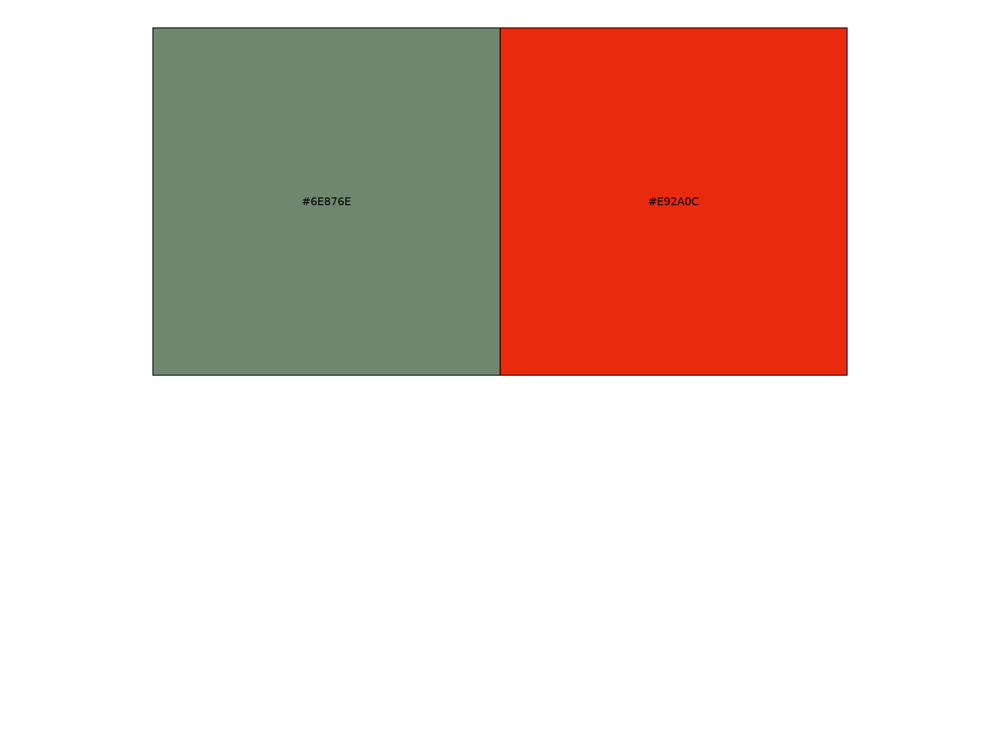

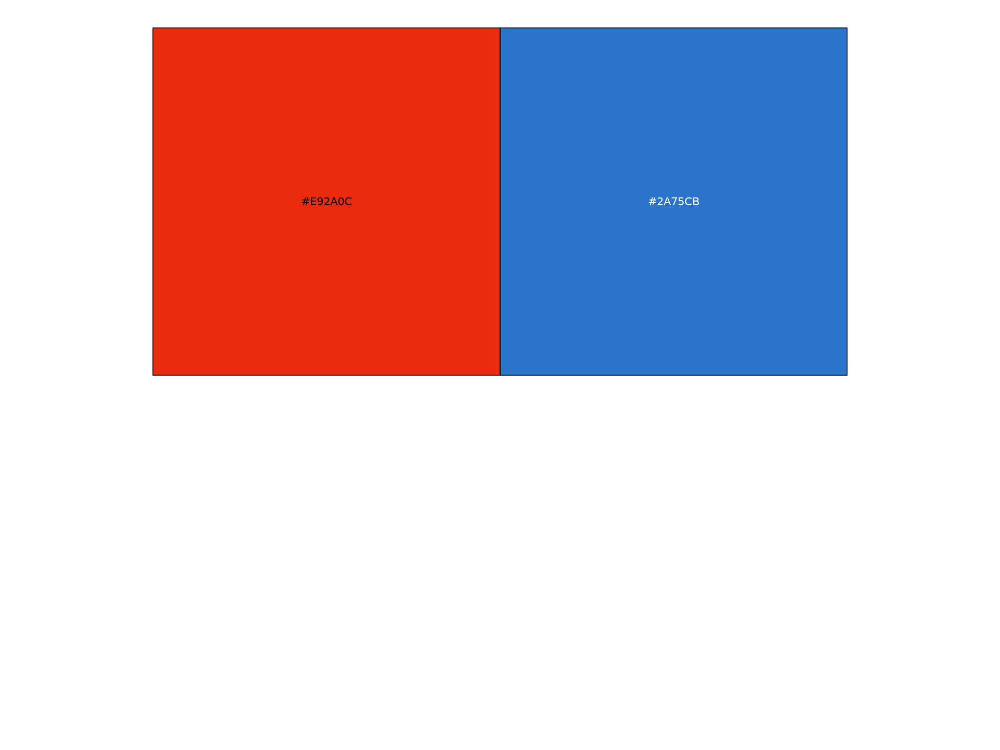

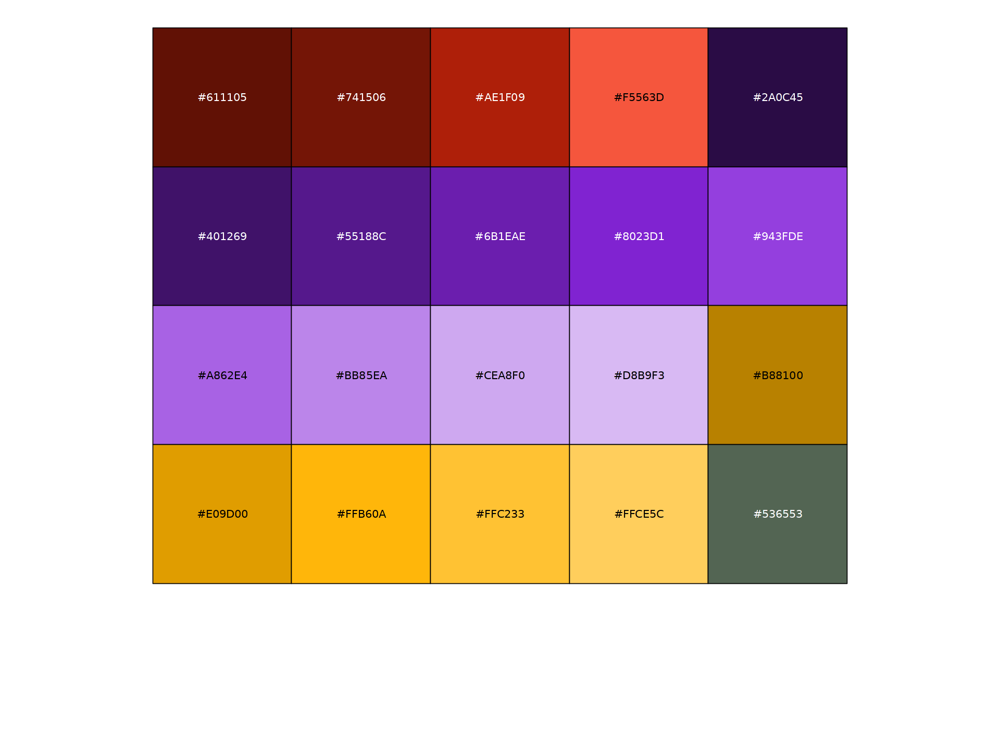

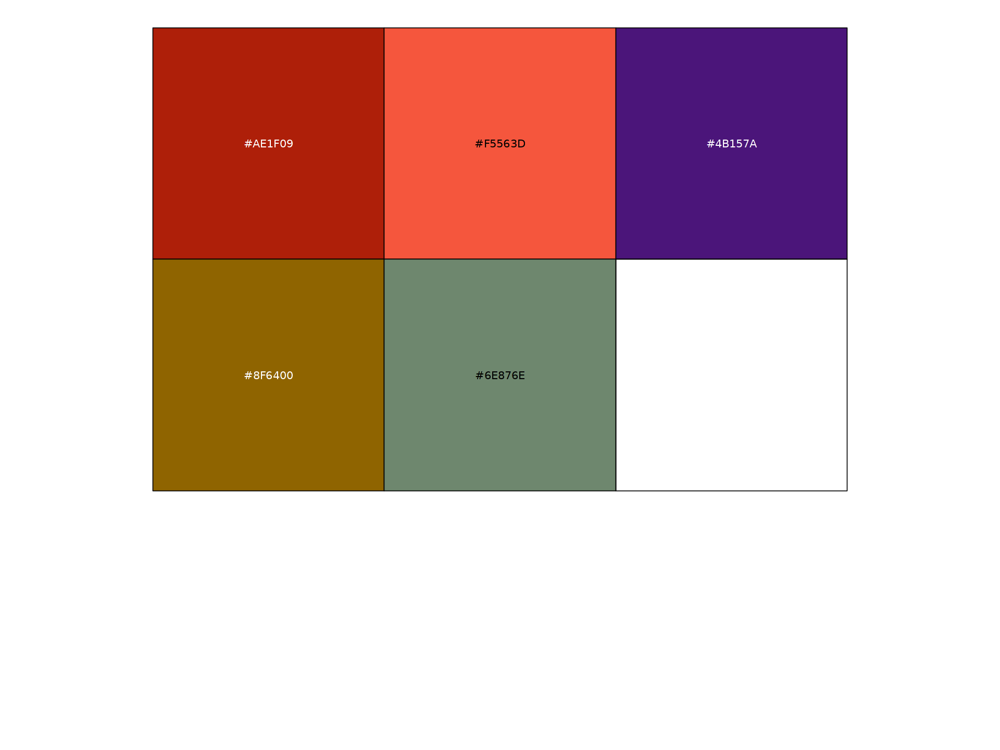

In [7]:
orig.ident_colors <- c("#2E382E", "#404F40", "#536553", "#657B65", "#789178", "#8FA38F", "#A5B6A5", "#D2DAD2", "#E9EDE9", 
                       "#7A5600", "#F5AB00", "#FFC233", "#FFD470", "#FFE7AD", "#FFF3D6",
                       "#AE1F09", "#E92A0C", "#F5563D", "#F88877", "#FDDDD8",
                       "#714947", "#97615E", "#B08482", "#C8A9A7", "#E0CECD", "#EFE7E6")
names(orig.ident_colors) <- c("EarlyCtrl2", "EarlyCtrl3", "EarlyCtrl4", "EarlyCtrlMale5", "EarlyCtrlFemale5", "PeakCtrl2", "PeakCtrl3", "LateCtrl2", "LateCtrl3",
                              "Early1", "EarlyFemale3", "EarlyMale3", "Early4", "EarlyMale5", "EarlyFemale5",
                              "Peak2", "Peak3", "PeakMale4", "PeakFemale4", "Peak5",
                              "Late1", "Late2", "Late3", "LateMale4", "LateFemale4", "Late5")

orig.ident_colors_contrast <- c("#97615E", "#E92A0C", "#F5AB00", "#6E876E", "#26C485", "#C16200", "#2A75CB", "#5B1865", "#E54F6D",
                                "#97615E", "#F5AB00", "#6E876E", "#26C485", "#C16200", "#2A75CB",
                                "#97615E", "#E92A0C", "#F5AB00", "#6E876E", "#26C485",
                                "#97615E", "#E92A0C", "#F5AB00", "#6E876E", "#26C485", "#C16200")
names(orig.ident_colors_contrast) <- c("EarlyCtrl2", "EarlyCtrl3", "EarlyCtrl4", "EarlyCtrlMale5", "EarlyCtrlFemale5", "PeakCtrl2", "PeakCtrl3", "LateCtrl2", "LateCtrl3",
                              "Early1", "EarlyFemale3", "EarlyMale3", "Early4", "EarlyMale5", "EarlyFemale5",
                              "Peak2", "Peak3", "PeakMale4", "PeakFemale4", "Peak5",
                              "Late1", "Late2", "Late3", "LateMale4", "LateFemale4", "Late5")

orig.ident_merge_colors <- c("#6E876E", "#F5AB00", "#E92A0C", "#97615E")
names(orig.ident_merge_colors) <- c("Ctrl", "Early", "Peak", "Late")

batch_colors <- c("#2A75CB", "#6E876E", "#F5AB00", "#E92A0C", "#97615E", "#98CE00", "#E54F6D")
names(batch_colors) <- c("B1", "B2", "B3", "B4", "B5", "B6", "B8")

model_colors <- c("#6E876E", "#E92A0C")
names(model_colors) <- c("Ctrl", "EAE")
show_col(model_colors)

duo_colors <- c("#E92A0C", "#2A75CB")
show_col(duo_colors)

sex_colors <- duo_colors
names(sex_colors) <- c("F", "M")

immune_colors <- c("#A9DFBF", "#FF000080")
names(immune_colors) <- c("NonImmune", "Immune")
#show_col(immune_colors)

immuneAll_colors <- c("lightgrey", "blue", "orange", "red")
names(immuneAll_colors) <- c("None", "RNA", "GenePromAcc", "Both")
#show_col(immuneAll_colors)

doublets_colors <- c("#A9DFBF", "#FF000080")
names(doublets_colors) <- c("Singlet", "Doublet")
#show_col(doublets_colors)

debris_colors <- duo_colors
names(debris_colors) <- c("Percoll", "Debris")

date_tissue_coll_colors <- scales::viridis_pal()(17)
names(date_tissue_coll_colors) <- c('2021_04_30','2021_05_03','2021_05_31','2021_09_30','2021_10_06','2021_11_26','2022_03_09','2022_03_10','2022_08_03','2022_08_24','2023_01_23','2023_02_15','2023_03_22','2023_06_15','2023_06_14','2022_05_12','2022_05_16')
#show_col(date_tissue_coll_colors)

date_exp_colors <- scales::viridis_pal()(7)
names(date_exp_colors) <- c('2021_04_20','2021_09_22','2021_11_17','2022_01_31','2022_07_18','2023_01_09','2023_06_05')
#show_col(date_exp_colors)

EAE_score_mean_colors <- scales::viridis_pal()(7)
names(EAE_score_mean_colors) <- c(0,0.5,2,2.25,2.33,2.5,3)
#show_col(EAE_score_mean_colors)

cellType_OL_colors <- c("#611105", "#741506", "#AE1F09", "#F5563D", "#2A0C45","#401269","#55188C","#6B1EAE","#8023D1","#943FDE","#A862E4","#BB85EA","#CEA8F0","#D8B9F3","#B88100","#E09D00","#FFB60A","#FFC233","#FFCE5C","#536553")
names(cellType_OL_colors) <- c("OPC-α", "OPC-β", "OPC-γ", "COP", "MOL56-α","MOL56-β","MOL56-γ","MOL56-δ","MOL56-ε","MOL56-ζ","MOL56-η","MOL56-θ","MOL56-ι","MOL56-κ","MOL2-α","MOL2-β","MOL2-γ","MOL2-δ","MOL2-ε","MOL1")
show_col(cellType_OL_colors)

cellType_OL_merge_colors <- c("#AE1F09","#F5563D","#4B157A","#8F6400", "#6E876E")
names(cellType_OL_merge_colors) <- c("OPC", "COP", "MOL56", "MOL2", "MOL1")
show_col(cellType_OL_merge_colors)

#origCT_colors <- c('#8F6400','#4B157A','#4B157A','#4B157A','#4B157A','#4B157A','#4B157A','#AE1F09','#4B157A','#4B157A','#8F6400','#4B157A','#8F6400','#8F6400','#4B157A','#4B157A','#4B157A','#4B157A','#4B157A','#8F6400','#8F6400','#8F6400','#8F6400','#8F6400','#4B157A','#AE1F09','#4B157A','#8F6400','#8F6400','#6E876E','#AE1F09','#4B157A','#4B157A','#4B157A','#8F6400','#8F6400','#4B157A','#AE1F09','#4B157A','#4B157A','#8F6400','#8F6400','#4B157A','#4B157A','#AE1F09','#8F6400','#8F6400','#AE1F09','#4B157A','#AE1F09','#6E876E','#8F6400','#AE1F09','#8F6400','#8F6400','#F5563D','#AE1F09','#AE1F09','#F5563D','#AE1F09','#4B157A','#8F6400','#8F6400','#8F6400','#6E876E','#AE1F09','#6E876E','#F5563D','#F5563D','#8F6400','#AE1F09','#8F6400','#AE1F09','#8F6400','#6E876E','#AE1F09','#F5563D','#AE1F09','#F5563D','#AE1F09','#6E876E','#6E876E','#AE1F09','#F5563D','#6E876E','#F5563D','#AE1F09','#F5563D','#AE1F09','#AE1F09','#6E876E','#AE1F09','#AE1F09','#F5563D','#6E876E','#F5563D','#6E876E','#6E876E','#F5563D','#F5563D','#F5563D','#6E876E','#F5563D','#AE1F09','#F5563D','#F5563D','#6E876E','#F5563D','#AE1F09','#F5563D','#6E876E','#6E876E','#AE1F09','#6E876E','#6E876E','#6E876E','#F5563D','#F5563D')
#names(origCT_colors) <- c('LateCtrl2MOL2','LateCtrl3MOL56','EarlyFemale5MOL56','PeakCtrl3MOL56','Early1MOL56','EarlyMale5MOL56','Late1MOL56','PeakFemale4OPC','Peak5MOL56','LateCtrl2MOL56','LateFemale4MOL2','EarlyCtrlMale5MOL56','EarlyFemale5MOL2','Late3MOL2','EarlyCtrlFemale5MOL56','EarlyFemale3MOL56','EarlyMale3MOL56','EarlyCtrl4MOL56','PeakFemale4MOL56','EarlyCtrl4MOL2','EarlyCtrlFemale5MOL2','Peak5MOL2','Late5MOL2','Peak2MOL2','PeakCtrl2MOL56','Late2OPC','EarlyCtrl3MOL56','EarlyCtrl3MOL2','PeakMale4MOL2','EarlyCtrlFemale5MOL1','LateFemale4OPC','Early4MOL56','Late3MOL56','Peak2MOL56','Early4MOL2','EarlyCtrlMale5MOL2','Late5MOL56','EarlyMale5OPC','LateMale4MOL56','PeakMale4MOL56','LateCtrl3MOL2','LateMale4MOL2','Late2MOL56','LateFemale4MOL56','LateMale4OPC','Late1MOL2','PeakFemale4MOL2','EarlyFemale5OPC','Peak3MOL56','PeakMale4OPC','LateMale4MOL1','EarlyMale5MOL2','EarlyCtrl4OPC','Peak3MOL2','Early1MOL2','Late5COP','Late5OPC','EarlyCtrlFemale5OPC','LateMale4COP','Peak5OPC','EarlyCtrl2MOL56','EarlyMale3MOL2','Late2MOL2','PeakCtrl2MOL2','Late2MOL1','LateCtrl3OPC','EarlyFemale3MOL1','PeakMale4COP','EarlyFemale5COP','EarlyCtrl2MOL2','Early4OPC','PeakCtrl3MOL2','EarlyCtrlMale5OPC','EarlyFemale3MOL2','Late1MOL1','Peak3OPC','EarlyCtrl4COP','PeakCtrl3OPC','LateFemale4COP','Early1OPC','Peak3MOL1','EarlyCtrlMale5MOL1','Late3OPC','EarlyCtrlFemale5COP','Late5MOL1','Late2COP','Peak2OPC','EarlyMale5COP','Late1OPC','LateCtrl2OPC','EarlyCtrl3MOL1','EarlyCtrl3OPC','PeakCtrl2OPC','Early4COP','EarlyMale3MOL1','PeakFemale4COP','Late3MOL1','LateFemale4MOL1','Late3COP','EarlyCtrlMale5COP','LateCtrl2COP','LateCtrl2MOL1','Peak5COP','EarlyMale3OPC','PeakCtrl2COP','LateCtrl3COP','EarlyCtrl4MOL1','Peak3COP','EarlyFemale3OPC','EarlyCtrl3COP','PeakMale4MOL1','Peak5MOL1','EarlyCtrl2OPC','Early4MOL1','EarlyFemale5MOL1','EarlyMale5MOL1','Late1COP','Peak2COP')
    

In [8]:
#Set up ATAC annotation
annotations <- GetGRangesFromEnsDb(ensdb = EnsDb.Mmusculus.v79, verbose =FALSE)
ucsc.levels <- str_replace(string=paste("chr",seqlevels(annotations),sep=""), pattern="chrMT", replacement="chrM")
seqlevels(annotations) <- ucsc.levels
genome(annotations) <- "mm10"

Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warn

## 2. Loading datasets

In [9]:
MORNAATACCOL <- readRDS(paste0(OS_path_outputs, "MORNAATACCOL_DORCs.rds"))

## 3. RNA expression analysis

https://hbctraining.github.io/DGE_workshop/lessons/04_DGE_DESeq2_analysis.html#:~:text=The%20DESeq2%20dispersion%20estimates%20are,only%20based%20on%20their%20variance

https://support.bioconductor.org/p/9143599/

### 3.1 Differential Genes Expression at cell type level (DGE)

In [14]:
DefaultAssay(MORNAATACCOL) <- "RNA"

In [15]:
MORNAATACCOL$origCT <- paste0(MORNAATACCOL$orig.ident,MORNAATACCOL$cellType_OL_merge)

In [16]:
MORNAATACCOL_sce <- as.SingleCellExperiment(MORNAATACCOL, assay="RNA")

In [17]:
MORNAATACCOL_sce <- prepSCE(MORNAATACCOL_sce, kid = "orig.ident_merge", gid = "cellType_OL_merge", sid = "origCT", drop = FALSE)

In [18]:
kids <- purrr::set_names(levels(MORNAATACCOL_sce$cluster_id))

# Total number of clusters
nk <- length(kids)

# Named vector of sample names
sids <- purrr::set_names(levels(MORNAATACCOL_sce$sample_id))

# Total number of samples 
ns <- length(sids)

In [20]:
## Determine the number of cells per sample
table(MORNAATACCOL_sce$sample_id)

## Turn named vector into a numeric vector of number of cells per sample
n_cells <- as.numeric(table(MORNAATACCOL_sce$sample_id))

## Determine how to reoder the samples (rows) of the metadata to match the order of sample names in sids vector
m <- match(sids, MORNAATACCOL_sce$sample_id)

## Create the sample level metadata by combining the reordered metadata with the number of cells corresponding to each sample.
ei <- data.frame(colData(MORNAATACCOL_sce)[m, ], n_cells, row.names = NULL) %>% select(-"cluster_id")
ei


           Early1MOL2           Early1MOL56             Early1OPC 
                  340                  3250                    19 
            Early4COP            Early4MOL1            Early4MOL2 
                   14                     1                   162 
          Early4MOL56             Early4OPC        EarlyCtrl2MOL2 
                  977                    89                    60 
      EarlyCtrl2MOL56         EarlyCtrl2OPC         EarlyCtrl3COP 
                  277                     1                     1 
       EarlyCtrl3MOL1        EarlyCtrl3MOL2       EarlyCtrl3MOL56 
                   75                   239                  2792 
        EarlyCtrl3OPC         EarlyCtrl4COP        EarlyCtrl4MOL1 
                    2                    49                     2 
       EarlyCtrl4MOL2       EarlyCtrl4MOL56         EarlyCtrl4OPC 
                 1919                  4360                   325 
  EarlyCtrlFemale5COP  EarlyCtrlFemale5MOL1  EarlyCtrlFemale5

sample_id,group_id,orig.ident,batch,model,Sex,debrisRemoval,date_tissue_collection,date_experiment,nbMouse,EAE_score_mean,cellType,cellType_OL,Immune,ImmuneGenePromAcc,ImmuneAll,nCount_RAW,nFeature_RAW,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_peaks,nFeature_peaks,nCount_GenePromAcc,nFeature_GenePromAcc,frequency_count,mononucleosomal,nucleosome_free,reads_count,percent.mt,log10GenesUMI,mitoRatio,S.Score,G2M.Score,Phase,CC.Difference,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,FRiP,pANN,DF.classifications,pct_chrY,pct_chrX,Xist_score,Sex_predictions,Sex_predictions_F,Sex_predictions_M,⋯,zscore_NaiveGenePromAcc.complement,pvalue_NaiveGenePromAcc.complement,ImmuneGenePromAcc.complement,ImmuneScoreGenePromAcc.pos_reg_imm_response,ImmuneScoreScaledGenePromAcc.pos_reg_imm_response,zscore_NaiveGenePromAcc.pos_reg_imm_response,pvalue_NaiveGenePromAcc.pos_reg_imm_response,ImmuneGenePromAcc.pos_reg_imm_response,ImmuneScoreGenePromAcc.neg_reg_imm_response,ImmuneScoreScaledGenePromAcc.neg_reg_imm_response,zscore_NaiveGenePromAcc.neg_reg_imm_response,pvalue_NaiveGenePromAcc.neg_reg_imm_response,ImmuneGenePromAcc.neg_reg_imm_response,ImmuneScoreGenePromAcc.antig_proc_presen,ImmuneScoreScaledGenePromAcc.antig_proc_presen,zscore_NaiveGenePromAcc.antig_proc_presen,pvalue_NaiveGenePromAcc.antig_proc_presen,ImmuneGenePromAcc.antig_proc_presen,ImmuneScoreGenePromAcc.pos_reg_int_media,ImmuneScoreScaledGenePromAcc.pos_reg_int_media,zscore_NaiveGenePromAcc.pos_reg_int_media,pvalue_NaiveGenePromAcc.pos_reg_int_media,ImmuneGenePromAcc.pos_reg_int_media,ImmuneScoreGenePromAcc.reg_cyto_prod,ImmuneScoreScaledGenePromAcc.reg_cyto_prod,zscore_NaiveGenePromAcc.reg_cyto_prod,pvalue_NaiveGenePromAcc.reg_cyto_prod,ImmuneGenePromAcc.reg_cyto_prod,ImmuneScoreGenePromAcc.Tcell_cd4,ImmuneScoreScaledGenePromAcc.Tcell_cd4,zscore_NaiveGenePromAcc.Tcell_cd4,pvalue_NaiveGenePromAcc.Tcell_cd4,ImmuneGenePromAcc.Tcell_cd4,ImmuneScoreGenePromAcc.Tcell_cd8,ImmuneScoreScaledGenePromAcc.Tcell_cd8,zscore_NaiveGenePromAcc.Tcell_cd8,pvalue_NaiveGenePromAcc.Tcell_cd8,ImmuneGenePromAcc.Tcell_cd8,nCount_GeneRegChrom,nFeature_GeneRegChrom,enhancerScore,snn_GeneRegChrom_OL_res.1.2,seurat_clusters_GeneRegChrom_OL,nCount_DORCs,nFeature_DORCs,DORCScore,snn_DORCs_OL_res.1.8,seurat_clusters_DORCs_OL,ident,n_cells
<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<dbl>
Early1MOL2,MOL2,Early1,B1,EAE,M,Percoll,2021_04_30,2021_04_20,2,0.5,MOL,MOL2-β,NonImmune,NonImmune,None,3056,1612,2937,1600,23009,9769,12690,9452,13701,6810,16119,4888,7891,59221,4.9370106,0.9239356,0.049370106,-0.0530612245,-0.0062864327,G1,-0.046774792,0.6132732,0.36,6.532188,0.37,0.7872697,0.07142857,Singlet,0.0000000000,0.04971059,-1.325,M,0.2834,0.7166,⋯,1.43145152,0.076150427,NonImmune,0.0121764410,0.5009327,1.14429573,0.126250508,NonImmune,-0.034438905,0.3240580,-0.59014822,0.72245436,NonImmune,-0.0165099466,0.35656323,0.256943145,0.398611332,NonImmune,-0.029737379,0.30650398,-0.10082041,5.401535e-01,NonImmune,-3.603557e-02,0.2601746,-0.61077494,0.72932571,NonImmune,-0.0111449172,0.3086469,-0.18453850,0.573204485,NonImmune,-0.049665478,0.2743194,-0.63922766,7.386626e-01,NonImmune,8060.678,5106,-0.36180905,0,0,11141.056,2581,0.4795134,9,9,9,340
Early1MOL56,MOL56,Early1,B1,EAE,F,Percoll,2021_04_30,2021_04_20,2,0.5,MOL,MOL56-β,NonImmune,NonImmune,None,1166,793,644,437,6043,2843,3281,2810,3534,2649,3930,1153,1952,16570,1.7080745,0.9400458,0.0170

In [21]:
## Remove lowly accessible features which have less than 10 cells with any counts
MORNAATACCOL_sce <- MORNAATACCOL_sce[rowSums(counts(MORNAATACCOL_sce) > 1) >= 10, ]

In [22]:
# Aggregate the counts per sample_id and cluster_id

# Subset metadata to only include the cluster and sample IDs to aggregate across
groups <- colData(MORNAATACCOL_sce)[, c("cluster_id", "sample_id")]

# Aggregate across cluster-sample groups
pb <- aggregate.Matrix(t(counts(MORNAATACCOL_sce)), groupings = groups, fun = "sum") 

In [23]:
splitf <- sapply(stringr::str_split(rownames(pb), pattern = "_", n = 2), `[`, 1)

In [24]:
pb <- split.data.frame(pb, factor(splitf)) %>% lapply(function(u) set_colnames(t(u), stringr::str_extract(rownames(u), "(?<=_)[:alnum:]+")))

class(pb)

# Explore the different components of list
str(pb)

[1] "list"

List of 4
 $ Ctrl :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:420780] 2 4 5 6 7 8 9 10 12 14 ...
  .. ..@ p       : int [1:40] 0 11127 24273 26769 27549 38829 51784 67103 70494 83130 ...
  .. ..@ Dim     : int [1:2] 15900 39
  .. ..@ Dimnames:List of 2
  .. .. ..$ : chr [1:15900] "0610005C13Rik" "0610006L08Rik" "0610009B22Rik" "0610009E02Rik" ...
  .. .. ..$ : chr [1:39] "EarlyCtrl2MOL2" "EarlyCtrl2MOL56" "EarlyCtrl2OPC" "EarlyCtrl3COP" ...
  .. ..@ x       : num [1:420780] 8 2 9 6 8 3 1 2 1 3 ...
  .. ..@ factors : list()
 $ Early:Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:291904] 0 2 3 4 5 6 7 8 9 11 ...
  .. ..@ p       : int [1:27] 0 13851 29379 40154 50695 53578 66973 82150 96140 98762 ...
  .. ..@ Dim     : int [1:2] 15900 26
  .. ..@ Dimnames:List of 2
  .. .. ..$ : chr [1:15900] "0610005C13Rik" "0610006L08Rik" "0610009B22Rik" "0610009E02Rik" ...
  .. .. ..$ : chr [1:26] "Early1MOL2" "Early1MOL56" "E

In [25]:
options(width = 100)
table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)

       
          OPC   COP MOL56  MOL2  MOL1
  Ctrl    642    92 33222  9234   103
  Early   771   158 26638  3362     8
  Peak    694   111  5644  8792     7
  Late   1388   641 13317 14935   424

In [26]:
options(width = 100)
table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)

       
        Early1MOL2 Early1MOL56 Early1OPC Early4COP Early4MOL1 Early4MOL2 Early4MOL56 Early4OPC
  Ctrl           0           0         0         0          0          0           0         0
  Early        340        3250        19        14          1        162         977        89
  Peak           0           0         0         0          0          0           0         0
  Late           0           0         0         0          0          0           0         0
       
        EarlyCtrl2MOL2 EarlyCtrl2MOL56 EarlyCtrl2OPC EarlyCtrl3COP EarlyCtrl3MOL1 EarlyCtrl3MOL2
  Ctrl              60             277             1             1             75            239
  Early              0               0             0             0              0              0
  Peak               0               0             0             0              0              0
  Late               0               0             0             0              0              0
       
        EarlyCtr

In [27]:
# Get sample names for each of the cell type clusters

# prep. data.frame for plotting
get_sample_ids <- function(x){pb[[x]] %>% colnames()}

de_samples <- purrr::map(1:length(kids), get_sample_ids) %>% unlist()

In [28]:
samples_list <- purrr::map(1:length(kids), get_sample_ids)

get_cluster_ids <- function(x){rep(names(pb)[x],each = length(samples_list[[x]]))}

de_cluster_ids <- purrr::map(1:length(kids), get_cluster_ids) %>% unlist()

In [29]:
combinaison_debris_sample <- unique(paste(colData(MORNAATACCOL_sce)$sample_id, colData(MORNAATACCOL_sce)$debrisRemoval, sep="_"))

In [30]:
de_debris_ids <- mapvalues(de_samples, 
from=unlist(lapply(strsplit(combinaison_debris_sample, "_"), function(x){x[1]})),
to=unlist(lapply(strsplit(combinaison_debris_sample, "_"), function(x){x[2]})))

In [31]:
gg_df <- data.frame(cluster_id = de_cluster_ids, sample_id = de_samples, debris_id=de_debris_ids)

gg_df <- left_join(gg_df, ei[, c("sample_id", "group_id")]) 

metadata <- gg_df %>% dplyr::select(cluster_id, sample_id, group_id, debris_id) 

Joining with `by = join_by(sample_id)`


In [32]:
levels(metadata$cluster_id) <- unique(metadata$cluster_id)

In [33]:
# Generate vector of cluster IDs
clusters <- levels(metadata$cluster_id)
clusters

[1] "Ctrl"  "Early" "Late"  "Peak"

In [34]:
HVGs.list <- list()

In [35]:
res.list <- list()

#### 3.1.1 Ctrl

In [36]:
cluster_choice <- "Ctrl"

In [37]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- unique(MORNAATACCOL$origCT)[!unique(MORNAATACCOL$origCT) %in% names(table_sample_low)]

Early1MOL2          Early1MOL56            Early1OPC            Early4COP 
                   0                    0                    0                    0 
          Early4MOL1           Early4MOL2          Early4MOL56            Early4OPC 
                   0                    0                    0                    0 
       EarlyCtrl2OPC        EarlyCtrl3COP        EarlyCtrl3OPC       EarlyCtrl4MOL1 
                   1                    1                    2                    2 
EarlyCtrlFemale5MOL1     EarlyFemale3MOL1     EarlyFemale3MOL2    EarlyFemale3MOL56 
                   3                    0                    0                    0 
     EarlyFemale3OPC      EarlyFemale5COP     EarlyFemale5MOL1     EarlyFemale5MOL2 
                   0                    0                    0                    0 
   EarlyFemale5MOL56      EarlyFemale5OPC       EarlyMale3MOL1       EarlyMale3MOL2 
                   0                    0                    0                    0 
     EarlyMale3MOL56        EarlyMale3OPC        EarlyMale5COP       EarlyMale5MOL1 
                   0                    0                    0                    0 
      EarlyMale5MOL2      EarlyMale5MOL56        EarlyMale5OPC             Late1COP 
                   0                    0                    0                    0 
           Late1MOL1            Late1MOL2           Late1MOL56             Late1OPC 
                   0                    0                    0                    0 
            Late2COP            Late2MOL1            Late2MOL2           Late2MOL56 
                   0                    0                    0                    0 
            Late2OPC             Late3COP            Late3MOL1            Late3MOL2 
                   0                    0                    0                    0 
          Late3MOL56             Late3OPC             Late5COP            Late5MOL1 
                   0                    0                    0                    0 
           Late5MOL2           Late5MOL56             Late5OPC         LateCtrl2COP 
                   0                    0                    0                    2 
       LateCtrl2MOL1         LateCtrl3COP       LateFemale4COP      LateFemale4MOL1 
                   1                    3                    0                    0 
     LateFemale4MOL2     LateFemale4MOL56       LateFemale4OPC         LateMale4COP 
                   0                    0                    0                    0 
       LateMale4MOL1        LateMale4MOL2       LateMale4MOL56         LateMale4OPC 
                   0                    0                    0                    0 
            Peak2COP            Peak2MOL2           Peak2MOL56             Peak2OPC 
                   0                    0                    0                    0 
            Peak3COP            Peak3MOL1            Peak3MOL2           Peak3MOL56 
                   0                    0                    0                    0 
            Peak3OPC             Peak5COP            Peak5MOL1            Peak5MOL2 
                   0                    0                    0                    0 
          Peak5MOL56             Peak5OPC         PeakCtrl2COP         PeakCtrl3OPC 
                   0                    0                    2                    4 
      PeakFemale4COP      PeakFemale4MOL2     PeakFemale4MOL56       PeakFemale4OPC 
                   0                    0                    0                    0 
        PeakMale4COP        PeakMale4MOL1        PeakMale4MOL2       PeakMale4MOL56 
                   0                    0                    0                    0 
        PeakMale4OPC 
                   0

In [38]:
table_group_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(cellType_OL_merge_colors)[!names(cellType_OL_merge_colors) %in% names(table_group_low)]

named integer(0)

In [39]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [40]:
cluster_metadata

,cluster_id,sample_id,group_id,debris_id
,<chr>,<chr>,<fct>,<chr>
EarlyCtrl2MOL2,Ctrl,EarlyCtrl2MOL2,MOL2,Percoll
EarlyCtrl2MOL56,Ctrl,EarlyCtrl2MOL56,MOL56,Percoll
EarlyCtrl2OPC,Ctrl,EarlyCtrl2OPC,OPC,Percoll
EarlyCtrl3COP,Ctrl,EarlyCtrl3COP,COP,Percoll
EarlyCtrl3MOL1,Ctrl,EarlyCtrl3MOL1,MOL1,Percoll
EarlyCtrl3MOL2,Ctrl,EarlyCtrl3MOL2,MOL2,Percoll
EarlyCtrl3MOL56,Ctrl,EarlyCtrl3MOL56,MOL56,Percoll
EarlyCtrl3OPC,Ctrl,EarlyCtrl3OPC,OPC,Percoll
EarlyCtrl4COP,Ctrl,EarlyCtrl4COP,COP,Debris


In [41]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [42]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [43]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [44]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



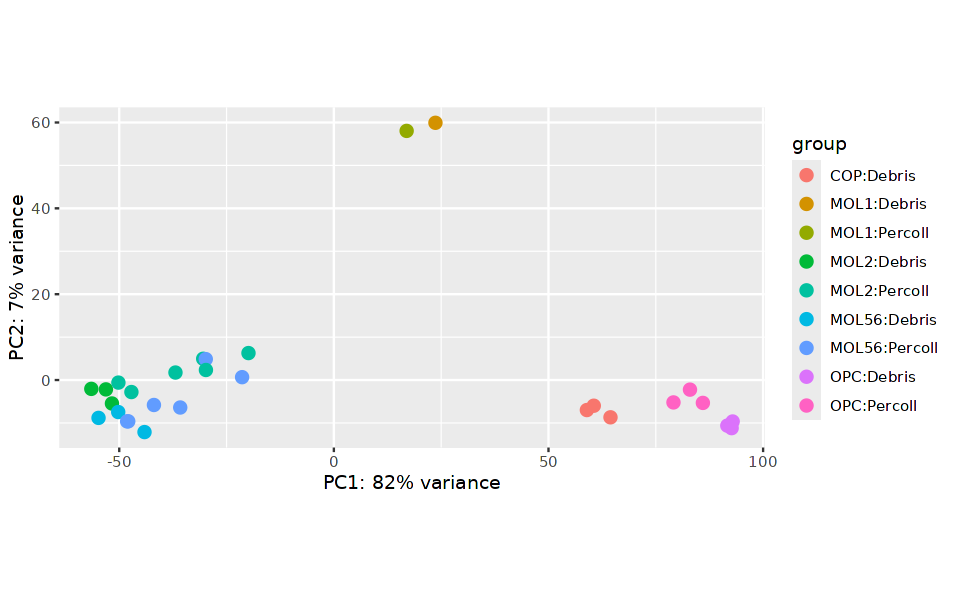

In [45]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [46]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

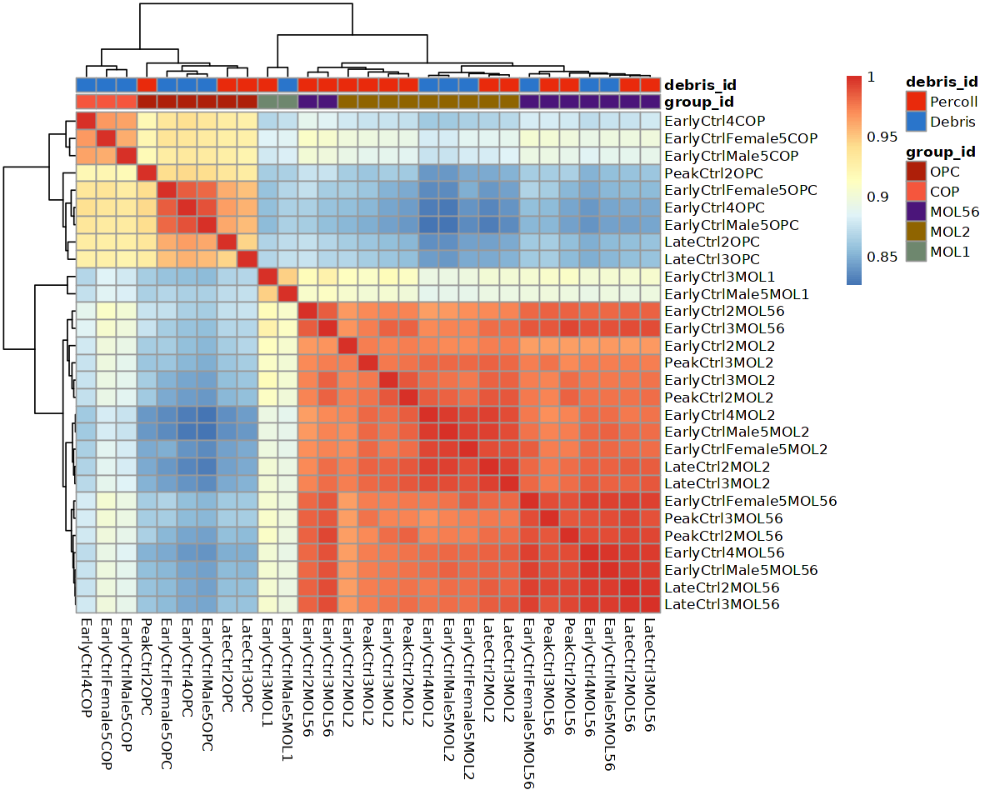

In [47]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=cellType_OL_merge_colors, debris_id=debris_colors))

In [48]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [49]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


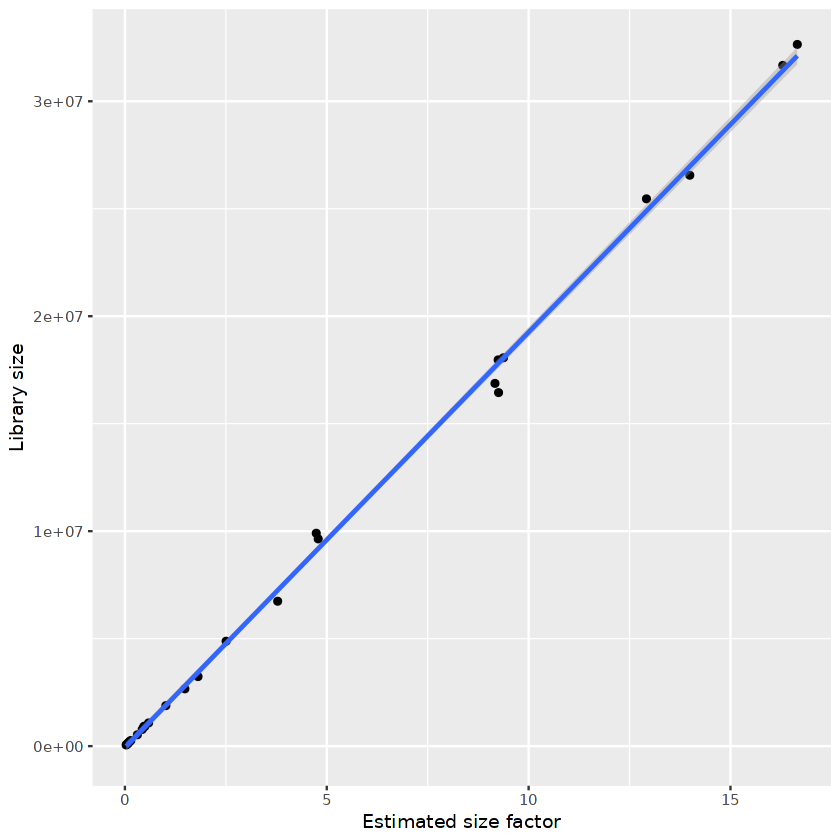

In [50]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [51]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
EarlyCtrl2MOL2,Ctrl,EarlyCtrl2MOL2,MOL2,Percoll,0.14586669
EarlyCtrl2MOL56,Ctrl,EarlyCtrl2MOL56,MOL56,Percoll,0.46607385
EarlyCtrl3MOL1,Ctrl,EarlyCtrl3MOL1,MOL1,Percoll,0.09878440
EarlyCtrl3MOL2,Ctrl,EarlyCtrl3MOL2,MOL2,Percoll,0.49118810
EarlyCtrl3MOL56,Ctrl,EarlyCtrl3MOL56,MOL56,Percoll,4.78785427
EarlyCtrl4COP,Ctrl,EarlyCtrl4COP,COP,Debris,0.30930730
EarlyCtrl4MOL2,Ctrl,EarlyCtrl4MOL2,MOL2,Debris,9.25528166
EarlyCtrl4MOL56,Ctrl,EarlyCtrl4MOL56,MOL56,Debris,13.99163370
EarlyCtrl4OPC,Ctrl,EarlyCtrl4OPC,OPC,Debris,1.48523487


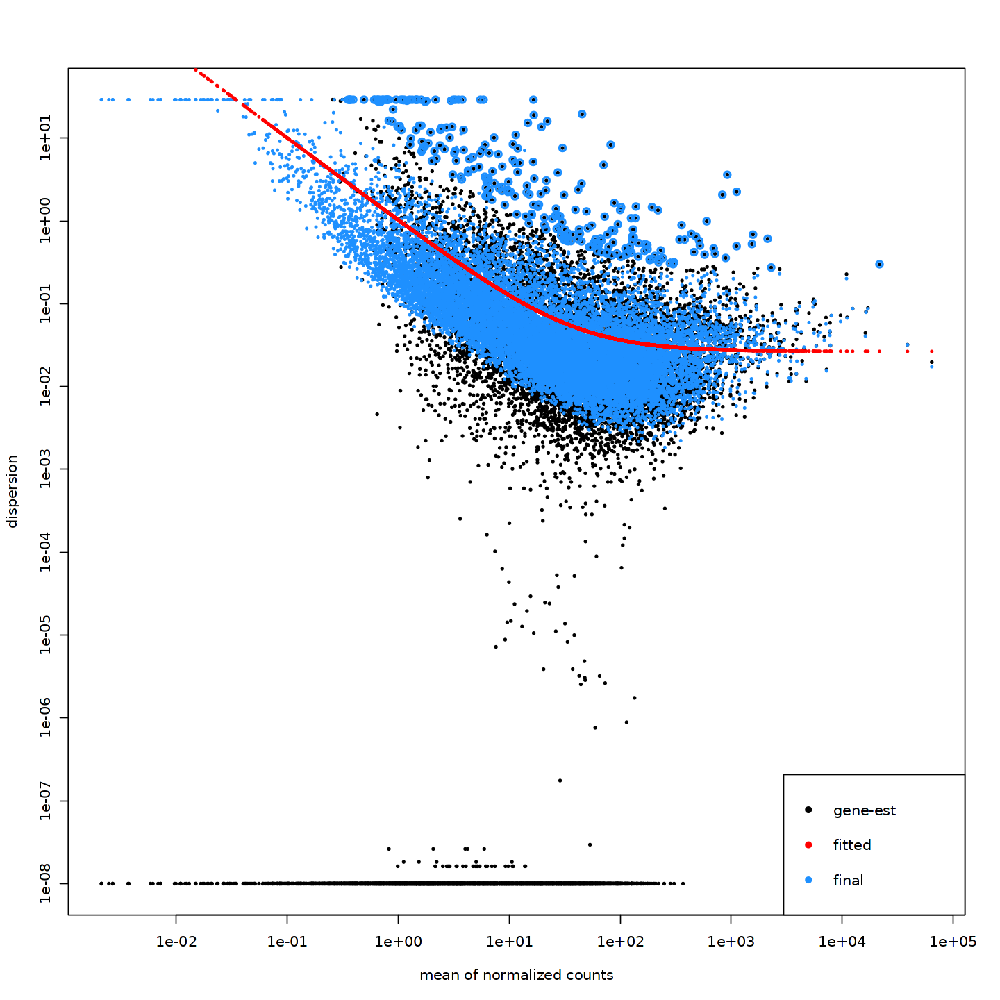

In [52]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

In [53]:
condition1 = "MOL56"
condition2 = "MOL2"

In [54]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [55]:
summary(res)


out of 15888 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1672, 11%
LFC < 0 (down)     : 1946, 12%
outliers [1]       : 9, 0.057%
low counts [2]     : 0, 0%
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



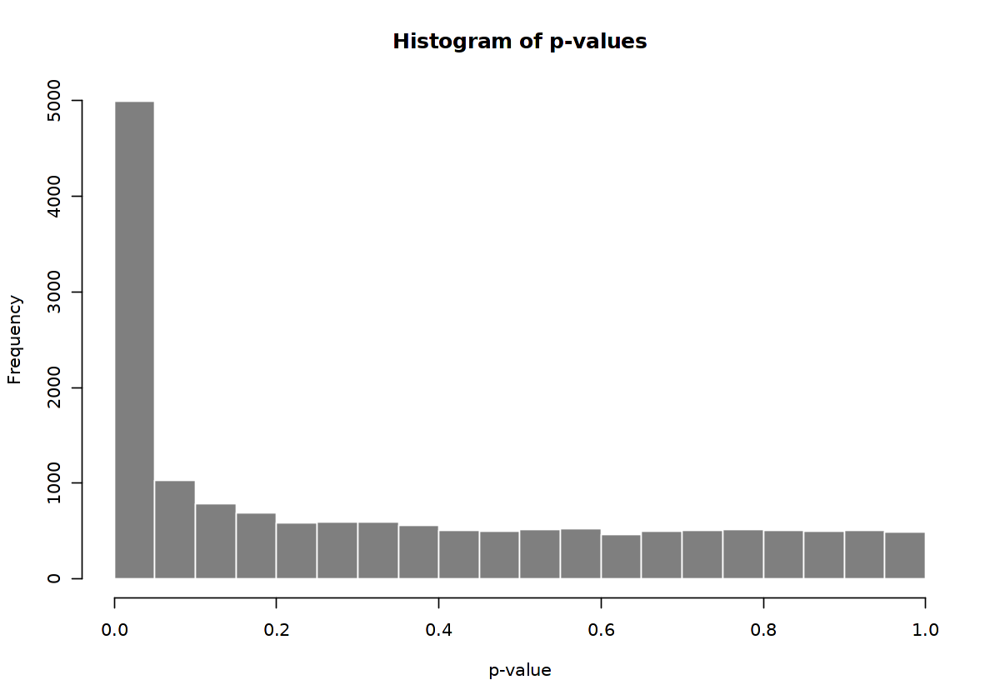

In [56]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

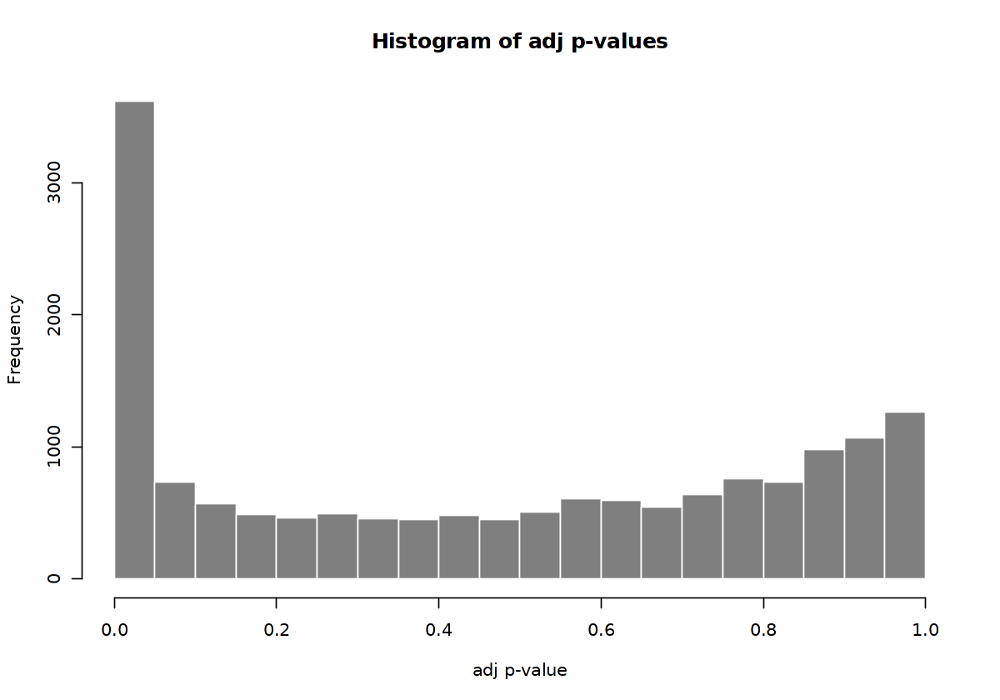

In [57]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

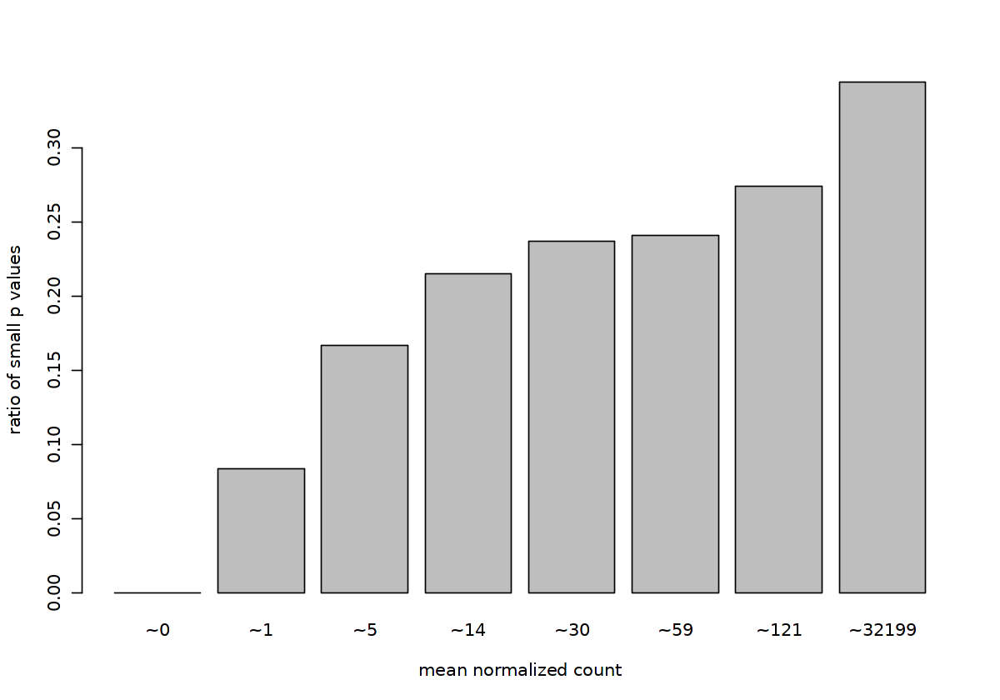

In [58]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

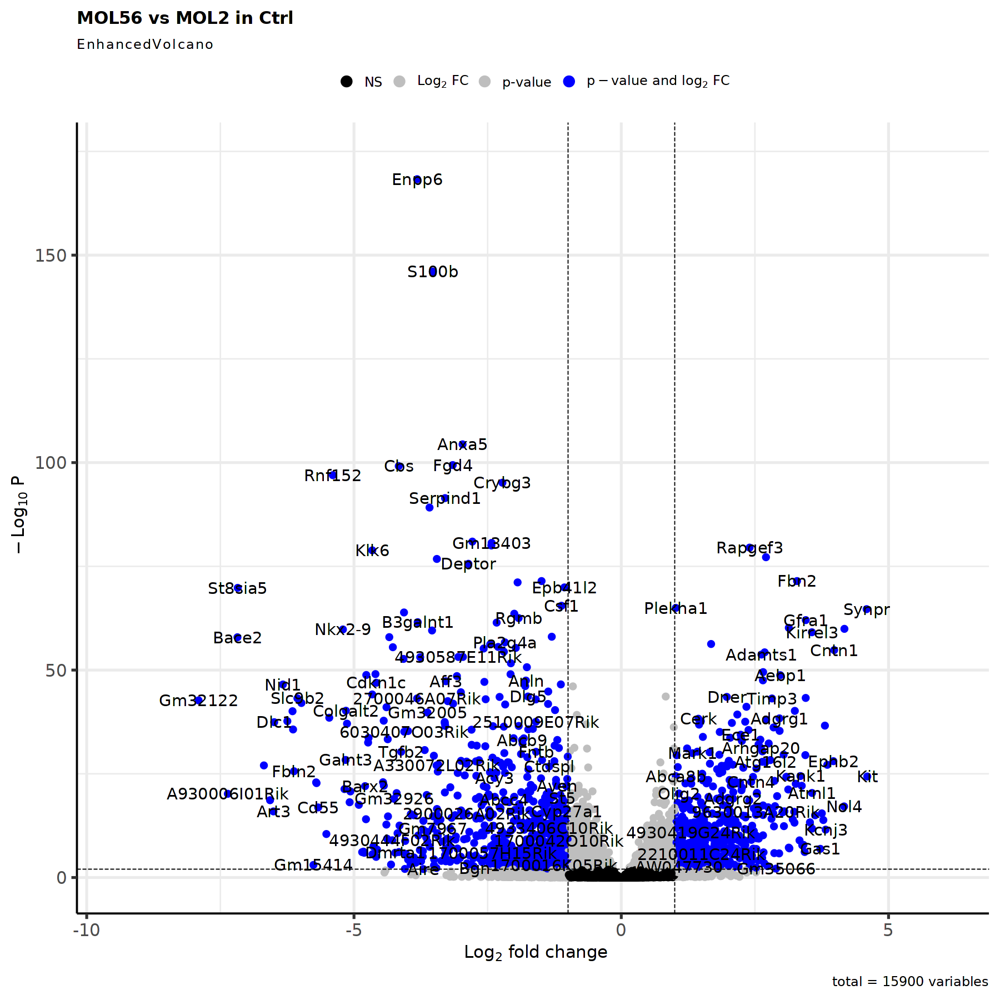

In [59]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [62]:
res <- res[complete.cases(res$padj),]

In [63]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [64]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id MOL56 vs MOL2 
Wald test p-value: group_id MOL56 vs MOL2 
DataFrame with 1190 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Gm32122        61.43903       -7.90738  0.557347 -14.18755 1.09413e-45 2.02019e-43
A930006I01Rik   4.75832       -7.35997  0.751695  -9.79116 1.22874e-22 6.61397e-21
Bace2          16.78138       -7.18026  0.434865 -16.51147 3.03413e-61 1.23536e-58
St8sia5        16.86864       -7.17502  0.395926 -18.12211 2.13255e-73 1.53922e-70
Scel           25.40842       -6.68542  0.591296 -11.30638 1.22014e-29 9.63914e-28
...                 ...            ...       ...       ...         ...         ...
Gm12002         8.51516        1.00356 0.2558552   3.92239 8.76747e-05 7.09576e-04
Srgap3        171.42768       -1.00338 0.1677631  -5.98092 2.21878e-09 3.71645e-08
Cyp2j6        258.18017        1.00299 0

In [65]:
nrow(res_filtered)

[1] 1190

In [66]:
res.list[[cluster_choice]] <- res

In [67]:
HVGs.list[[cluster_choice]] <- rownames(res_filtered)

#### 3.1.2 Early

In [68]:
cluster_choice <- "Early"

In [69]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- unique(MORNAATACCOL$origCT)[!unique(MORNAATACCOL$origCT) %in% names(table_sample_low)]

Early4MOL1        EarlyCtrl2MOL2       EarlyCtrl2MOL56         EarlyCtrl2OPC 
                    1                     0                     0                     0 
        EarlyCtrl3COP        EarlyCtrl3MOL1        EarlyCtrl3MOL2       EarlyCtrl3MOL56 
                    0                     0                     0                     0 
        EarlyCtrl3OPC         EarlyCtrl4COP        EarlyCtrl4MOL1        EarlyCtrl4MOL2 
                    0                     0                     0                     0 
      EarlyCtrl4MOL56         EarlyCtrl4OPC   EarlyCtrlFemale5COP  EarlyCtrlFemale5MOL1 
                    0                     0                     0                     0 
 EarlyCtrlFemale5MOL2 EarlyCtrlFemale5MOL56   EarlyCtrlFemale5OPC     EarlyCtrlMale5COP 
                    0                     0                     0                     0 
   EarlyCtrlMale5MOL1    EarlyCtrlMale5MOL2   EarlyCtrlMale5MOL56     EarlyCtrlMale5OPC 
                    0                     0                     0                     0 
     EarlyFemale3MOL1       EarlyFemale3OPC      EarlyFemale5MOL1        EarlyMale3MOL1 
                    2                     1                     1                     2 
       EarlyMale5MOL1              Late1COP             Late1MOL1             Late1MOL2 
                    2                     0                     0                     0 
           Late1MOL56              Late1OPC              Late2COP             Late2MOL1 
                    0                     0                     0                     0 
            Late2MOL2            Late2MOL56              Late2OPC              Late3COP 
                    0                     0                     0                     0 
            Late3MOL1             Late3MOL2            Late3MOL56              Late3OPC 
                    0                     0                     0                     0 
             Late5COP             Late5MOL1             Late5MOL2            Late5MOL56 
                    0                     0                     0                     0 
             Late5OPC          LateCtrl2COP         LateCtrl2MOL1         LateCtrl2MOL2 
                    0                     0                     0                     0 
       LateCtrl2MOL56          LateCtrl2OPC          LateCtrl3COP         LateCtrl3MOL2 
                    0                     0                     0                     0 
       LateCtrl3MOL56          LateCtrl3OPC        LateFemale4COP       LateFemale4MOL1 
                    0                     0                     0                     0 
      LateFemale4MOL2      LateFemale4MOL56        LateFemale4OPC          LateMale4COP 
                    0                     0                     0                     0 
        LateMale4MOL1         LateMale4MOL2        LateMale4MOL56          LateMale4OPC 
                    0                     0                     0                     0 
             Peak2COP             Peak2MOL2            Peak2MOL56              Peak2OPC 
                    0                     0                     0                     0 
             Peak3COP             Peak3MOL1             Peak3MOL2            Peak3MOL56 
                    0                     0                     0                     0 
             Peak3OPC              Peak5COP             Peak5MOL1             Peak5MOL2 
                    0                     0                     0                     0 
           Peak5MOL56              Peak5OPC          PeakCtrl2COP         PeakCtrl2MOL2 
                    0                     0                     0                     0 
       PeakCtrl2MOL56          PeakCtrl2OPC         PeakCtrl3MOL2        PeakCtrl3MOL56 
                    0                     0                     0                     0 
         PeakCtrl3OPC        PeakFemale4COP       PeakFemale4MOL2      PeakFemale4MOL56 
      

In [70]:
table_group_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(cellType_OL_merge_colors)[!names(cellType_OL_merge_colors) %in% names(table_group_low)]

MOL1 
   8

In [71]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [72]:
cluster_metadata

,cluster_id,sample_id,group_id,debris_id
,<chr>,<chr>,<fct>,<chr>
Early1MOL2,Early,Early1MOL2,MOL2,Percoll
Early1MOL56,Early,Early1MOL56,MOL56,Percoll
Early1OPC,Early,Early1OPC,OPC,Percoll
Early4COP,Early,Early4COP,COP,Debris
Early4MOL1,Early,Early4MOL1,MOL1,Debris
Early4MOL2,Early,Early4MOL2,MOL2,Debris
Early4MOL56,Early,Early4MOL56,MOL56,Debris
Early4OPC,Early,Early4OPC,OPC,Debris
EarlyFemale3MOL1,Early,EarlyFemale3MOL1,MOL1,Percoll


In [73]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [74]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [75]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [76]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



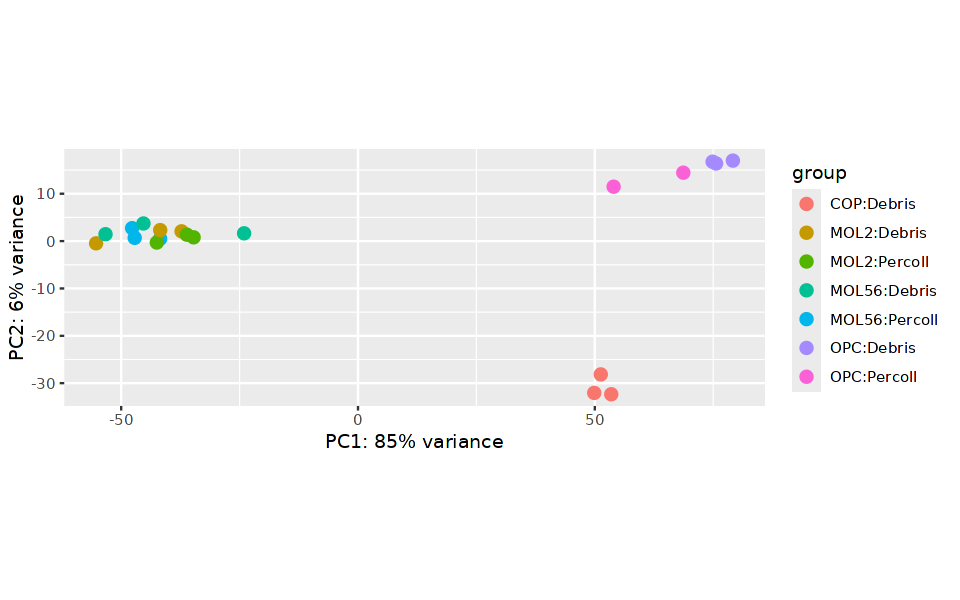

In [77]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [78]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

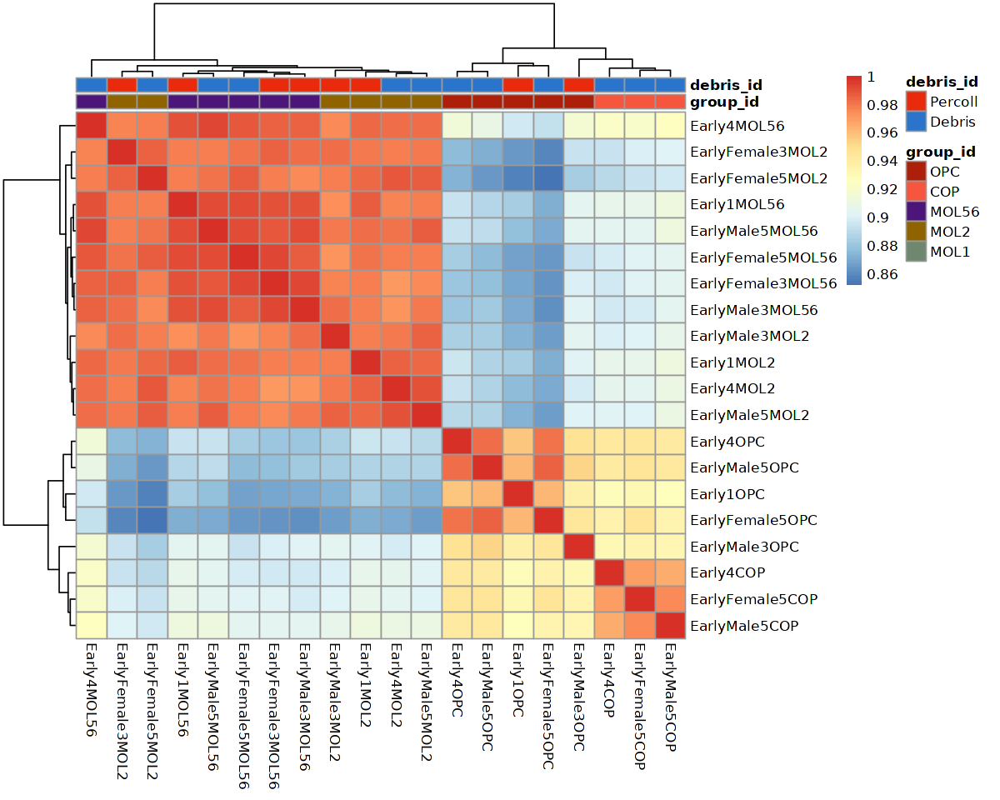

In [79]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=cellType_OL_merge_colors, debris_id=debris_colors))

In [80]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [81]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


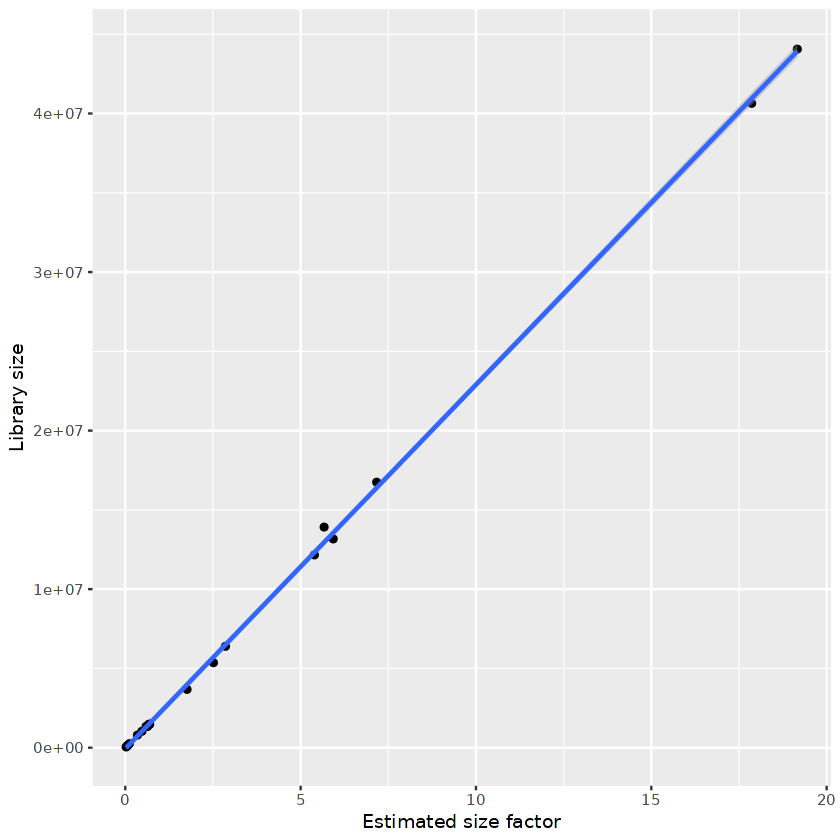

In [82]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [83]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
Early1MOL2,Early,Early1MOL2,MOL2,Percoll,0.68412778
Early1MOL56,Early,Early1MOL56,MOL56,Percoll,5.39364594
Early1OPC,Early,Early1OPC,OPC,Percoll,0.05150474
Early4COP,Early,Early4COP,COP,Debris,0.06995195
Early4MOL2,Early,Early4MOL2,MOL2,Debris,0.67190028
Early4MOL56,Early,Early4MOL56,MOL56,Debris,2.85663820
Early4OPC,Early,Early4OPC,OPC,Debris,0.34714046
EarlyFemale3MOL2,Early,EarlyFemale3MOL2,MOL2,Percoll,0.59423294
EarlyFemale3MOL56,Early,EarlyFemale3MOL56,MOL56,Percoll,5.66971364


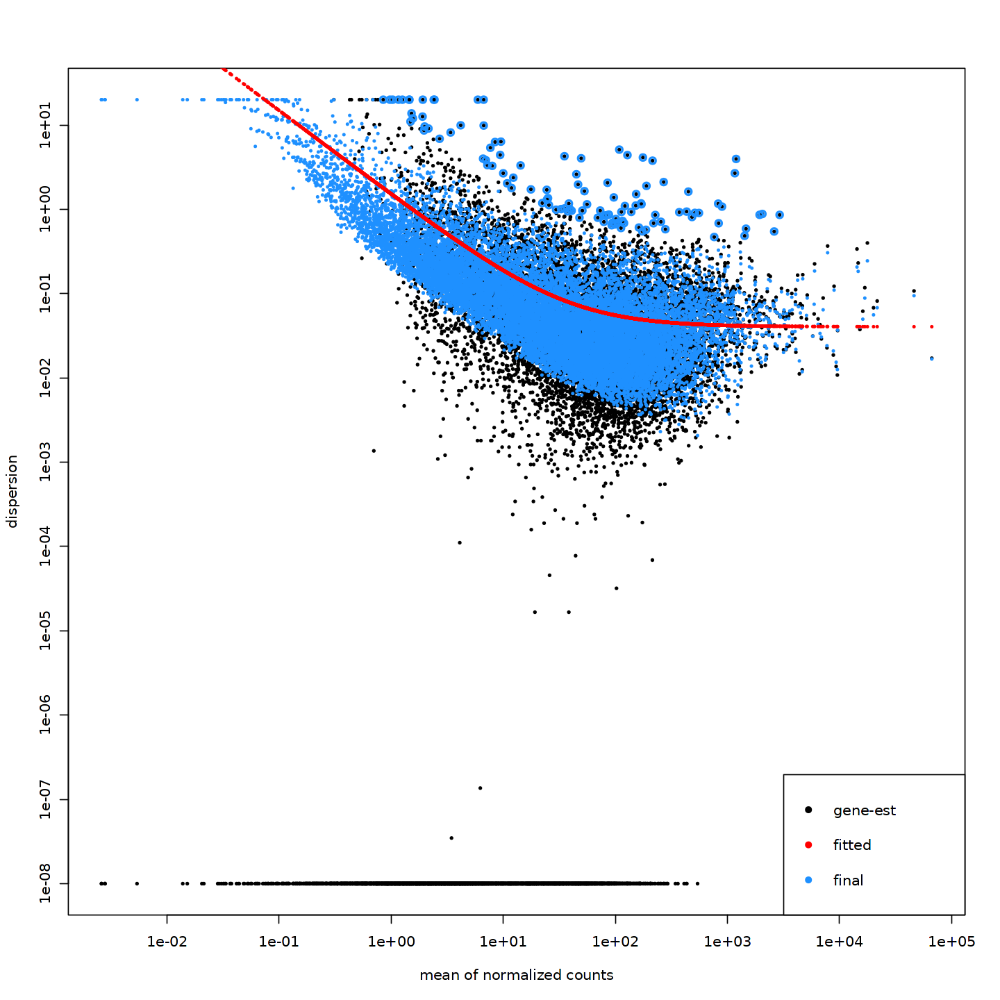

In [84]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

In [85]:
condition1 = "MOL56"
condition2 = "MOL2"

In [86]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [87]:
summary(res)


out of 15896 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 779, 4.9%
LFC < 0 (down)     : 1235, 7.8%
outliers [1]       : 10, 0.063%
low counts [2]     : 309, 1.9%
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



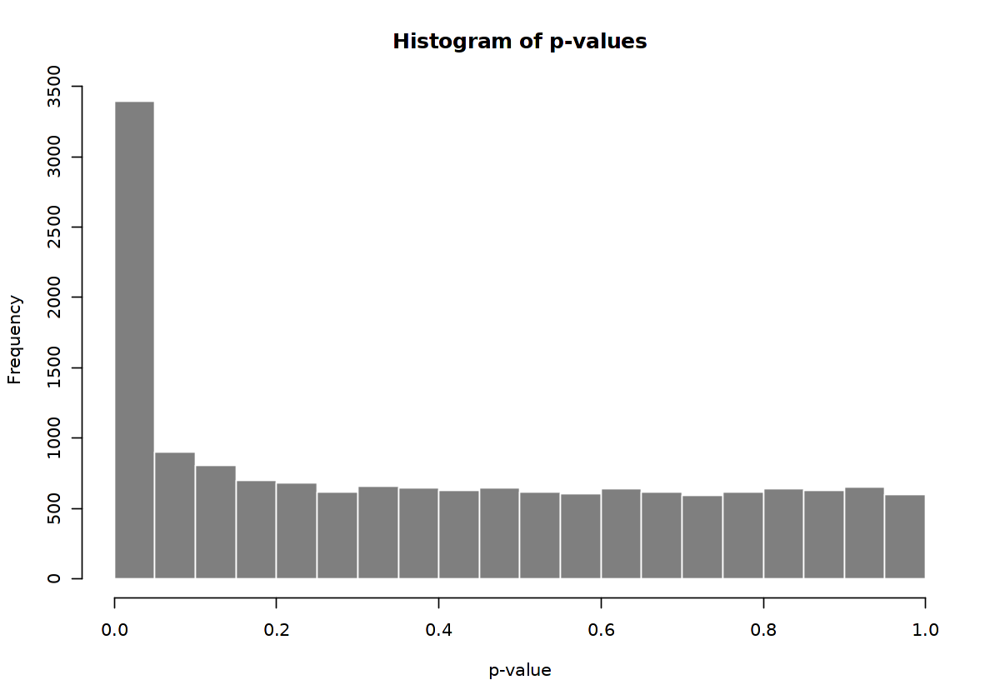

In [88]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

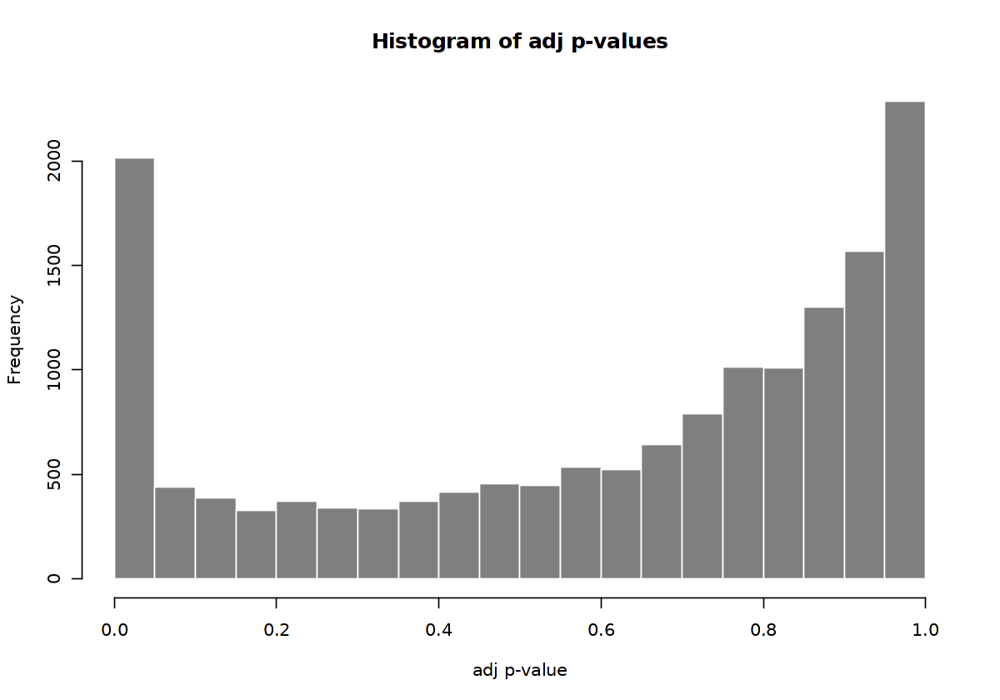

In [89]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

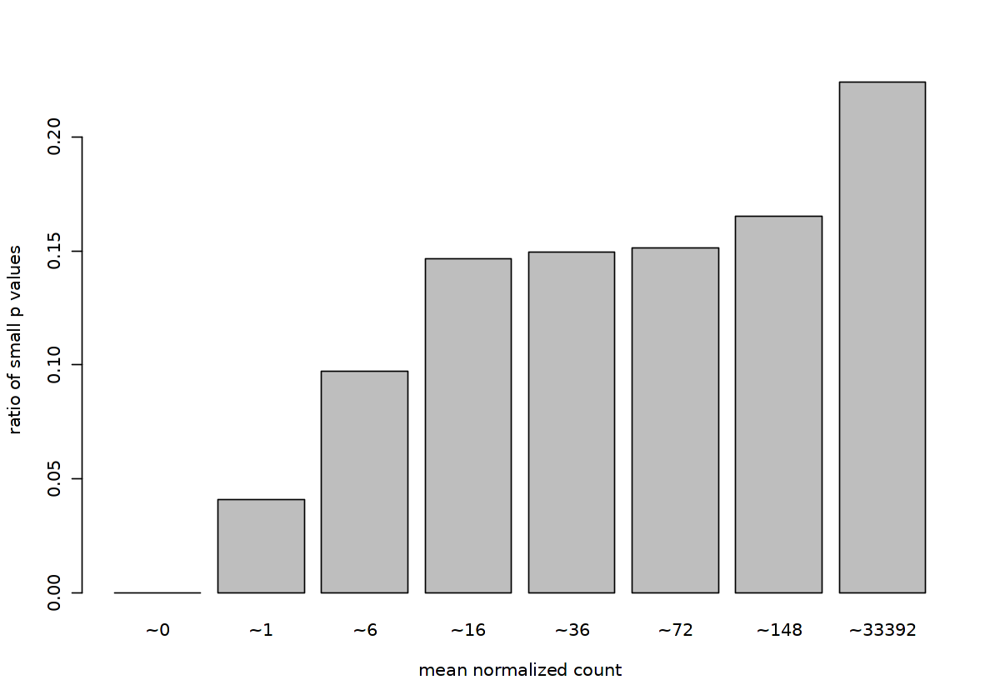

In [90]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

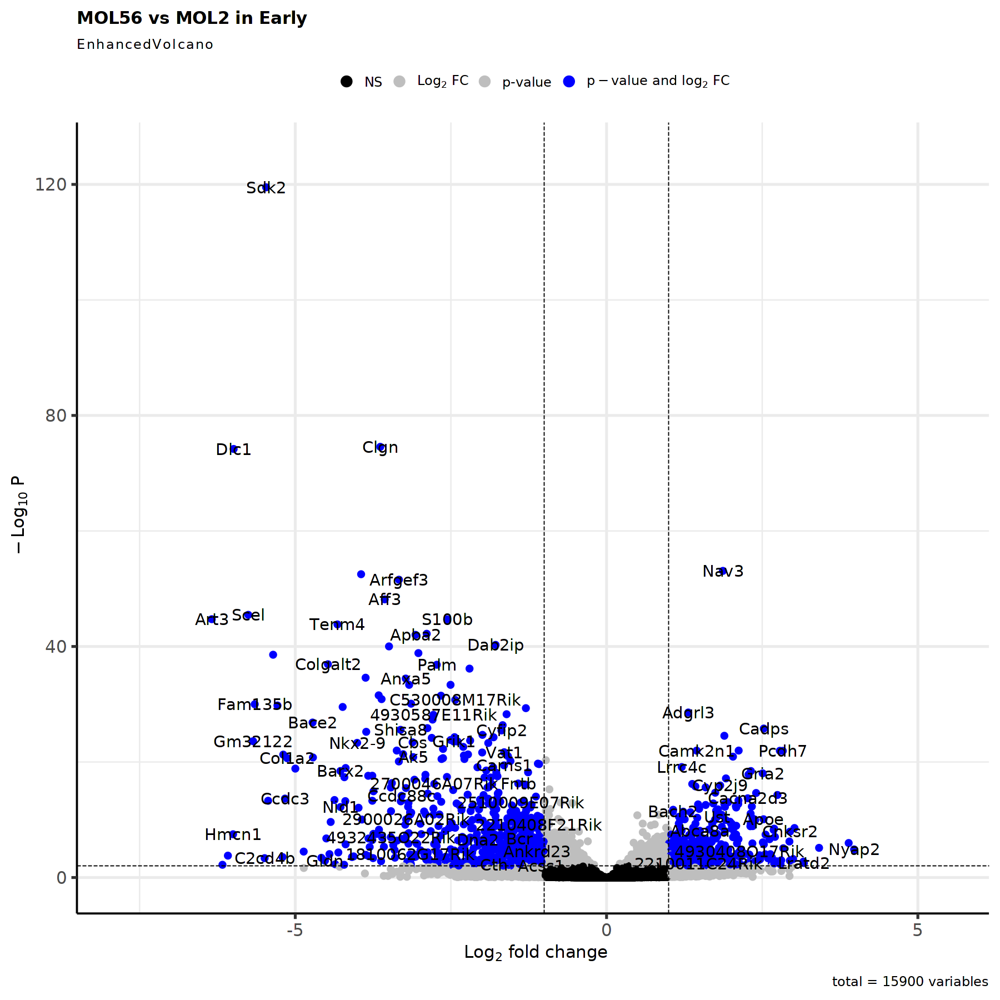

In [91]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [92]:
res <- res[complete.cases(res$padj),]

In [93]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [94]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id MOL56 vs MOL2 
Wald test p-value: group_id MOL56 vs MOL2 
DataFrame with 868 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Art3           32.53692       -6.34095  0.432390 -14.66489 1.08199e-48 1.87268e-45
Cd86            1.00198       -6.16953  1.779444  -3.46711 5.26086e-04 6.25083e-03
G630055G22Rik   1.03141       -6.08204  1.363878  -4.45937 8.21990e-06 1.62903e-04
Hmcn1           6.72876       -5.99857  0.974159  -6.15770 7.38112e-10 3.25710e-08
Dlc1          128.40087       -5.98952  0.319021 -18.77469 1.21665e-78 6.31726e-75
...                 ...            ...       ...       ...         ...         ...
Lypla2          45.5205        1.00547  0.268647   3.74270 1.82050e-04 2.51177e-03
Rhoq            80.5134        1.00367  0.182572   5.49740 3.85436e-08 1.22780e-06
Apeh            15.5193        1.00252  0

In [95]:
nrow(res_filtered)

[1] 868

In [96]:
res.list[[cluster_choice]] <- res

In [97]:
HVGs.list[[cluster_choice]] <- rownames(res_filtered)

#### 3.1.3 Peak

In [98]:
cluster_choice <- "Peak"

In [99]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- unique(MORNAATACCOL$origCT)[!unique(MORNAATACCOL$origCT) %in% names(table_sample_low)]

Early1MOL2           Early1MOL56             Early1OPC             Early4COP 
                    0                     0                     0                     0 
           Early4MOL1            Early4MOL2           Early4MOL56             Early4OPC 
                    0                     0                     0                     0 
       EarlyCtrl2MOL2       EarlyCtrl2MOL56         EarlyCtrl2OPC         EarlyCtrl3COP 
                    0                     0                     0                     0 
       EarlyCtrl3MOL1        EarlyCtrl3MOL2       EarlyCtrl3MOL56         EarlyCtrl3OPC 
                    0                     0                     0                     0 
        EarlyCtrl4COP        EarlyCtrl4MOL1        EarlyCtrl4MOL2       EarlyCtrl4MOL56 
                    0                     0                     0                     0 
        EarlyCtrl4OPC   EarlyCtrlFemale5COP  EarlyCtrlFemale5MOL1  EarlyCtrlFemale5MOL2 
                    0                     0                     0                     0 
EarlyCtrlFemale5MOL56   EarlyCtrlFemale5OPC     EarlyCtrlMale5COP    EarlyCtrlMale5MOL1 
                    0                     0                     0                     0 
   EarlyCtrlMale5MOL2   EarlyCtrlMale5MOL56     EarlyCtrlMale5OPC      EarlyFemale3MOL1 
                    0                     0                     0                     0 
     EarlyFemale3MOL2     EarlyFemale3MOL56       EarlyFemale3OPC       EarlyFemale5COP 
                    0                     0                     0                     0 
     EarlyFemale5MOL1      EarlyFemale5MOL2     EarlyFemale5MOL56       EarlyFemale5OPC 
                    0                     0                     0                     0 
       EarlyMale3MOL1        EarlyMale3MOL2       EarlyMale3MOL56         EarlyMale3OPC 
                    0                     0                     0                     0 
        EarlyMale5COP        EarlyMale5MOL1        EarlyMale5MOL2       EarlyMale5MOL56 
                    0                     0                     0                     0 
        EarlyMale5OPC              Late1COP             Late1MOL1             Late1MOL2 
                    0                     0                     0                     0 
           Late1MOL56              Late1OPC              Late2COP             Late2MOL1 
                    0                     0                     0                     0 
            Late2MOL2            Late2MOL56              Late2OPC              Late3COP 
                    0                     0                     0                     0 
            Late3MOL1             Late3MOL2            Late3MOL56              Late3OPC 
                    0                     0                     0                     0 
             Late5COP             Late5MOL1             Late5MOL2            Late5MOL56 
                    0                     0                     0                     0 
             Late5OPC          LateCtrl2COP         LateCtrl2MOL1         LateCtrl2MOL2 
                    0                     0                     0                     0 
       LateCtrl2MOL56          LateCtrl2OPC          LateCtrl3COP         LateCtrl3MOL2 
                    0                     0                     0                     0 
       LateCtrl3MOL56          LateCtrl3OPC        LateFemale4COP       LateFemale4MOL1 
                    0                     0                     0                     0 
      LateFemale4MOL2      LateFemale4MOL56        LateFemale4OPC          LateMale4COP 
                    0                     0                     0                     0 
        LateMale4MOL1         LateMale4MOL2        LateMale4MOL56          LateMale4OPC 
                    0                     0                     0                     0 
             Peak2COP              Peak3COP             Peak3MOL1             Peak5MOL1 
      

In [100]:
table_group_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(cellType_OL_merge_colors)[!names(cellType_OL_merge_colors) %in% names(table_group_low)]

MOL1 
   7

In [101]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [102]:
cluster_metadata

,cluster_id,sample_id,group_id,debris_id
,<chr>,<chr>,<fct>,<chr>
Peak2COP,Peak,Peak2COP,COP,Percoll
Peak2MOL2,Peak,Peak2MOL2,MOL2,Percoll
Peak2MOL56,Peak,Peak2MOL56,MOL56,Percoll
Peak2OPC,Peak,Peak2OPC,OPC,Percoll
Peak3COP,Peak,Peak3COP,COP,Percoll
Peak3MOL1,Peak,Peak3MOL1,MOL1,Percoll
Peak3MOL2,Peak,Peak3MOL2,MOL2,Percoll
Peak3MOL56,Peak,Peak3MOL56,MOL56,Percoll
Peak3OPC,Peak,Peak3OPC,OPC,Percoll


In [103]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [104]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [105]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [106]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



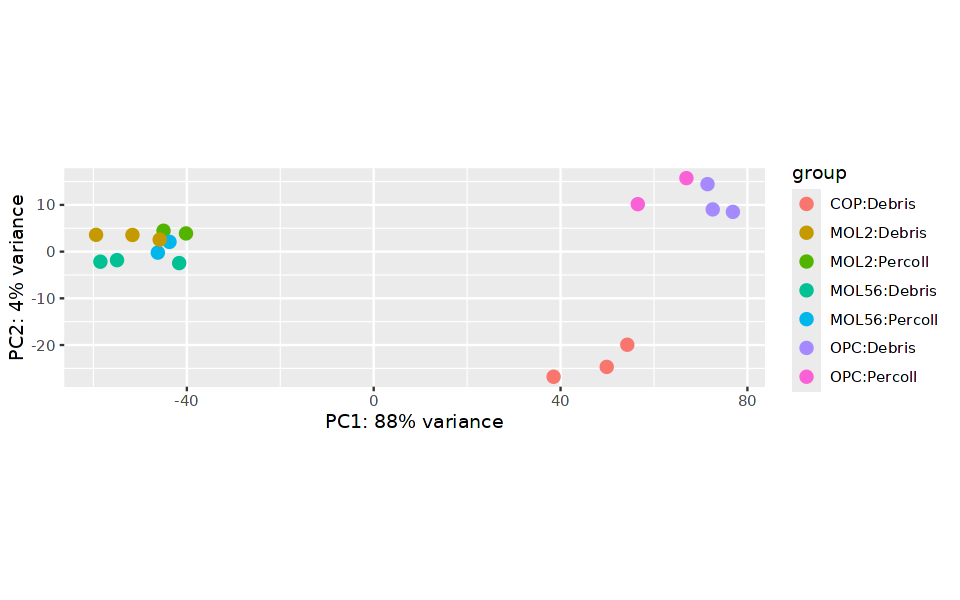

In [107]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [108]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

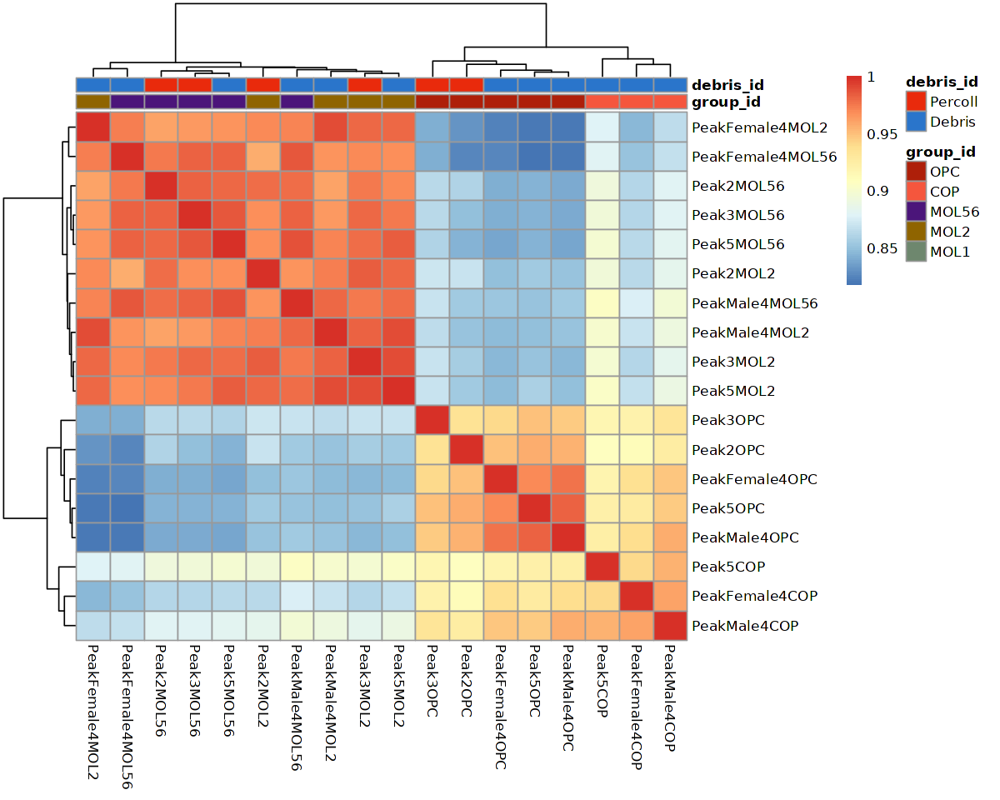

In [109]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=cellType_OL_merge_colors, debris_id=debris_colors))

In [110]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [111]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


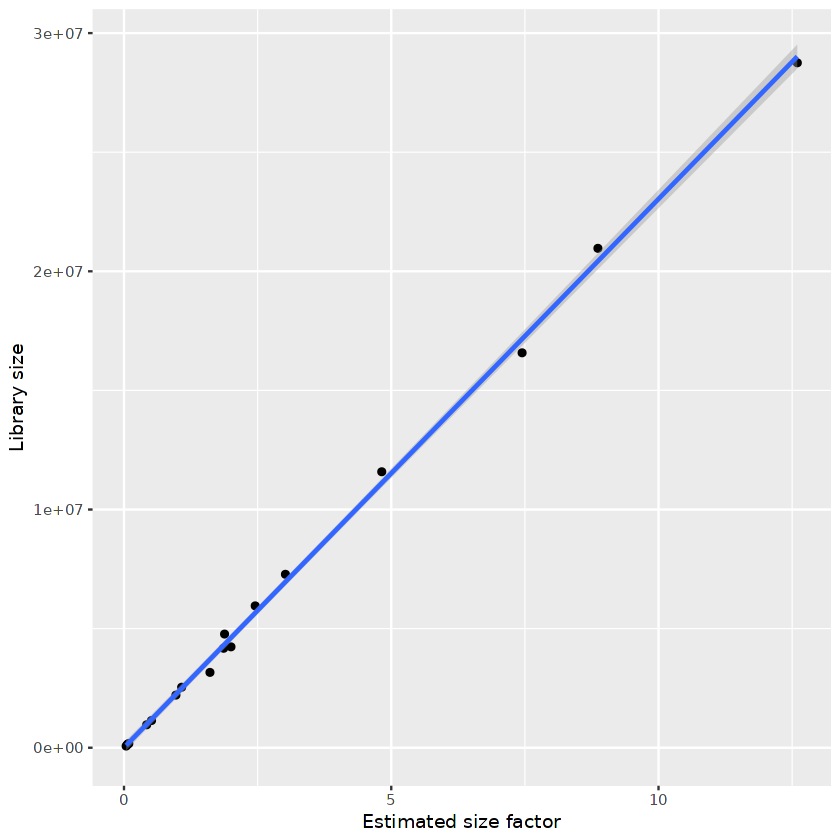

In [112]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [113]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
Peak2MOL2,Peak,Peak2MOL2,MOL2,Percoll,1.86382567
Peak2MOL56,Peak,Peak2MOL56,MOL56,Percoll,1.88166858
Peak2OPC,Peak,Peak2OPC,OPC,Percoll,0.08993993
Peak3MOL2,Peak,Peak3MOL2,MOL2,Percoll,2.00150092
Peak3MOL56,Peak,Peak3MOL56,MOL56,Percoll,1.07894466
Peak3OPC,Peak,Peak3OPC,OPC,Percoll,0.04024837
Peak5COP,Peak,Peak5COP,COP,Debris,0.06173238
Peak5MOL2,Peak,Peak5MOL2,MOL2,Debris,7.44789309
Peak5MOL56,Peak,Peak5MOL56,MOL56,Debris,2.45506885


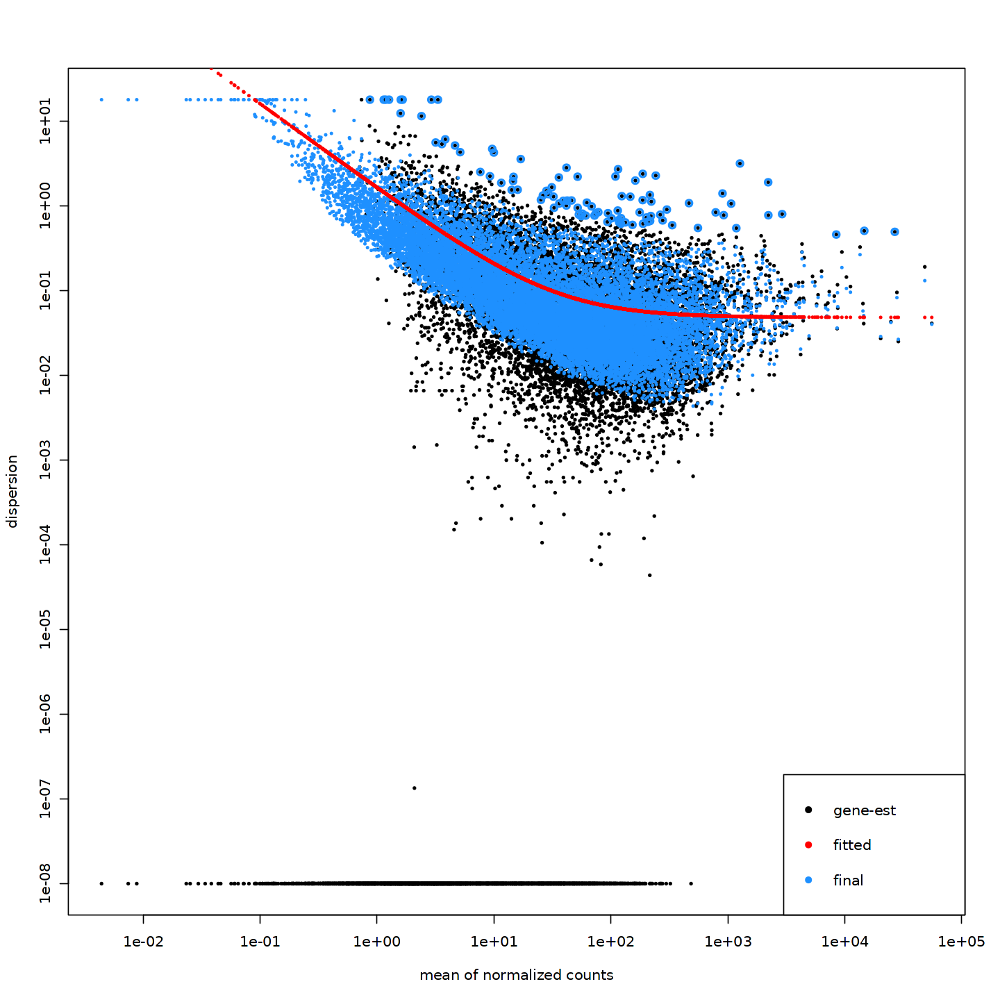

In [114]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

In [115]:
condition1 = "MOL56"
condition2 = "MOL2"

In [116]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [117]:
summary(res)


out of 15897 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1029, 6.5%
LFC < 0 (down)     : 1469, 9.2%
outliers [1]       : 5, 0.031%
low counts [2]     : 617, 3.9%
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



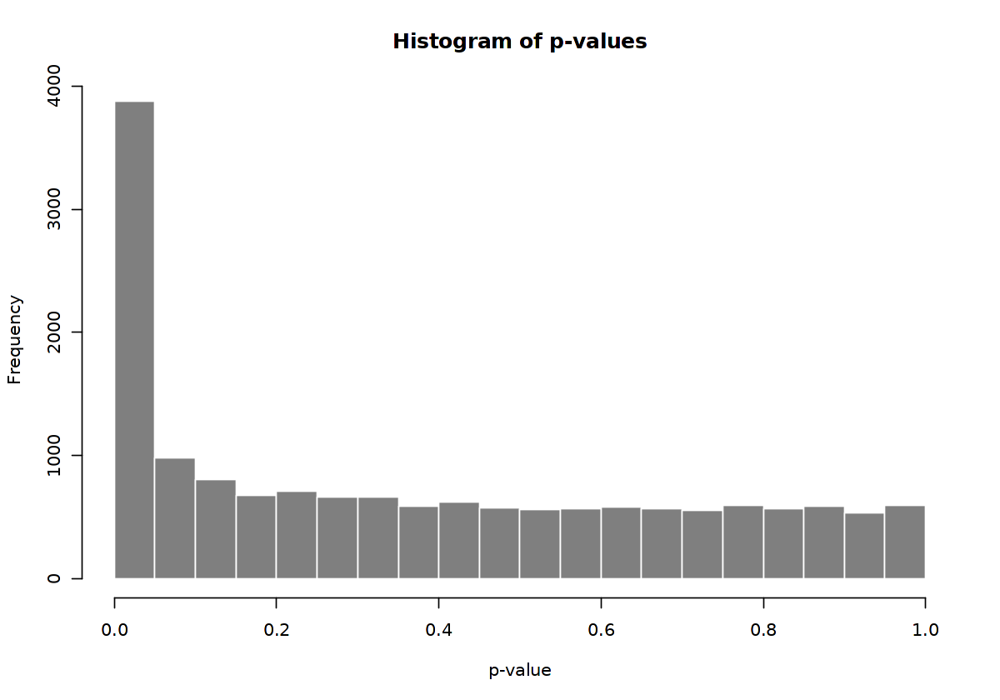

In [118]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

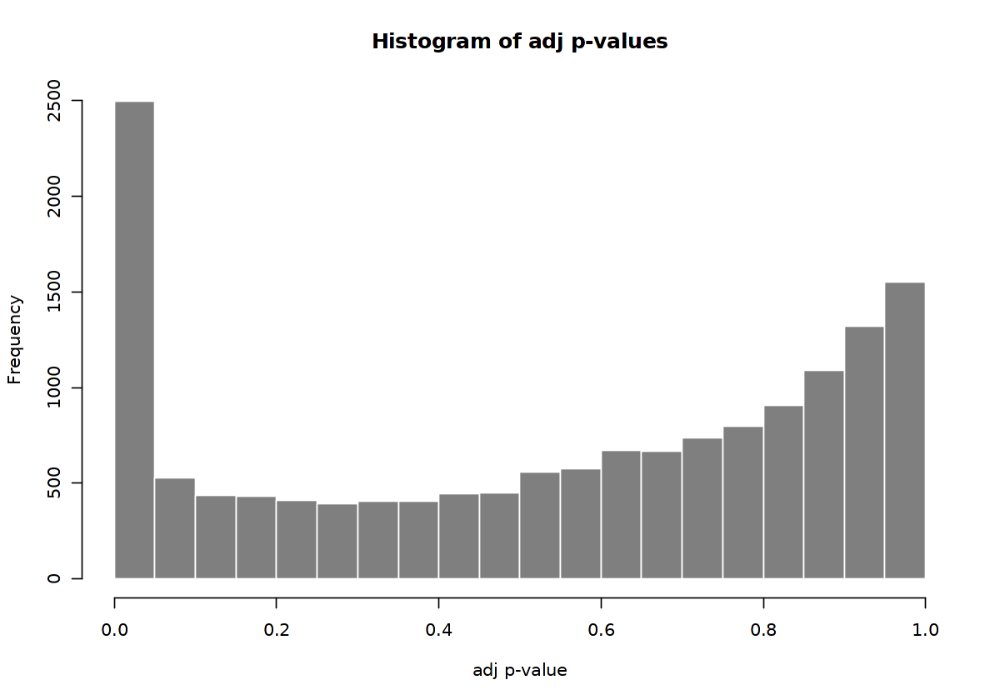

In [119]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

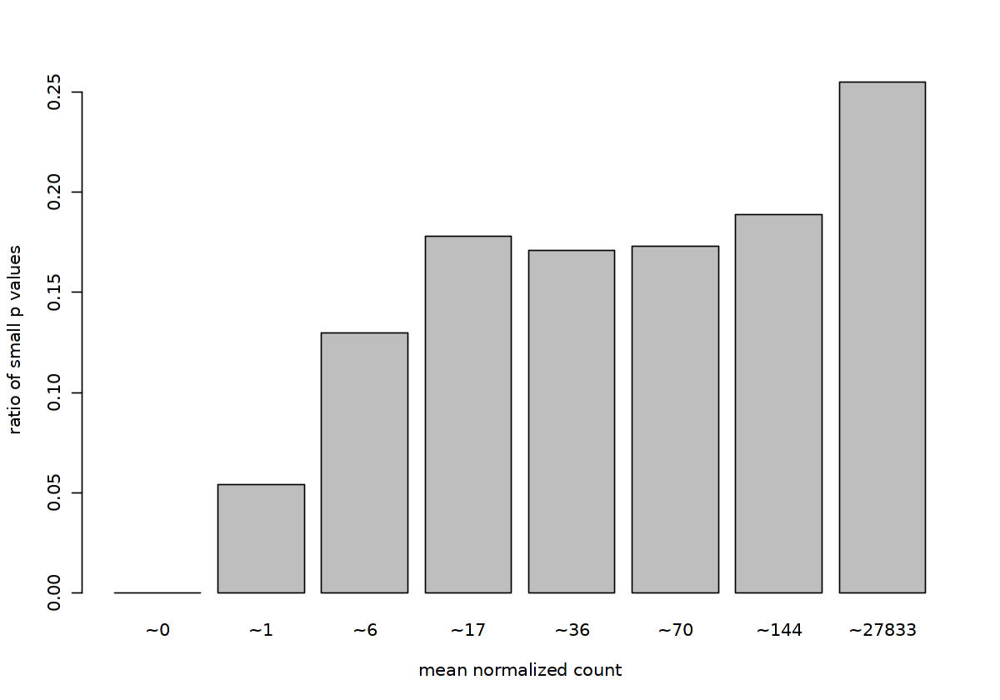

In [120]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

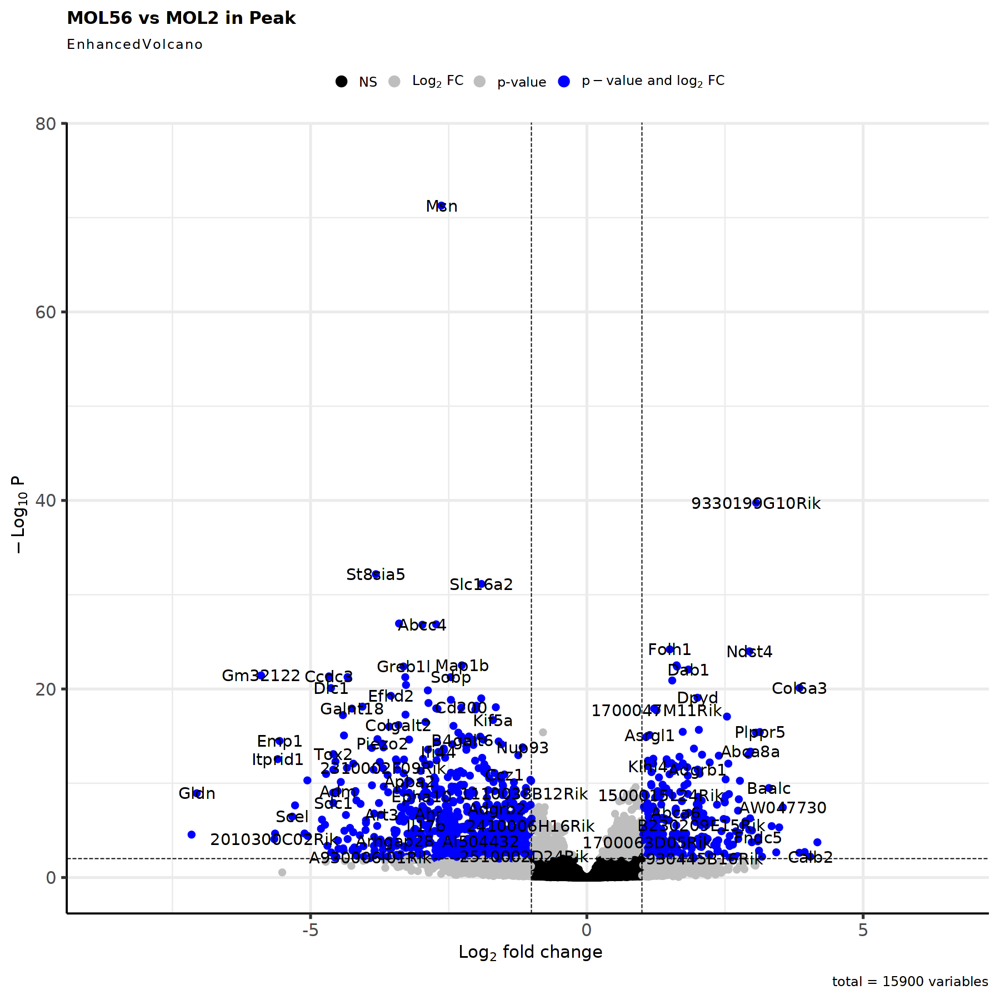

In [121]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [122]:
res <- res[complete.cases(res$padj),]

In [123]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [124]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id MOL56 vs MOL2 
Wald test p-value: group_id MOL56 vs MOL2 
DataFrame with 1091 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Hmcn1          35.90663       -7.15374  1.472495  -4.85825 1.18430e-06 2.81341e-05
Gldn            6.34985       -7.05964  1.048692  -6.73185 1.67518e-11 1.16311e-09
Gm32122       122.39203       -5.89581  0.568869 -10.36408 3.61200e-25 3.67822e-22
2010300C02Rik   5.03242       -5.65611  1.228718  -4.60326 4.15929e-06 8.50510e-05
Fam135b        26.21877       -5.64241  1.147047  -4.91907 8.69546e-07 2.17031e-05
...                 ...            ...       ...       ...         ...         ...
Plpp2           36.2349       -1.00311  0.197584  -5.07686 3.83732e-07 1.04857e-05
Ece1            60.8445        1.00285  0.193215   5.19032 2.09932e-07 6.19056e-06
Pfkl            26.9568       -1.00211  

In [125]:
nrow(res_filtered)

[1] 1091

In [126]:
res.list[[cluster_choice]] <- res

In [127]:
HVGs.list[[cluster_choice]] <- rownames(res_filtered)

#### 3.1.4 Late

In [128]:
cluster_choice <- "Late"

In [129]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- unique(MORNAATACCOL$origCT)[!unique(MORNAATACCOL$origCT) %in% names(table_sample_low)]

Early1MOL2           Early1MOL56             Early1OPC             Early4COP 
                    0                     0                     0                     0 
           Early4MOL1            Early4MOL2           Early4MOL56             Early4OPC 
                    0                     0                     0                     0 
       EarlyCtrl2MOL2       EarlyCtrl2MOL56         EarlyCtrl2OPC         EarlyCtrl3COP 
                    0                     0                     0                     0 
       EarlyCtrl3MOL1        EarlyCtrl3MOL2       EarlyCtrl3MOL56         EarlyCtrl3OPC 
                    0                     0                     0                     0 
        EarlyCtrl4COP        EarlyCtrl4MOL1        EarlyCtrl4MOL2       EarlyCtrl4MOL56 
                    0                     0                     0                     0 
        EarlyCtrl4OPC   EarlyCtrlFemale5COP  EarlyCtrlFemale5MOL1  EarlyCtrlFemale5MOL2 
                    0                     0                     0                     0 
EarlyCtrlFemale5MOL56   EarlyCtrlFemale5OPC     EarlyCtrlMale5COP    EarlyCtrlMale5MOL1 
                    0                     0                     0                     0 
   EarlyCtrlMale5MOL2   EarlyCtrlMale5MOL56     EarlyCtrlMale5OPC      EarlyFemale3MOL1 
                    0                     0                     0                     0 
     EarlyFemale3MOL2     EarlyFemale3MOL56       EarlyFemale3OPC       EarlyFemale5COP 
                    0                     0                     0                     0 
     EarlyFemale5MOL1      EarlyFemale5MOL2     EarlyFemale5MOL56       EarlyFemale5OPC 
                    0                     0                     0                     0 
       EarlyMale3MOL1        EarlyMale3MOL2       EarlyMale3MOL56         EarlyMale3OPC 
                    0                     0                     0                     0 
        EarlyMale5COP        EarlyMale5MOL1        EarlyMale5MOL2       EarlyMale5MOL56 
                    0                     0                     0                     0 
        EarlyMale5OPC              Late1COP          LateCtrl2COP         LateCtrl2MOL1 
                    0                     1                     0                     0 
        LateCtrl2MOL2        LateCtrl2MOL56          LateCtrl2OPC          LateCtrl3COP 
                    0                     0                     0                     0 
        LateCtrl3MOL2        LateCtrl3MOL56          LateCtrl3OPC              Peak2COP 
                    0                     0                     0                     0 
            Peak2MOL2            Peak2MOL56              Peak2OPC              Peak3COP 
                    0                     0                     0                     0 
            Peak3MOL1             Peak3MOL2            Peak3MOL56              Peak3OPC 
                    0                     0                     0                     0 
             Peak5COP             Peak5MOL1             Peak5MOL2            Peak5MOL56 
                    0                     0                     0                     0 
             Peak5OPC          PeakCtrl2COP         PeakCtrl2MOL2        PeakCtrl2MOL56 
                    0                     0                     0                     0 
         PeakCtrl2OPC         PeakCtrl3MOL2        PeakCtrl3MOL56          PeakCtrl3OPC 
                    0                     0                     0                     0 
       PeakFemale4COP       PeakFemale4MOL2      PeakFemale4MOL56        PeakFemale4OPC 
                    0                     0                     0                     0 
         PeakMale4COP         PeakMale4MOL1         PeakMale4MOL2        PeakMale4MOL56 
                    0                     0                     0                     0 
         PeakMale4OPC 
                    0

In [130]:
table_group_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(cellType_OL_merge_colors)[!names(cellType_OL_merge_colors) %in% names(table_group_low)]

named integer(0)

In [131]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [132]:
cluster_metadata

,cluster_id,sample_id,group_id,debris_id
,<chr>,<chr>,<fct>,<chr>
Late1COP,Late,Late1COP,COP,Percoll
Late1MOL1,Late,Late1MOL1,MOL1,Percoll
Late1MOL2,Late,Late1MOL2,MOL2,Percoll
Late1MOL56,Late,Late1MOL56,MOL56,Percoll
Late1OPC,Late,Late1OPC,OPC,Percoll
Late2COP,Late,Late2COP,COP,Percoll
Late2MOL1,Late,Late2MOL1,MOL1,Percoll
Late2MOL2,Late,Late2MOL2,MOL2,Percoll
Late2MOL56,Late,Late2MOL56,MOL56,Percoll


In [133]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [134]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [135]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [136]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



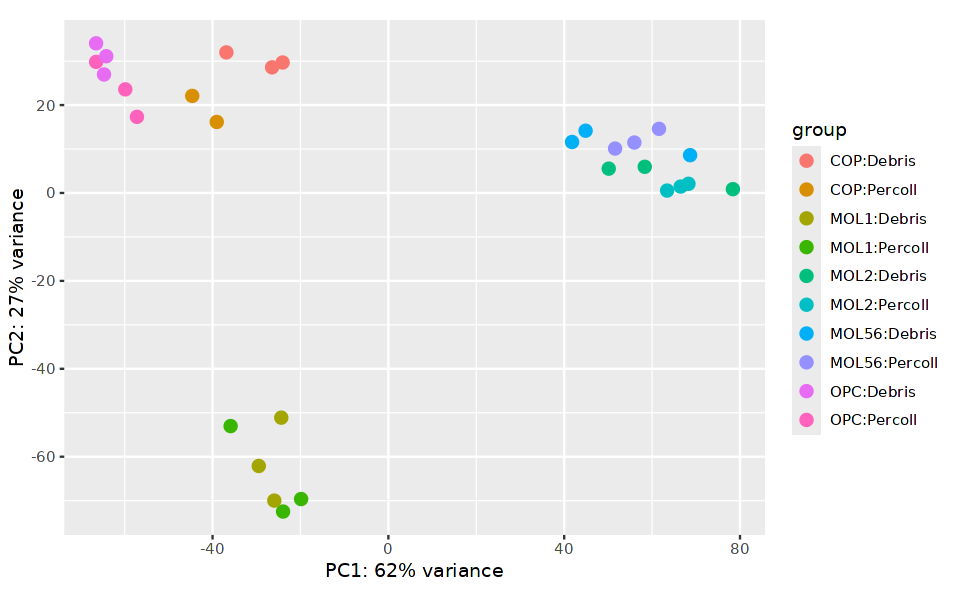

In [137]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [138]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

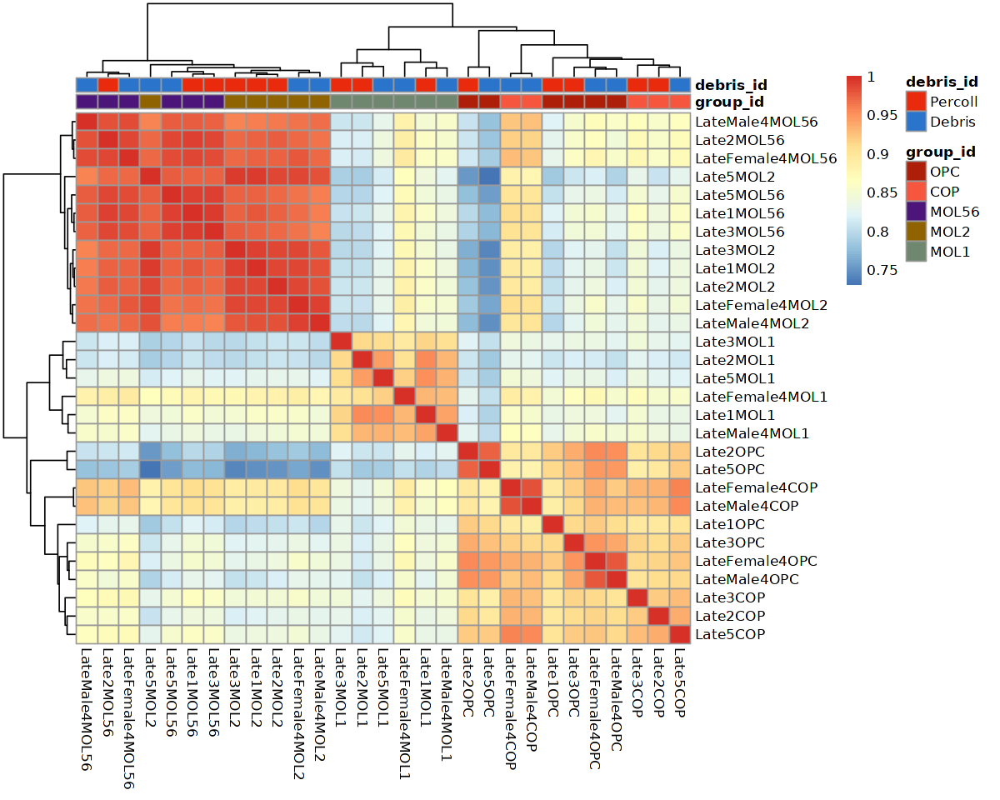

In [139]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=cellType_OL_merge_colors, debris_id=debris_colors))

In [140]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [141]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


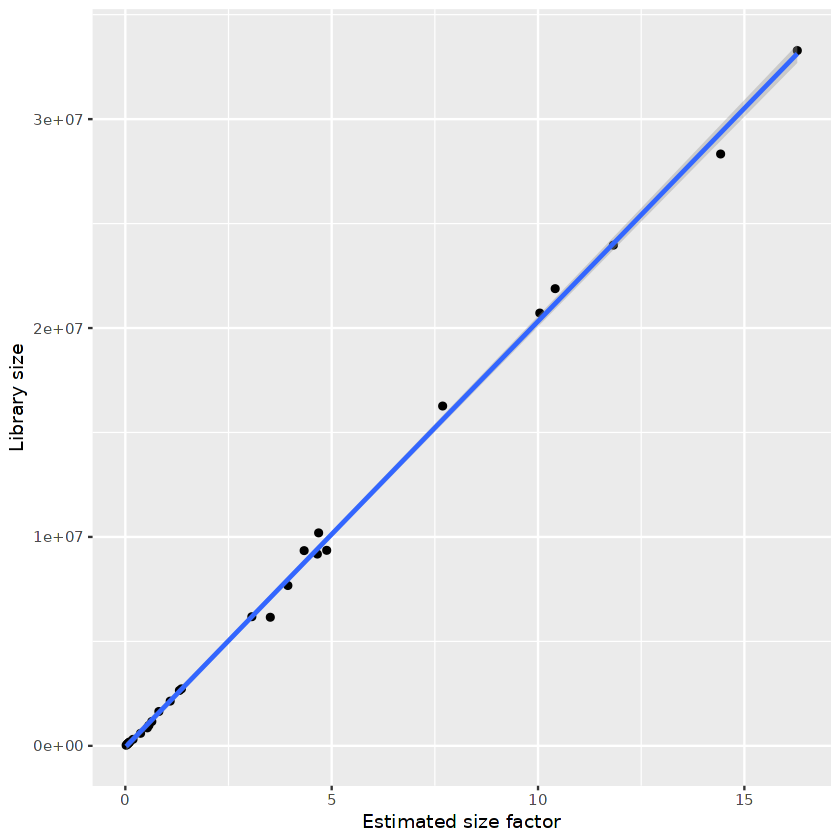

In [142]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [143]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
Late1MOL1,Late,Late1MOL1,MOL1,Percoll,0.53294489
Late1MOL2,Late,Late1MOL2,MOL2,Percoll,4.87941769
Late1MOL56,Late,Late1MOL56,MOL56,Percoll,11.82565622
Late1OPC,Late,Late1OPC,OPC,Percoll,0.04440813
Late2COP,Late,Late2COP,COP,Percoll,0.07276608
Late2MOL1,Late,Late2MOL1,MOL1,Percoll,0.36933726
Late2MOL2,Late,Late2MOL2,MOL2,Percoll,3.93865031
Late2MOL56,Late,Late2MOL56,MOL56,Percoll,3.06551235
Late2OPC,Late,Late2OPC,OPC,Percoll,0.64180335


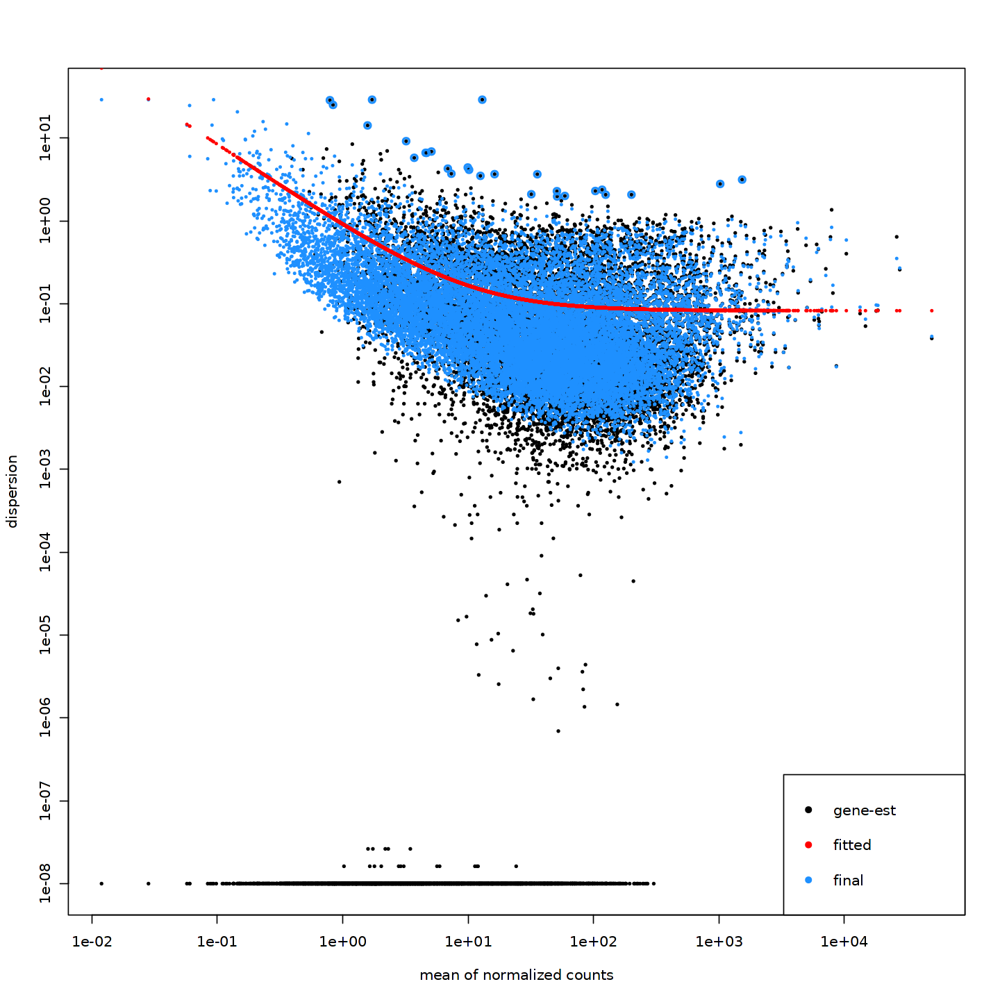

In [144]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

In [145]:
condition1 = "MOL56"
condition2 = "MOL2"

In [146]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [147]:
summary(res)


out of 15900 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1369, 8.6%
LFC < 0 (down)     : 1661, 10%
outliers [1]       : 8, 0.05%
low counts [2]     : 0, 0%
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



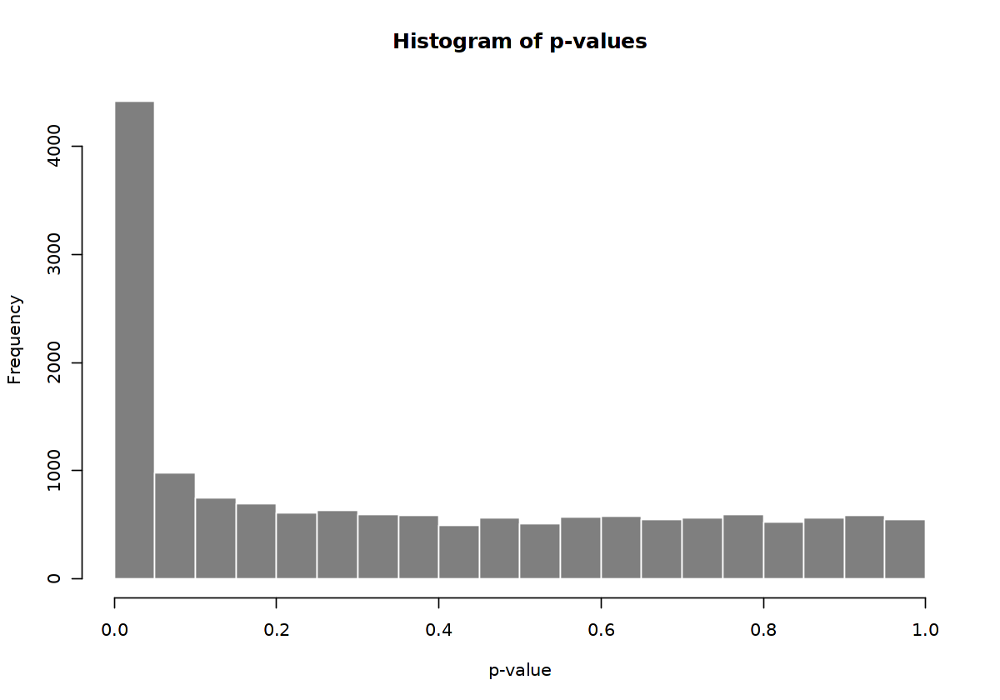

In [148]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

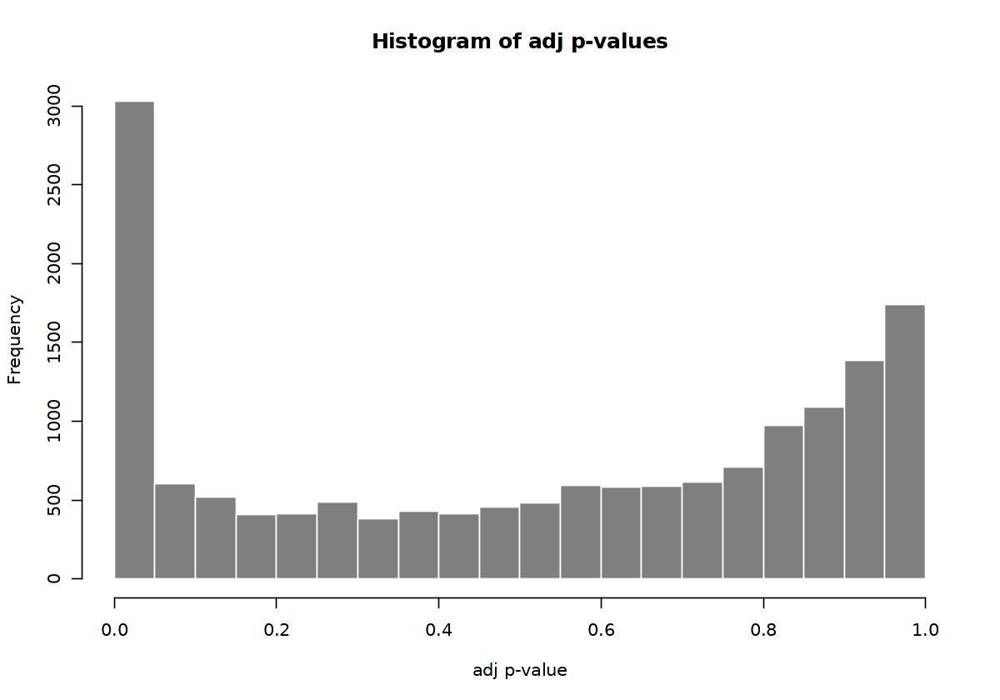

In [149]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

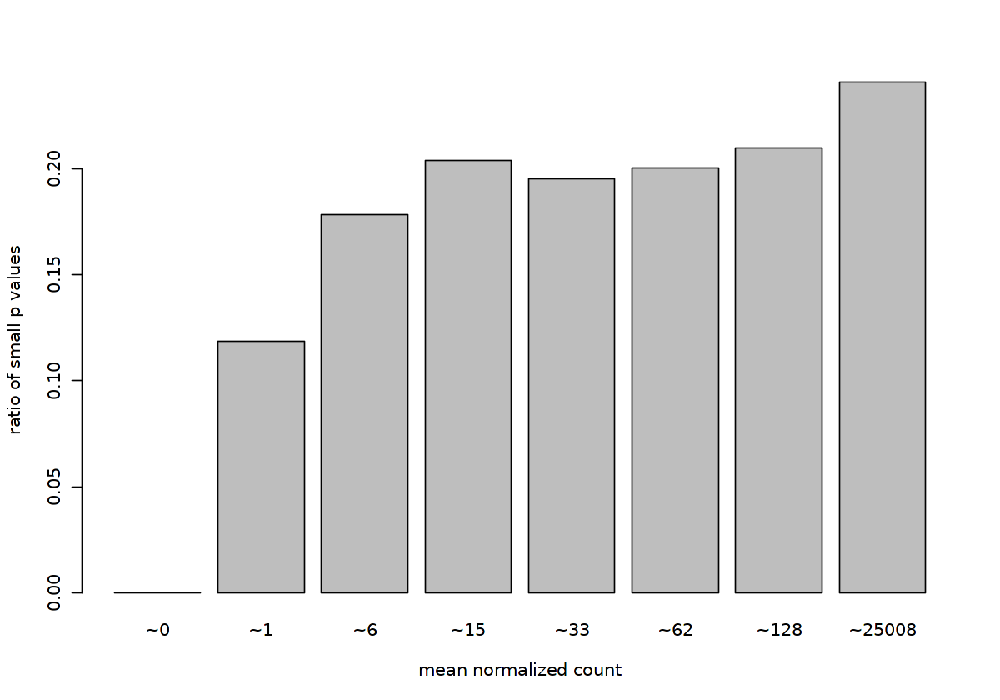

In [150]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

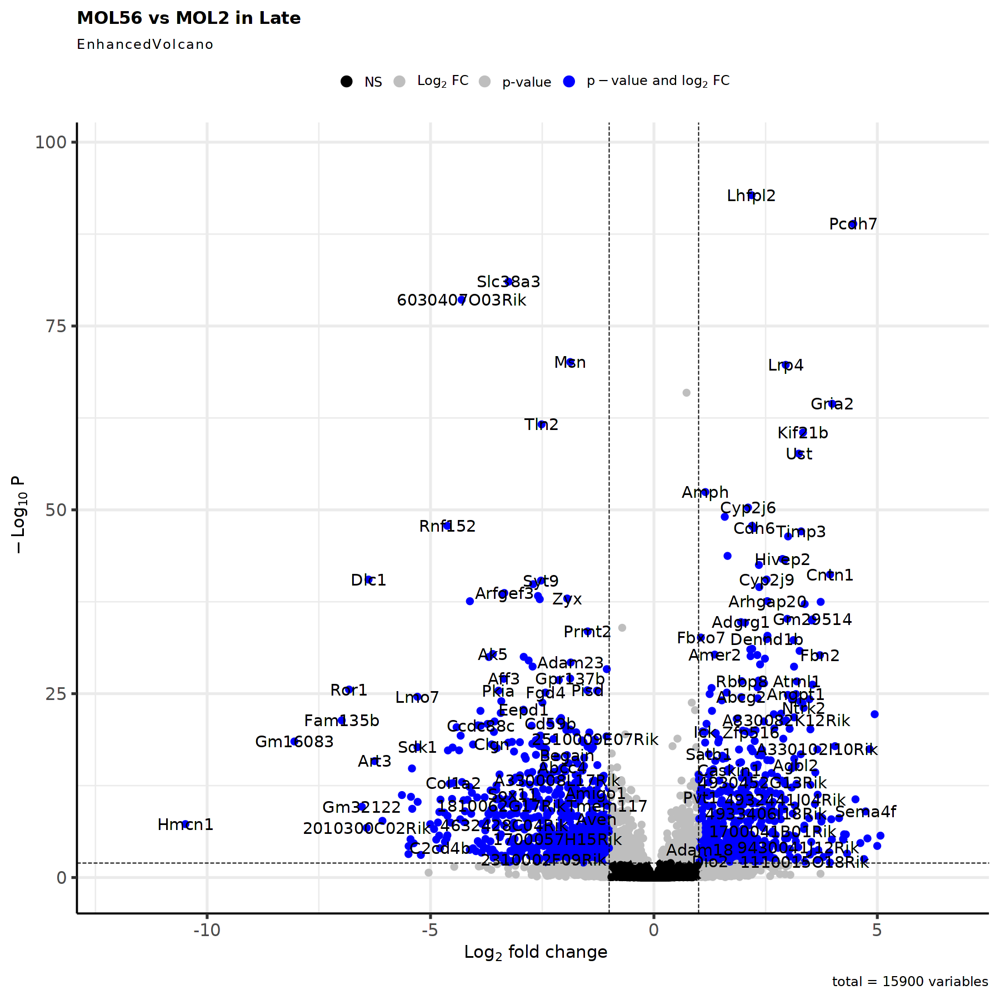

In [151]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [152]:
res <- res[complete.cases(res$padj),]

In [153]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [154]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id MOL56 vs MOL2 
Wald test p-value: group_id MOL56 vs MOL2 
DataFrame with 1309 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Hmcn1     35.6407      -10.48636  1.755001  -5.97513 2.29906e-09 5.46957e-08
Gm16083   14.3177       -8.04793  0.850554  -9.46199 3.02133e-21 3.15888e-19
Fam135b   19.5792       -6.98758  0.687632 -10.16179 2.93634e-24 4.24220e-22
Ror1      52.8734       -6.82464  0.615120 -11.09480 1.32950e-28 2.74396e-26
Gm32122   96.9578       -6.53793  0.953254  -6.85854 6.95696e-12 2.34735e-10
...           ...            ...       ...       ...         ...         ...
Prex1   174.92553        1.00213  0.121502   8.24785 1.61271e-16 1.05037e-14
Gm13404   4.33764       -1.00200  0.243392  -4.11684 3.84110e-05 4.20694e-04
Mfhas1   37.02836       -1.00172  0.220418  -4.54464 5.50295e-06 7.48740e-05
Arrdc4   12.02582      

In [155]:
nrow(res_filtered)

[1] 1309

In [156]:
res.list[[cluster_choice]] <- res

In [157]:
HVGs.list[[cluster_choice]] <- rownames(res_filtered)

#### 3.1.5 Summary

In [158]:
listInput_upset <- HVGs.list
listInput_upset[sapply(listInput_upset, is.null)] <- NULL

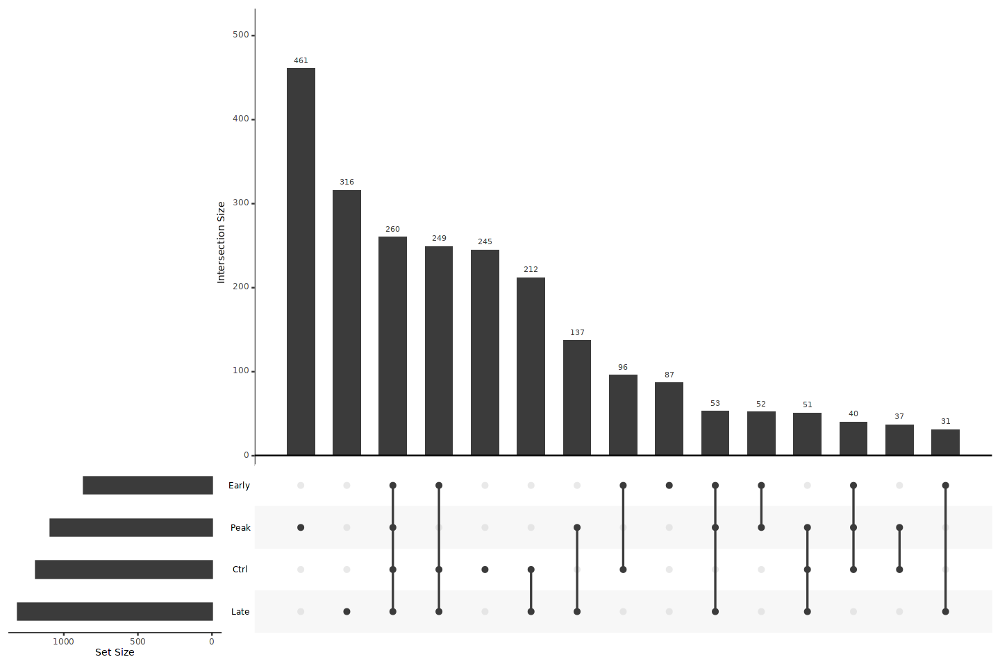

In [159]:
options(repr.plot.width=12, repr.plot.height=8)
upset(fromList(listInput_upset), order.by = "freq")

##### 3.1.5.1 MOL56

In [14]:
res_MOL56.list <- lapply(res.list, function(x){
    x[(x$log2FoldChange > 0 & x$baseMean > 1),]
})

In [15]:
HVGs_MOL56.list <- lapply(res_MOL56.list, function(x){
    x[(x$padj < 0.01 & abs(x$log2FoldChange) > 1 & x$baseMean > 1),]
})

###### 3.1.5.1.1 Differential genes expression

In [16]:
listInput_upset <- lapply(HVGs_MOL56.list, function(x){rownames(x)})
listInput_upset[sapply(listInput_upset, is.null)] <- NULL

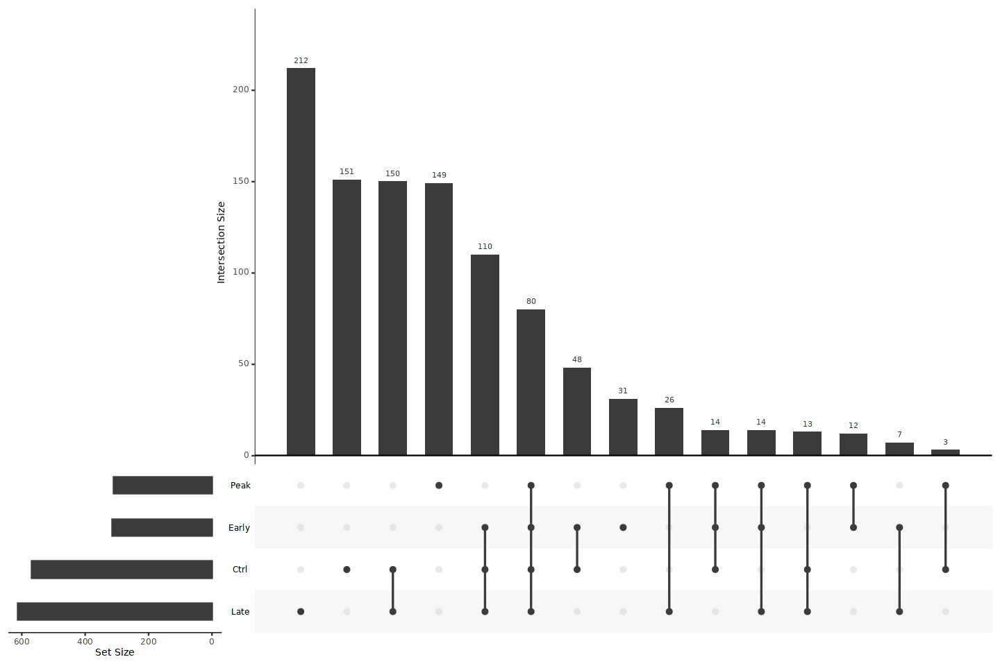

In [17]:
options(repr.plot.width=12, repr.plot.height=8)
upset(fromList(listInput_upset), order.by = "freq")

In [164]:
for(x in names(orig.ident_merge_colors)){
    res_MOL56.list[[x]]$gene_name <- rownames(res_MOL56.list[[x]])
    res_MOL56.list[[x]] <- res_MOL56.list[[x]][,c("log2FoldChange","padj","gene_name")]
    res_MOL56.list[[x]]$timepoint <- rep(x, nrow(res_MOL56.list[[x]]))
    res_MOL56.list[[x]]$neg_log10p <- -log10(res_MOL56.list[[x]]$padj)
    res_MOL56.list[[x]][(res_MOL56.list[[x]]$log2FoldChange <= 1) | (res_MOL56.list[[x]]$padj >= 0.01),'timepoint'] <- "NS"
    if(x=="Ctrl")res_MOL56.list[[x]]$log2FoldChange <- -res_MOL56.list[[x]]$log2FoldChange
    if(x=="Peak")res_MOL56.list[[x]]$neg_log10p <- -res_MOL56.list[[x]]$neg_log10p
    if(x=="Late"){
        res_MOL56.list[[x]]$log2FoldChange <- -res_MOL56.list[[x]]$log2FoldChange
        res_MOL56.list[[x]]$neg_log10p <- -res_MOL56.list[[x]]$neg_log10p
    }
}

In [165]:
gg_df <- as.data.frame(do.call(rbind, res_MOL56.list))

In [166]:
p <- ggplot(gg_df, aes(log2FoldChange, neg_log10p)) +
    geom_point(aes(color = timepoint)) +
    scale_color_manual(values=c('NS'='black',orig.ident_merge_colors)) +
    xlim(-11,11) +
    ylim(-150,150) +
    geom_hline(yintercept=0) +
    geom_vline(xintercept=0) +
    theme_classic()

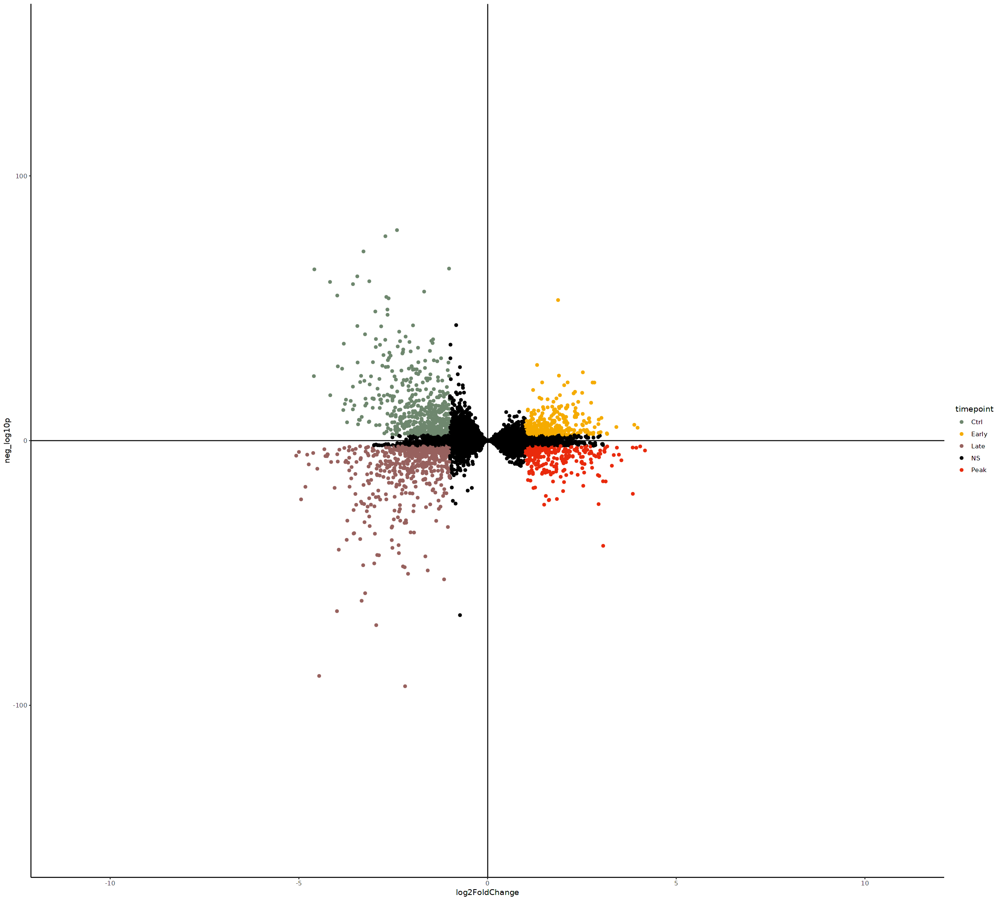

In [167]:
options(repr.plot.width=20, repr.plot.height=18)
p

In [198]:
res_MOL56.list <- lapply(res.list, function(x){
    x[(x$log2FoldChange > 0 & x$baseMean > 1),]
})

In [199]:
for(x in names(orig.ident_merge_colors)){
    res_MOL56.list[[x]]$timepoint <- rep(x, nrow(res_MOL56.list[[x]]))
    res_MOL56.list[[x]]$gene <- rownames(res_MOL56.list[[x]])
    res_MOL56.list[[x]]$neg_log10p <- -log10(res_MOL56.list[[x]]$padj)
    res_MOL56.list[[x]] <- res_MOL56.list[[x]][order(res_MOL56.list[[x]]$log2FoldChange, decreasing=TRUE),]
}

In [211]:
gg_df <- as.data.frame(do.call(rbind, res_MOL56.list))

In [212]:
gg_df$timepoint = factor(gg_df$timepoint, levels = names(orig.ident_merge_colors))

In [213]:
best_genes <- unique(unlist(lapply(HVGs_MOL56.list, function(x){rownames(x)})))

In [214]:
gg_df <- gg_df[gg_df$gene %in% best_genes,]

In [215]:
mat <- as.matrix(reshape2::dcast(gg_df, gene ~ timepoint, value.var = "log2FoldChange"))

In [216]:
rownames(mat) <- mat[,'gene']
mat <- mat[, colnames(mat) != "gene"]

In [217]:
mat[is.na(mat)] <- 0

In [218]:
clust <- hclust(dist(mat))
ddgram <- as.dendrogram(clust) # create dendrogram
ggtree_plot <- ggtree::ggtree(ddgram)

In [219]:
dotplot <- gg_df %>%
  mutate(gene = factor(gene, levels = clust$labels[clust$order])) %>% 
  ggplot(aes(x=timepoint, y = gene, color = log2FoldChange, size = neg_log10p)) +
  geom_point() +
  cowplot::theme_cowplot() +
  theme(axis.line  = element_blank()) +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  ylab('') +
  theme(axis.ticks = element_blank()) +
  scale_color_gradientn(colours = viridis::viridis(20), limits=c(0,5), oob = scales::squish, name = 'Log2 Ratio') +
  scale_y_discrete(position = "right") 

  labels <- ggplot(
    gg_df %>%
    mutate(
      timepoint = factor(timepoint, levels = names(orig.ident_merge_colors))
    ),
    aes(x = timepoint, y = 1, fill = timepoint)
  ) +
  geom_tile() +
  scale_fill_manual(values = orig.ident_merge_colors) +
  theme(legend.position = "none") +
  theme(
    axis.title.x=element_blank(),
    axis.text.x=element_blank(),
    axis.ticks.x=element_blank(),
    axis.title.y=element_blank(),
    axis.text.y=element_blank(),
    axis.ticks.y=element_blank()
  ) +
  xlim2(dotplot)
  legend <- plot_grid(get_legend(labels + theme(legend.position="bottom")))

Warning message in get_plot_component(plot, "guide-box"):
"Multiple components found; returning the first one. To return all, use `return_all = TRUE`."


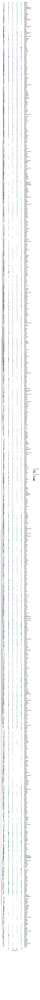

In [253]:
options(repr.plot.width=8, repr.plot.height=200)
print(
plot_spacer() + plot_spacer() + plot_spacer() +
ggtree_plot + plot_spacer() + dotplot +
plot_spacer() + plot_spacer() + legend +
plot_layout(ncol = 3, widths = c(2, -0.05, 10), heights = c(0, 10, 0.5))
)

In [254]:
pdf(paste0(OS_path_outputs, "MOL56_DGEs.pdf"), width = 8, height = 200)
print(
plot_spacer() + plot_spacer() + plot_spacer() +
ggtree_plot + plot_spacer() + dotplot +
plot_spacer() + plot_spacer() + legend +
plot_layout(ncol = 3, widths = c(2, -0.05, 10), heights = c(0, 10, 0.5))
)
dev.off()

png 
  2

###### 3.1.5.1.2 Gene Ontology

In [18]:
res_MOL56.list <- lapply(res.list, function(x){
    x[(x$log2FoldChange > 1 & x$padj < 0.01 & x$baseMean > 1),]
})

In [19]:
MOL56_DGEs.list <- lapply(res_MOL56.list, function(x){
    rownames(x)
})

In [290]:
write.csv(MOL56_DGEs.list[["Ctrl"]],row.names = FALSE, paste0(OS_path_outputs, "MOL56_DGEs_Ctrl.csv"))
write.csv(MOL56_DGEs.list[["Early"]],row.names = FALSE,paste0(OS_path_outputs, "MOL56_DGEs_Early.csv"))
write.csv(MOL56_DGEs.list[["Peak"]],row.names = FALSE,paste0(OS_path_outputs, "MOL56_DGEs_Peak.csv"))
write.csv(MOL56_DGEs.list[["Late"]],row.names = FALSE,paste0(OS_path_outputs, "MOL56_DGEs_Late.csv"))

In [38]:
ensembl = useMart("ensembl",dataset="mmusculus_gene_ensembl")
attributes = listAttributes(ensembl)
Biomart_gencode_ensembl84_biotypes <- getBM(attributes=c("mgi_symbol","ensembl_gene_id","entrezgene_id","gene_biotype"), filters = "", values = "", ensembl)
Biomart_gencode_ensembl84_biotypes[, 'gene_biotype'] <- as.factor(Biomart_gencode_ensembl84_biotypes[,'gene_biotype'])

In [39]:
#Filter for only our genes
Biotype_All_dataset <- subset(Biomart_gencode_ensembl84_biotypes, mgi_symbol %in% rownames(MORNAATACCOL))
entrezID <- subset(Biotype_All_dataset, Biotype_All_dataset$mgi_symbol %in% rownames(MORNAATACCOL))

In [61]:
threshold_nb_genes <- 50

###### All timepoints

In [22]:
commun_MOL56 <- names(table(unlist(MOL56_DGEs.list))[table(unlist(MOL56_DGEs.list)) == 4])

In [40]:
entrezmatched <- entrezID[match(commun_MOL56,entrezID$mgi_symbol),]

In [41]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [42]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [44]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [45]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:74] "75880" "217258" "27404" "108154" "94191" "237175" "69538" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...0 enriched terms found
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSystems
  2016, 12(2):477-479 


In [47]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [48]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:74] "75880" "217258" "27404" "108154" "94191" "237175" "69538" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...162 enriched terms found
'data.frame':	162 obs. of  9 variables:
 $ ID         : chr  "R-MMU-73621" "R-MMU-422356" "R-MMU-112316" "R-MMU-163685" ...
 $ Description: chr  "Pyrimidine catabolism" "Regulation of insulin secretion" "Neuronal System" "Integration of energy metabolism" ...
 $ GeneRatio  : chr  "2/38" "3/38" "6/38" "3/38" ...
 $ BgRatio    : chr  "11/8582" "61/8582" "323/8582" "77/8582" ...
 $ pvalue     : num  0.00102 0.00242 0.0027 0.00468 0.0056 ...
 $ p.adjust   : num  0.146 0.146 0.146 0.181 0.181 ...
 $ qvalue     : num  0.132 0.132 0.132 0.164 0.164 ...
 $ geneID     : chr  "Dpyd/Nt5e" "Kcnb1/Plcb1/Rapgef3" "Kcna2/Kcnb1/Nlgn1/Nlgn3/Plcb1/Snap25" "Kcnb1/Plcb1/Rapgef3" ...
 $ Count      : int  2 3 6 3 4 2 2 2 2 2 ...
#...Citation
  Gu

In [49]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL56_MOL2_AllTP.csv"), row.names=FALSE)

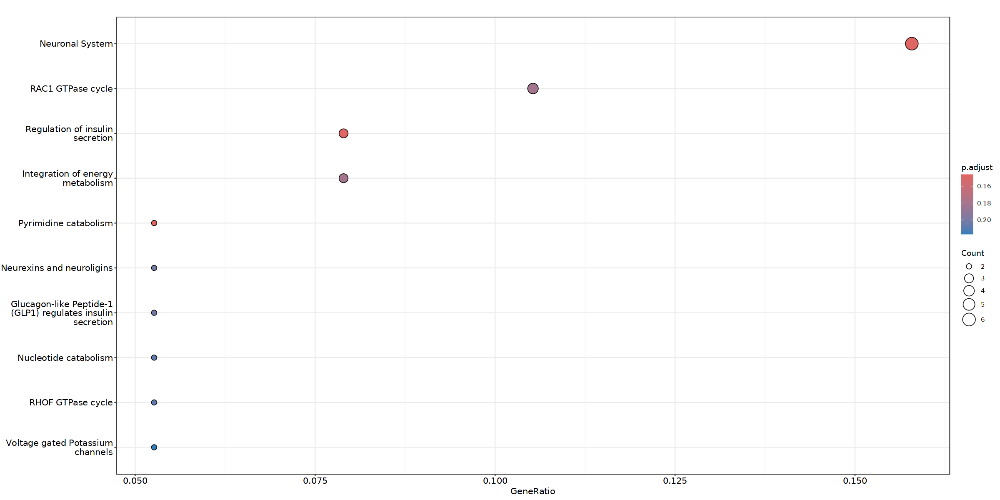

In [50]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [53]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

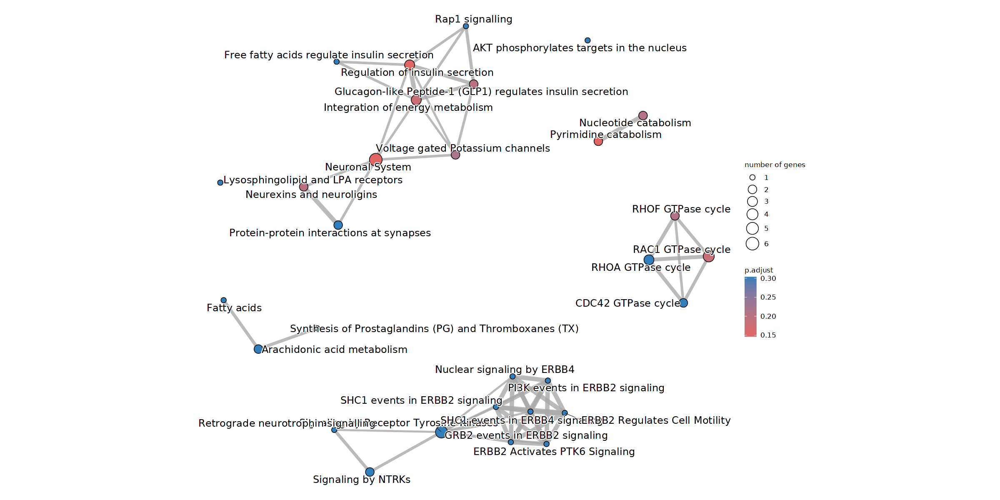

In [54]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Ctrl

In [75]:
timepoint = "Ctrl"

In [76]:
tmp_res_MOL56 <- res_MOL56.list[[timepoint]]

In [77]:
if(nrow(tmp_res_MOL56)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),]
}

In [87]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [89]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [90]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [91]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [92]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [93]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:47] "16590" "72003" "54216" "319211" "12805" "13844" "21826" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...0 enriched terms found
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSystems
  2016, 12(2):477-479 


In [94]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [95]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:47] "16590" "72003" "54216" "319211" "12805" "13844" "21826" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...82 enriched terms found
'data.frame':	82 obs. of  9 variables:
 $ ID         : chr  "R-MMU-112316" "R-MMU-112315" "R-MMU-9006934" "R-MMU-1500931" ...
 $ Description: chr  "Neuronal System" "Transmission across Chemical Synapses" "Signaling by Receptor Tyrosine Kinases" "Cell-Cell communication" ...
 $ GeneRatio  : chr  "5/23" "3/23" "4/23" "2/23" ...
 $ BgRatio    : chr  "323/8582" "201/8582" "400/8582" "91/8582" ...
 $ pvalue     : num  0.00141 0.01587 0.02036 0.02435 0.02649 ...
 $ p.adjust   : num  0.115 0.201 0.201 0.201 0.201 ...
 $ qvalue     : num  0.0948 0.1651 0.1651 0.1651 0.1651 ...
 $ geneID     : chr  "Kcnj3/Kcnh8/Cacna2d3/Nrxn1/Grik3" "Kcnj3/Cacna2d3/Grik3" "Kit/Thbs2/Pde3b/Pcsk5" "Kirrel3/Cdh13" ...
 $ Count      : int  5 3 4 2 1 1 1 1 

In [96]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL56_MOL2_",timepoint,".csv"), row.names=FALSE)

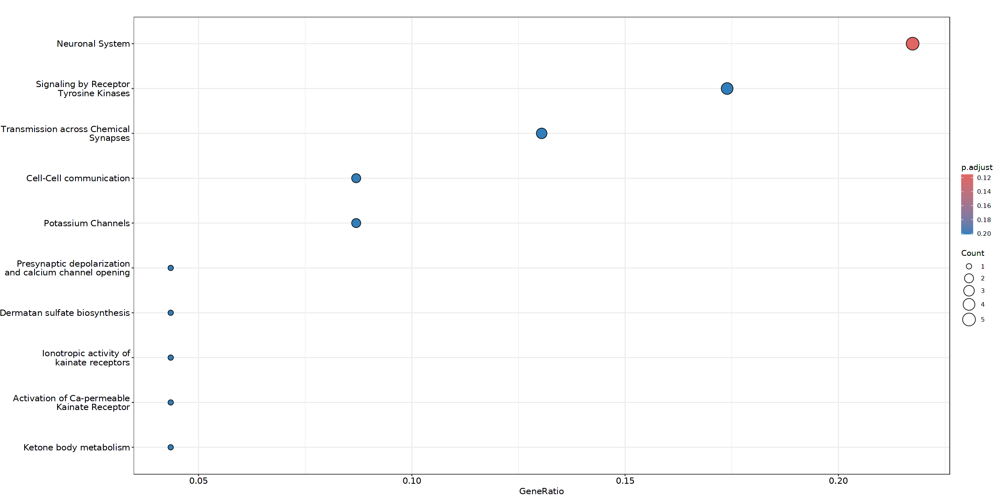

In [97]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [98]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

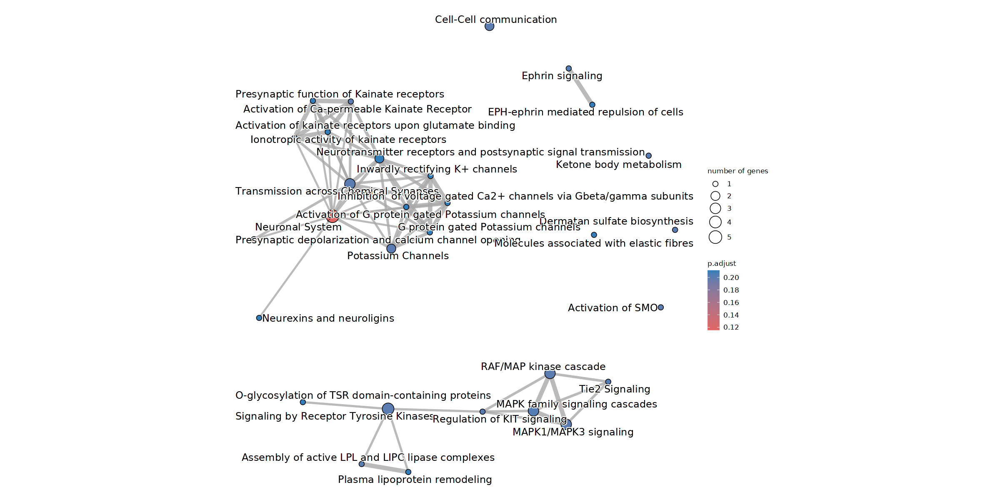

In [99]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Early

In [100]:
timepoint = "Early"

In [101]:
tmp_res_MOL56 <- res_MOL56.list[[timepoint]]

In [102]:
if(nrow(tmp_res_MOL56)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),]
}

In [103]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [104]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [105]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [106]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [107]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [108]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:46] "241134" "21826" "66889" "399603" "20167" "271813" "245684" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...0 enriched terms found
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSystems
  2016, 12(2):477-479 


In [109]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [110]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:46] "241134" "21826" "66889" "399603" "20167" "271813" "245684" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...85 enriched terms found
'data.frame':	85 obs. of  9 variables:
 $ ID         : chr  "R-MMU-8963899" "R-MMU-112314" "R-MMU-977443" "R-MMU-112316" ...
 $ Description: chr  "Plasma lipoprotein remodeling" "Neurotransmitter receptors and postsynaptic signal transmission" "GABA receptor activation" "Neuronal System" ...
 $ GeneRatio  : chr  "2/26" "3/26" "2/26" "4/26" ...
 $ BgRatio    : chr  "28/8582" "138/8582" "57/8582" "323/8582" ...
 $ pvalue     : num  0.00318 0.00807 0.01272 0.0153 0.01586 ...
 $ p.adjust   : num  0.217 0.217 0.217 0.217 0.217 ...
 $ qvalue     : num  0.18 0.18 0.18 0.18 0.18 ...
 $ geneID     : chr  "Pcsk5/Apoe" "Lrrc7/Gabrb3/Gabra3" "Gabrb3/Gabra3" "Lrrc7/Gabrb3/Gabra3/Kcna2" ...
 $ Count      : int  2 3 2 4 2 3 1 1 1 1 ...
#..

In [111]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL56_MOL2_",timepoint,".csv"), row.names=FALSE)

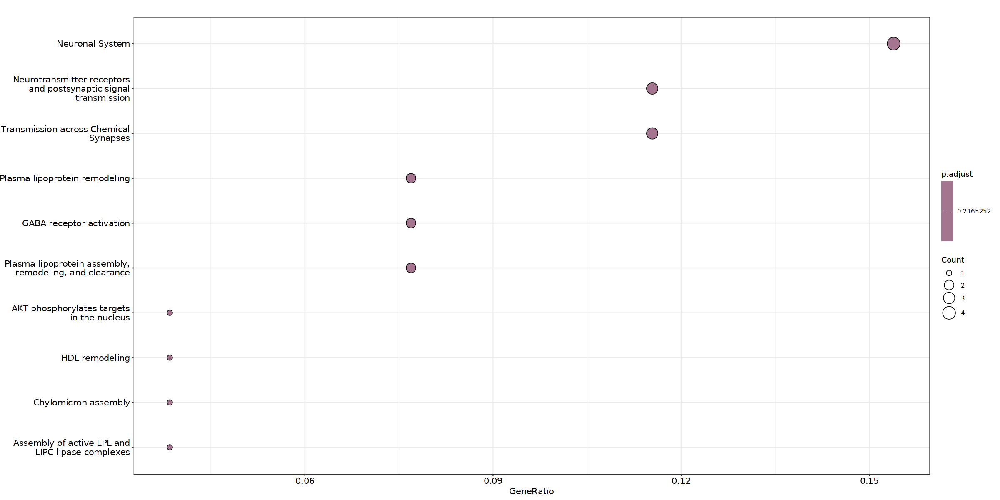

In [112]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [113]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

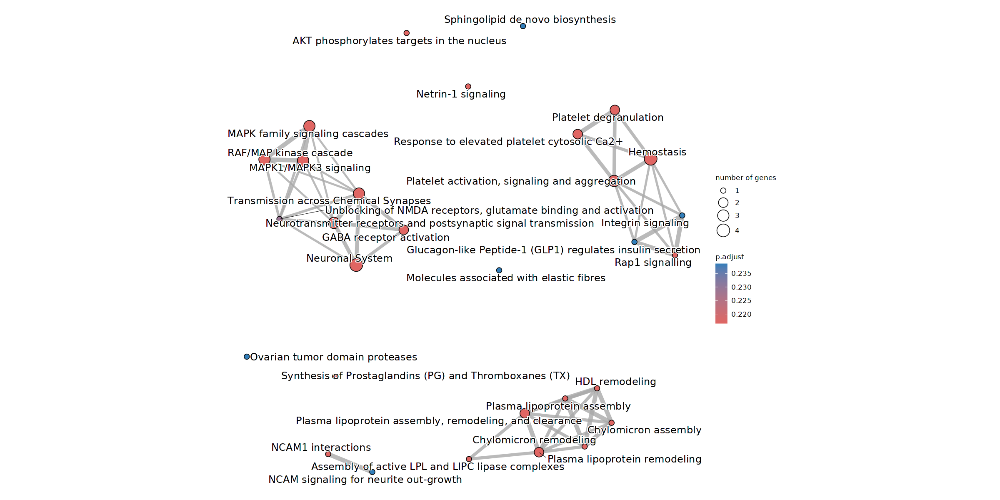

In [114]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Peak

In [145]:
timepoint = "Peak"

In [146]:
tmp_res_MOL56 <- res_MOL56.list[[timepoint]]

In [147]:
if(nrow(tmp_res_MOL56)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),]
}

In [148]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [149]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [150]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [151]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [152]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [153]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:43] "100503289" "12308" "12835" "100503044" "20379" "14623" "14038" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...4 enriched terms found
'data.frame':	4 obs. of  9 variables:
 $ ID         : chr  "R-MMU-112310" "R-MMU-888590" "R-MMU-112315" "R-MMU-210500"
 $ Description: chr  "Neurotransmitter release cycle" "GABA synthesis, release, reuptake and degradation" "Transmission across Chemical Synapses" "Glutamate Neurotransmitter Release Cycle"
 $ GeneRatio  : chr  "3/20" "2/20" "4/20" "2/20"
 $ BgRatio    : chr  "48/8582" "18/8582" "201/8582" "24/8582"
 $ pvalue     : num  0.000175 0.000772 0.001054 0.001381
 $ p.adjust   : num  0.0116 0.0228 0.0228 0.0228
 $ qvalue     : num  0.00885 0.01744 0.01744 0.01744
 $ geneID     : chr  "Slc6a11/Slc1a2/Snap25" "Slc6a11/Snap25" "Gabra2/Slc6a11/Slc1a2/Snap25" "Slc1a2/Snap25"
 $ Count      : int  3 2 4 2
#...Citation

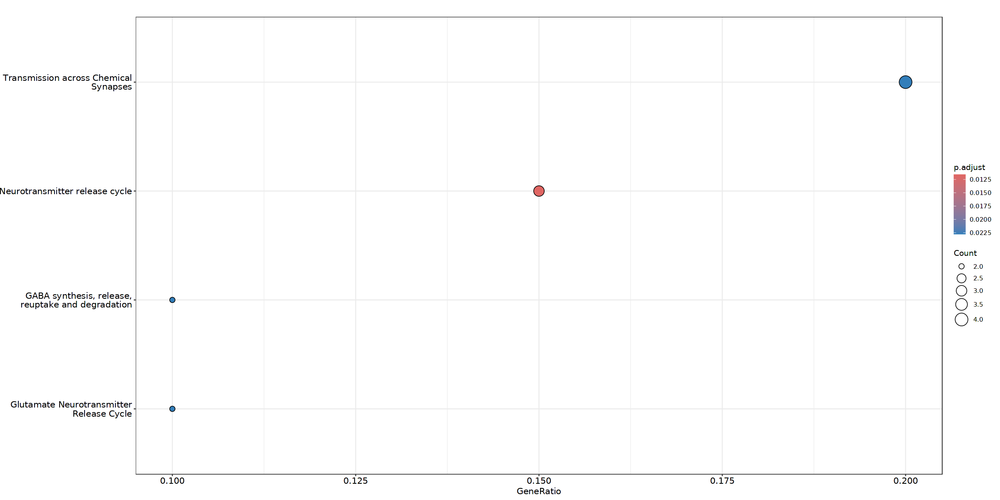

In [154]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [155]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

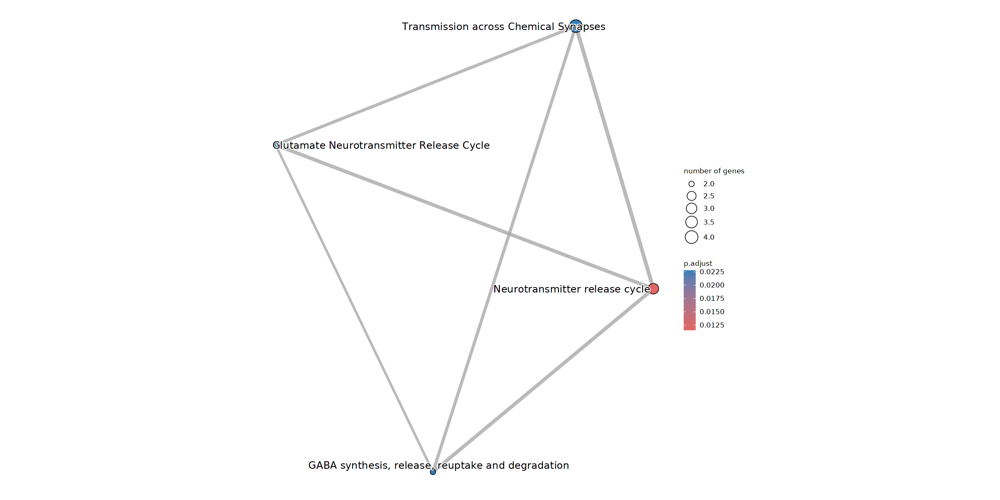

In [156]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

In [124]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [125]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:43] "100503289" "12308" "12835" "100503044" "20379" "14623" "14038" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...66 enriched terms found
'data.frame':	66 obs. of  9 variables:
 $ ID         : chr  "R-MMU-112310" "R-MMU-888590" "R-MMU-112315" "R-MMU-210500" ...
 $ Description: chr  "Neurotransmitter release cycle" "GABA synthesis, release, reuptake and degradation" "Transmission across Chemical Synapses" "Glutamate Neurotransmitter Release Cycle" ...
 $ GeneRatio  : chr  "3/20" "2/20" "4/20" "2/20" ...
 $ BgRatio    : chr  "48/8582" "18/8582" "201/8582" "24/8582" ...
 $ pvalue     : num  0.000175 0.000772 0.001054 0.001381 0.005916 ...
 $ p.adjust   : num  0.0116 0.0228 0.0228 0.0228 0.0781 ...
 $ qvalue     : num  0.00885 0.01744 0.01744 0.01744 0.05979 ...
 $ geneID     : chr  "Slc6a11/Slc1a2/Snap25" "Slc6a11/Snap25" "Gabra2/Slc6a11/Slc1a2/Snap25" "Slc1a

In [126]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL56_MOL2_",timepoint,".csv"), row.names=FALSE)

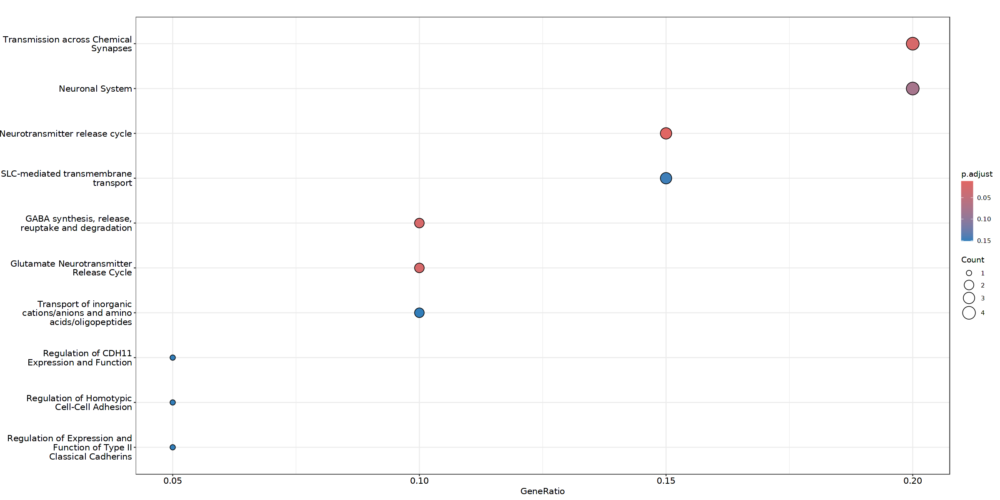

In [127]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [128]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

Warning message:
"ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


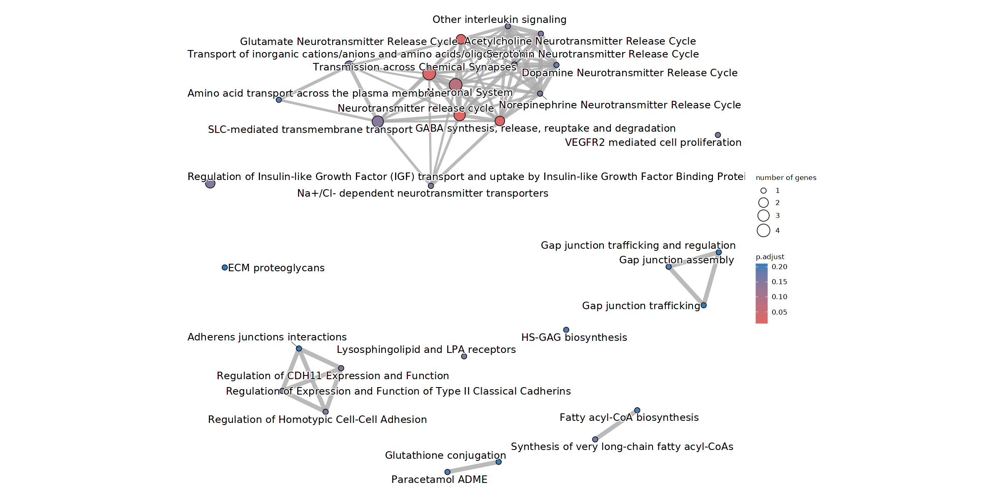

In [129]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Late

In [157]:
timepoint = "Late"

In [158]:
tmp_res_MOL56 <- res_MOL56.list[[timepoint]]

In [159]:
if(nrow(tmp_res_MOL56)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL56[order(tmp_res_MOL56$log2FoldChange, decreasing=TRUE),]
}

In [160]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [161]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [162]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [163]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [164]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [165]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:48] "72003" "19126" "328354" "107351" "245650" "20355" "74338" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...3 enriched terms found
'data.frame':	3 obs. of  9 variables:
 $ ID         : chr  "R-MMU-6794362" "R-MMU-388844" "R-MMU-112316"
 $ Description: chr  "Protein-protein interactions at synapses" "Receptor-type tyrosine-protein phosphatases" "Neuronal System"
 $ GeneRatio  : chr  "3/22" "2/22" "5/22"
 $ BgRatio    : chr  "66/8582" "19/8582" "323/8582"
 $ pvalue     : num  0.000603 0.001045 0.001136
 $ p.adjust   : num  0.0269 0.0269 0.0269
 $ qvalue     : num  0.0211 0.0211 0.0211
 $ geneID     : chr  "Slitrk2/Nlgn3/Slitrk3" "Slitrk2/Slitrk3" "Kcnj3/Slitrk2/Nlgn3/Kcnh8/Slitrk3"
 $ Count      : int  3 2 5
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSys

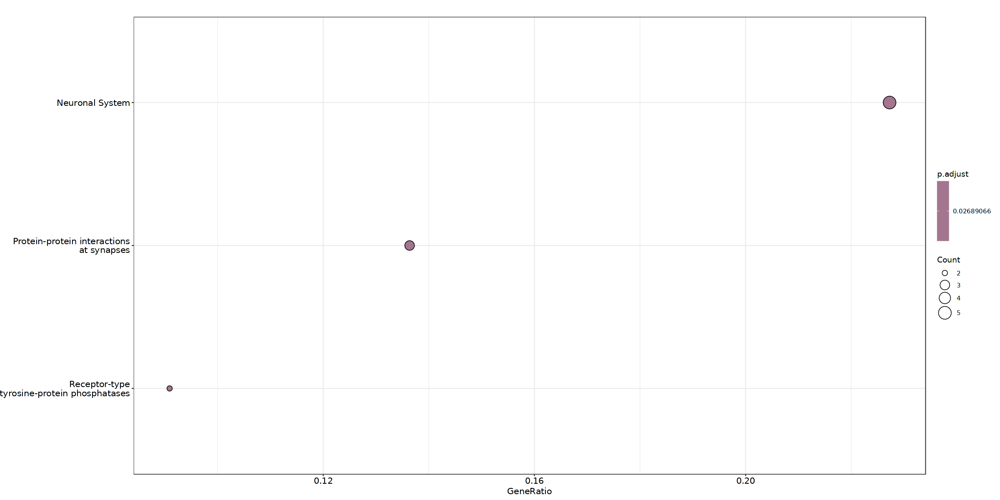

In [166]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [167]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

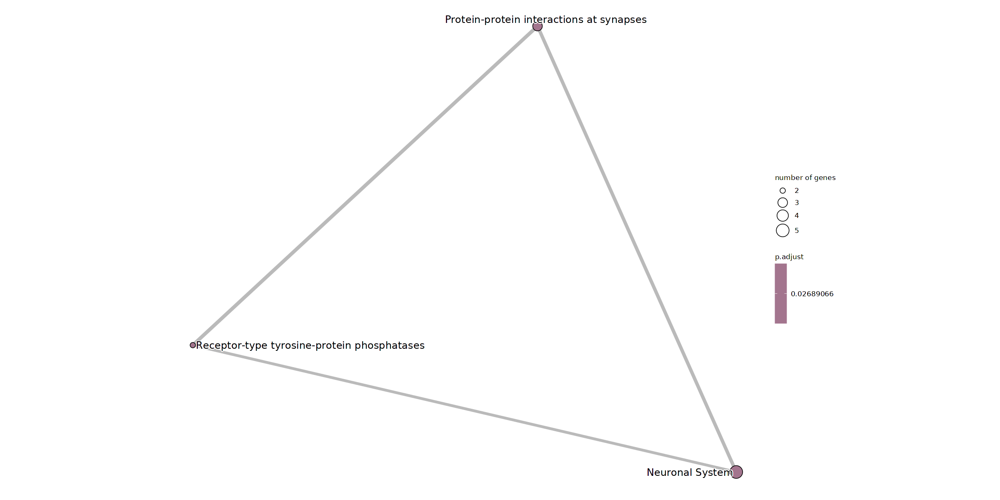

In [168]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

In [169]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [170]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:48] "72003" "19126" "328354" "107351" "245650" "20355" "74338" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...71 enriched terms found
'data.frame':	71 obs. of  9 variables:
 $ ID         : chr  "R-MMU-6794362" "R-MMU-388844" "R-MMU-112316" "R-MMU-76002" ...
 $ Description: chr  "Protein-protein interactions at synapses" "Receptor-type tyrosine-protein phosphatases" "Neuronal System" "Platelet activation, signaling and aggregation" ...
 $ GeneRatio  : chr  "3/22" "2/22" "5/22" "4/22" ...
 $ BgRatio    : chr  "66/8582" "19/8582" "323/8582" "246/8582" ...
 $ pvalue     : num  0.000603 0.001045 0.001136 0.003208 0.007084 ...
 $ p.adjust   : num  0.0269 0.0269 0.0269 0.0569 0.1006 ...
 $ qvalue     : num  0.0211 0.0211 0.0211 0.0447 0.079 ...
 $ geneID     : chr  "Slitrk2/Nlgn3/Slitrk3" "Slitrk2/Slitrk3" "Kcnj3/Slitrk2/Nlgn3/Kcnh8/Slitrk3" "Pcdh7/Islr/Trpc3/Rapg

In [171]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL56_MOL2_",timepoint,".csv"), row.names=FALSE)

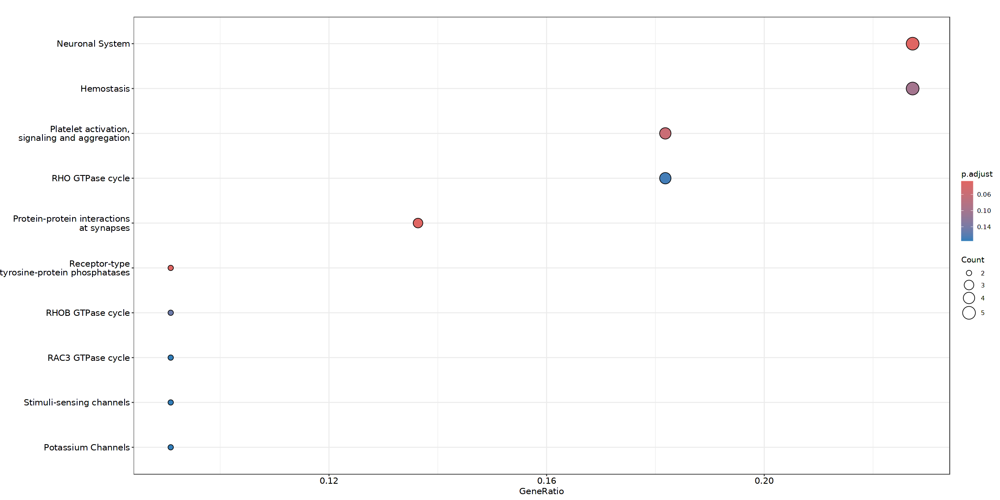

In [172]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [173]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

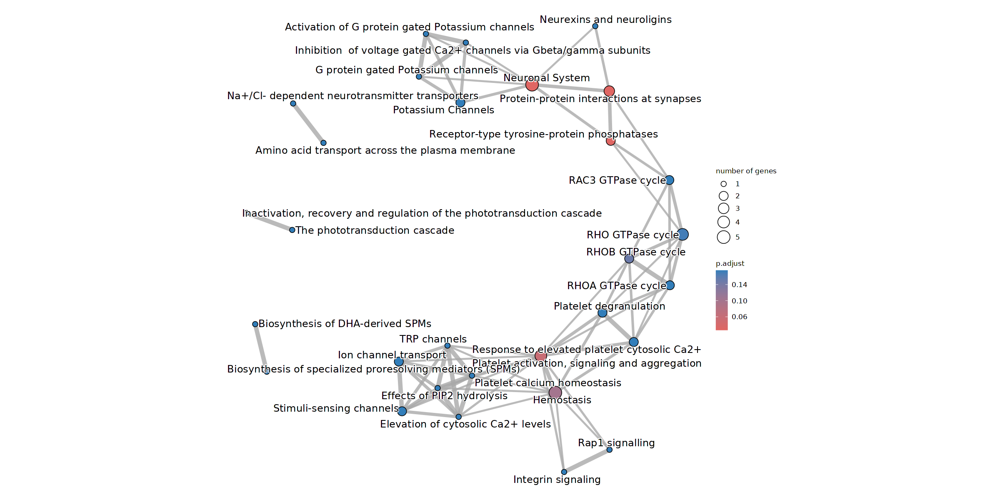

In [174]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

##### 3.1.5.2 MOL2

In [178]:
res_MOL2.list <- lapply(res.list, function(x){
    x[(x$log2FoldChange < 0 & x$baseMean > 1),]
})

In [179]:
HVGs_MOL2.list <- lapply(res_MOL2.list, function(x){
    x[(x$padj < 0.01 & abs(x$log2FoldChange) > 1 & x$baseMean > 1),]
})

###### 3.1.5.2.1 Differential genes expression

In [257]:
listInput_upset <- lapply(HVGs_MOL2.list, function(x){rownames(x)})
listInput_upset[sapply(listInput_upset, is.null)] <- NULL

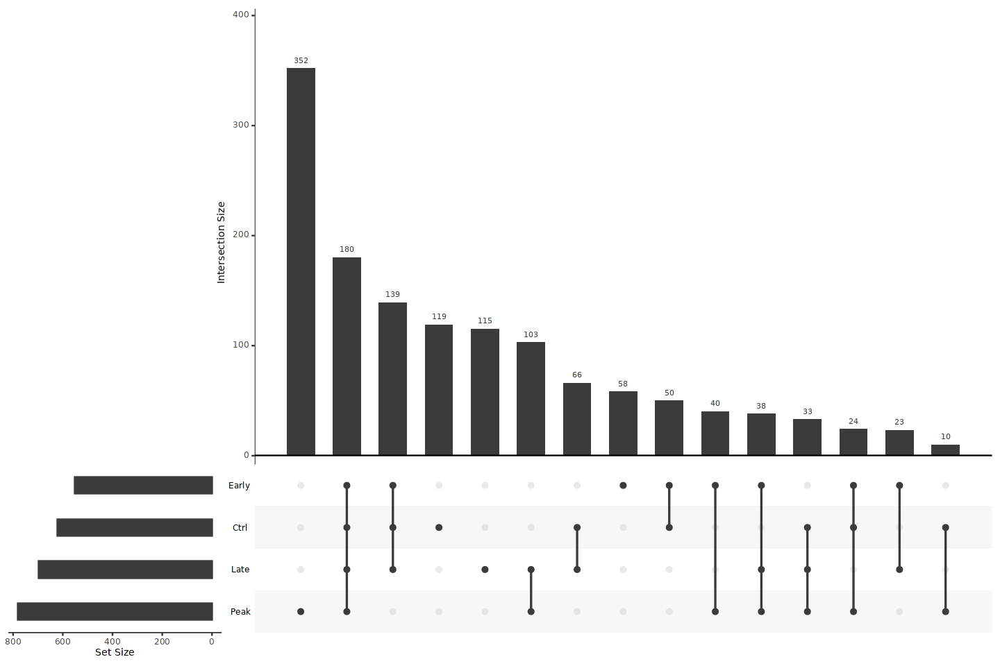

In [258]:
options(repr.plot.width=12, repr.plot.height=8)
upset(fromList(listInput_upset), order.by = "freq")

In [259]:
for(x in names(orig.ident_merge_colors)){
    res_MOL2.list[[x]]$gene_name <- rownames(res_MOL2.list[[x]])
    res_MOL2.list[[x]] <- res_MOL2.list[[x]][,c("log2FoldChange","padj","gene_name")]
    res_MOL2.list[[x]]$timepoint <- rep(x, nrow(res_MOL2.list[[x]]))
    res_MOL2.list[[x]]$neg_log10p <- -log10(res_MOL2.list[[x]]$padj)
    res_MOL2.list[[x]][(res_MOL2.list[[x]]$log2FoldChange >= -1) | (res_MOL2.list[[x]]$padj >= 0.01),'timepoint'] <- "NS"
    if(x=="Early")res_MOL2.list[[x]]$log2FoldChange <- -res_MOL2.list[[x]]$log2FoldChange
    if(x=="Late")res_MOL2.list[[x]]$neg_log10p <- -res_MOL2.list[[x]]$neg_log10p
    if(x=="Peak"){
        res_MOL2.list[[x]]$log2FoldChange <- -res_MOL2.list[[x]]$log2FoldChange
        res_MOL2.list[[x]]$neg_log10p <- -res_MOL2.list[[x]]$neg_log10p
    }
}

In [260]:
gg_df <- as.data.frame(do.call(rbind, res_MOL2.list))

In [261]:
p <- ggplot(gg_df, aes(log2FoldChange, neg_log10p)) +
    geom_point(aes(color = timepoint)) +
    scale_color_manual(values=c('NS'='black',orig.ident_merge_colors)) +
    xlim(-11,11) +
    ylim(-150,150) +
    geom_hline(yintercept=0) +
    geom_vline(xintercept=0) +
    theme_classic()

Warning message:
"Removed 1 row containing missing values or values outside the scale range (`geom_point()`)."


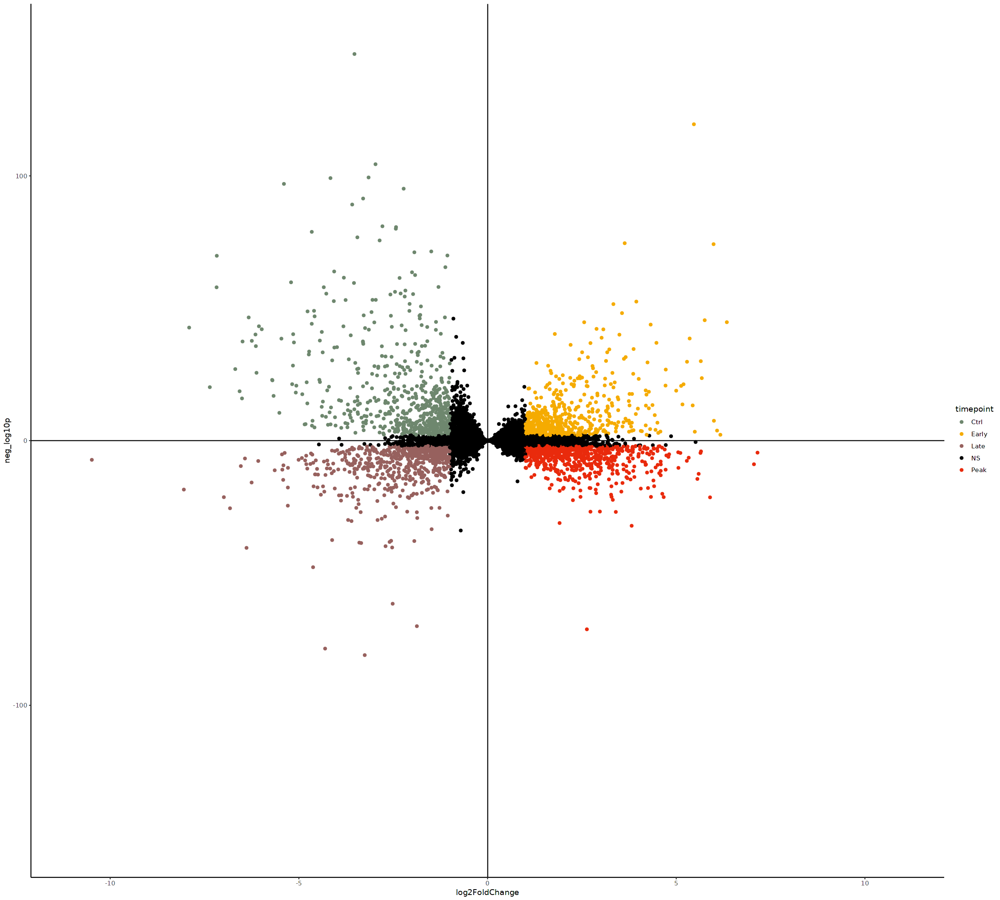

In [262]:
options(repr.plot.width=20, repr.plot.height=18)
p

In [263]:
res_MOL2.list <- lapply(res.list, function(x){
    x[(x$log2FoldChange < 0 & x$baseMean > 1),]
})

In [264]:
for(x in names(orig.ident_merge_colors)){
    res_MOL2.list[[x]]$timepoint <- rep(x, nrow(res_MOL2.list[[x]]))
    res_MOL2.list[[x]]$gene <- rownames(res_MOL2.list[[x]])
    res_MOL2.list[[x]]$neg_log10p <- -log10(res_MOL2.list[[x]]$padj)
    res_MOL2.list[[x]] <- res_MOL2.list[[x]][order(res_MOL2.list[[x]]$log2FoldChange, decreasing=FALSE),]
}

In [265]:
gg_df <- as.data.frame(do.call(rbind, res_MOL2.list))

In [266]:
gg_df$log2FoldChange <- -gg_df$log2FoldChange

In [267]:
gg_df$timepoint = factor(gg_df$timepoint, levels = names(orig.ident_merge_colors))

In [268]:
best_genes <- unique(unlist(lapply(HVGs_MOL2.list, function(x){rownames(x)})))

In [269]:
gg_df <- gg_df[gg_df$gene %in% best_genes,]

In [270]:
mat <- as.matrix(reshape2::dcast(gg_df, gene ~ timepoint, value.var = "log2FoldChange"))

In [271]:
rownames(mat) <- mat[,'gene']
mat <- mat[, colnames(mat) != "gene"]

In [272]:
mat[is.na(mat)] <- 0

In [273]:
clust <- hclust(dist(mat))
ddgram <- as.dendrogram(clust) # create dendrogram
ggtree_plot <- ggtree::ggtree(ddgram)

In [274]:
dotplot <- gg_df %>%
  mutate(gene = factor(gene, levels = clust$labels[clust$order])) %>% 
  ggplot(aes(x=timepoint, y = gene, color = log2FoldChange, size = neg_log10p)) +
  geom_point() +
  cowplot::theme_cowplot() +
  theme(axis.line  = element_blank()) +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  ylab('') +
  theme(axis.ticks = element_blank()) +
  scale_color_gradientn(colours = viridis::viridis(20), limits=c(0,5), oob = scales::squish, name = 'Log2 Ratio') +
  scale_y_discrete(position = "right") 

  labels <- ggplot(
    gg_df %>%
    mutate(
      timepoint = factor(timepoint, levels = names(orig.ident_merge_colors))
    ),
    aes(x = timepoint, y = 1, fill = timepoint)
  ) +
  geom_tile() +
  scale_fill_manual(values = orig.ident_merge_colors) +
  theme(legend.position = "none") +
  theme(
    axis.title.x=element_blank(),
    axis.text.x=element_blank(),
    axis.ticks.x=element_blank(),
    axis.title.y=element_blank(),
    axis.text.y=element_blank(),
    axis.ticks.y=element_blank()
  ) +
  xlim2(dotplot)
  legend <- plot_grid(get_legend(labels + theme(legend.position="bottom")))

Warning message in get_plot_component(plot, "guide-box"):
"Multiple components found; returning the first one. To return all, use `return_all = TRUE`."


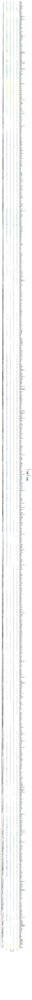

In [275]:
options(repr.plot.width=8, repr.plot.height=250)
print(
plot_spacer() + plot_spacer() + plot_spacer() +
ggtree_plot + plot_spacer() + dotplot +
plot_spacer() + plot_spacer() + legend +
plot_layout(ncol = 3, widths = c(2, -0.05, 10), heights = c(0, 10, 0.5))
)

In [276]:
pdf(paste0(OS_path_outputs, "MOL2_DGEs.pdf"), width = 8, height = 250)
print(
plot_spacer() + plot_spacer() + plot_spacer() +
ggtree_plot + plot_spacer() + dotplot +
plot_spacer() + plot_spacer() + legend +
plot_layout(ncol = 3, widths = c(2, -0.05, 10), heights = c(0, 10, 0.5))
)
dev.off()

png 
  2

###### 3.1.5.2.2 Gene Ontology

In [181]:
res_MOL2.list <- lapply(res.list, function(x){
    x[(x$log2FoldChange < -1 & x$padj < 0.01 & x$baseMean > 1),]
})

In [182]:
MOL2_DGEs.list <- lapply(res_MOL2.list, function(x){
    rownames(x)
})

In [293]:
write.csv(MOL2_DGEs.list[["Ctrl"]],row.names = FALSE, paste0(OS_path_outputs, "MOL2_DGEs_Ctrl.csv"))
write.csv(MOL2_DGEs.list[["Early"]],row.names = FALSE,paste0(OS_path_outputs, "MOL2_DGEs_Early.csv"))
write.csv(MOL2_DGEs.list[["Peak"]],row.names = FALSE,paste0(OS_path_outputs, "MOL2_DGEs_Peak.csv"))
write.csv(MOL2_DGEs.list[["Late"]],row.names = FALSE,paste0(OS_path_outputs, "MOL2_DGEs_Late.csv"))

In [183]:
ensembl = useMart("ensembl",dataset="mmusculus_gene_ensembl")
attributes = listAttributes(ensembl)
Biomart_gencode_ensembl84_biotypes <- getBM(attributes=c("mgi_symbol","ensembl_gene_id","entrezgene_id","gene_biotype"), filters = "", values = "", ensembl)
Biomart_gencode_ensembl84_biotypes[, 'gene_biotype'] <- as.factor(Biomart_gencode_ensembl84_biotypes[,'gene_biotype'])

In [184]:
#Filter for only our genes
Biotype_All_dataset <- subset(Biomart_gencode_ensembl84_biotypes, mgi_symbol %in% rownames(MORNAATACCOL))
entrezID <- subset(Biotype_All_dataset, Biotype_All_dataset$mgi_symbol %in% rownames(MORNAATACCOL))

In [185]:
threshold_nb_genes <- 50

###### All timepoints

In [191]:
commun_MOL2 <- names(table(unlist(MOL2_DGEs.list))[table(unlist(MOL2_DGEs.list)) == 4])

In [192]:
entrezmatched <- entrezID[match(commun_MOL2,entrezID$mgi_symbol),]

In [193]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [194]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [195]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [196]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:171] "243219" "239273" "11488" "16764" "229949" "216188" "11676" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...0 enriched terms found
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSystems
  2016, 12(2):477-479 


In [197]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [198]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:171] "243219" "239273" "11488" "16764" "229949" "216188" "11676" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...342 enriched terms found
'data.frame':	342 obs. of  9 variables:
 $ ID         : chr  "R-MMU-9012999" "R-MMU-422475" "R-MMU-9675108" "R-MMU-5682910" ...
 $ Description: chr  "RHO GTPase cycle" "Axon guidance" "Nervous system development" "LGI-ADAM interactions" ...
 $ GeneRatio  : chr  "12/91" "8/91" "8/91" "2/91" ...
 $ BgRatio    : chr  "395/8582" "249/8582" "250/8582" "13/8582" ...
 $ pvalue     : num  0.000893 0.004787 0.004903 0.00804 0.010904 ...
 $ p.adjust   : num  0.305 0.529 0.529 0.529 0.529 ...
 $ qvalue     : num  0.305 0.528 0.528 0.528 0.528 ...
 $ geneID     : chr  "Basp1/Cyfip2/Dlc1/Dlg5/Fam83b/Fgd4/Fmnl3/Nck2/Pde5a/Spata13/Syde2/Tiam2" "Dpysl5/Epha10/Evl/Fgfr1/Mmp2/Msn/Nck2/Tubb2b" "Dpysl5/Epha10/Evl/Fgfr1/Mmp2/Msn/Nck2/Tubb2b" "

In [199]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL2_MOL56_AllTP.csv"), row.names=FALSE)

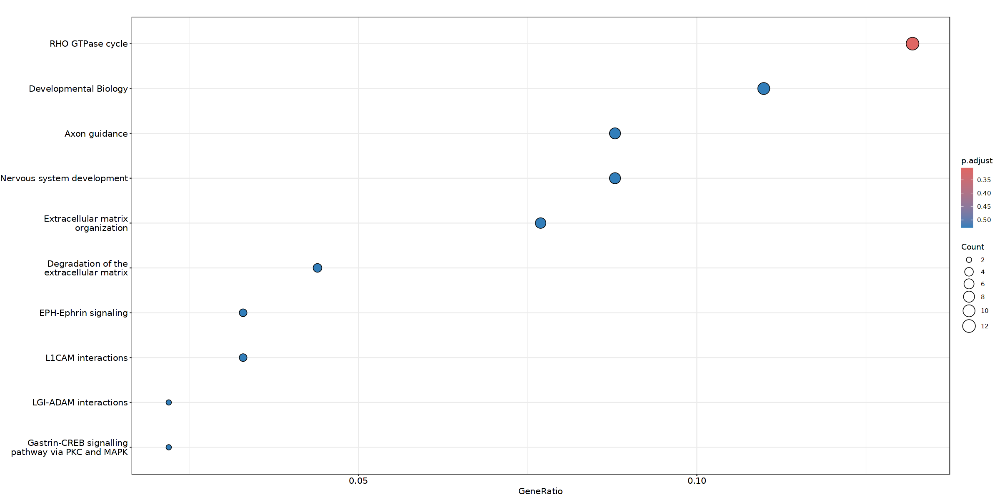

In [200]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [201]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

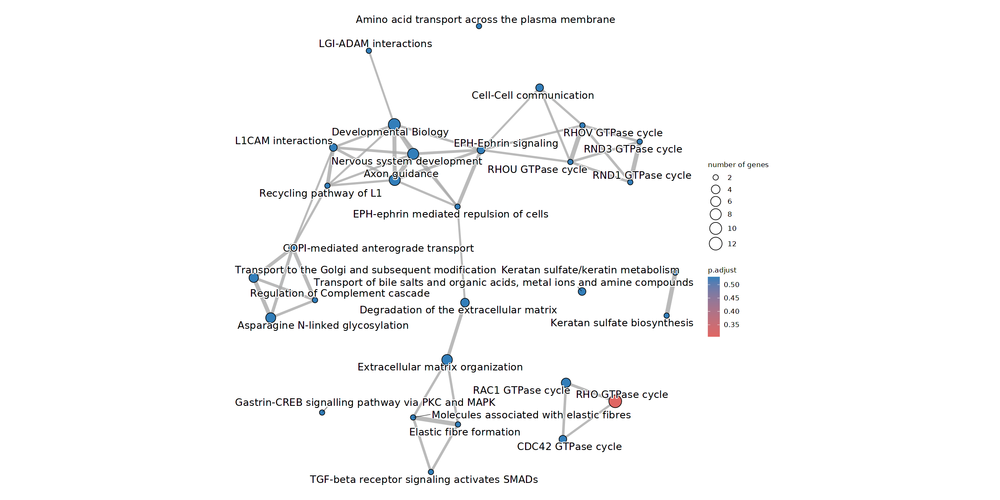

In [202]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Ctrl

In [203]:
timepoint = "Ctrl"

In [204]:
tmp_res_MOL2 <- res_MOL2.list[[timepoint]]

In [207]:
if(nrow(tmp_res_MOL2)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),]
}

In [208]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [209]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [210]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [211]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [212]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [213]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:44] "319854" "56175" "225742" "64929" "545370" "109979" "50768" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...0 enriched terms found
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSystems
  2016, 12(2):477-479 


In [214]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [215]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:44] "319854" "56175" "225742" "64929" "545370" "109979" "50768" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...117 enriched terms found
'data.frame':	117 obs. of  9 variables:
 $ ID         : chr  "R-MMU-190872" "R-MMU-190861" "R-MMU-190828" "R-MMU-157858" ...
 $ Description: chr  "Transport of connexons to the plasma membrane" "Gap junction assembly" "Gap junction trafficking" "Gap junction trafficking and regulation" ...
 $ GeneRatio  : chr  "2/22" "2/22" "2/22" "2/22" ...
 $ BgRatio    : chr  "17/8582" "32/8582" "41/8582" "43/8582" ...
 $ pvalue     : num  0.000834 0.00297 0.004842 0.005316 0.007698 ...
 $ p.adjust   : num  0.0975 0.1555 0.1555 0.1555 0.1801 ...
 $ qvalue     : num  0.0851 0.1357 0.1357 0.1357 0.1572 ...
 $ geneID     : chr  "Gjb2/Tubb2b" "Gjb2/Tubb2b" "Gjb2/Tubb2b" "Gjb2/Tubb2b" ...
 $ Count      : int  2 2 2 2 2 3 2 2 2 1 ...
#...Citat

In [216]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL2_MOL56_",timepoint,".csv"), row.names=FALSE)

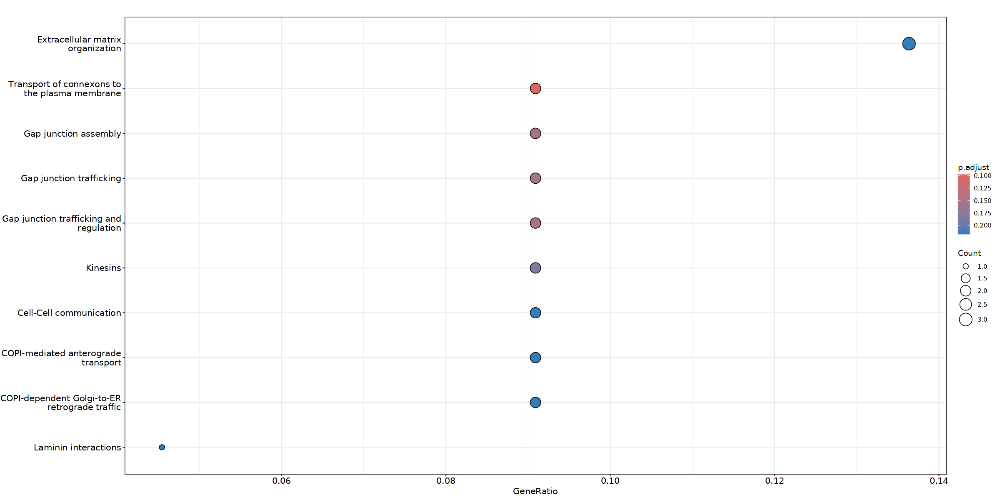

In [217]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [218]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

Warning message:
"ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


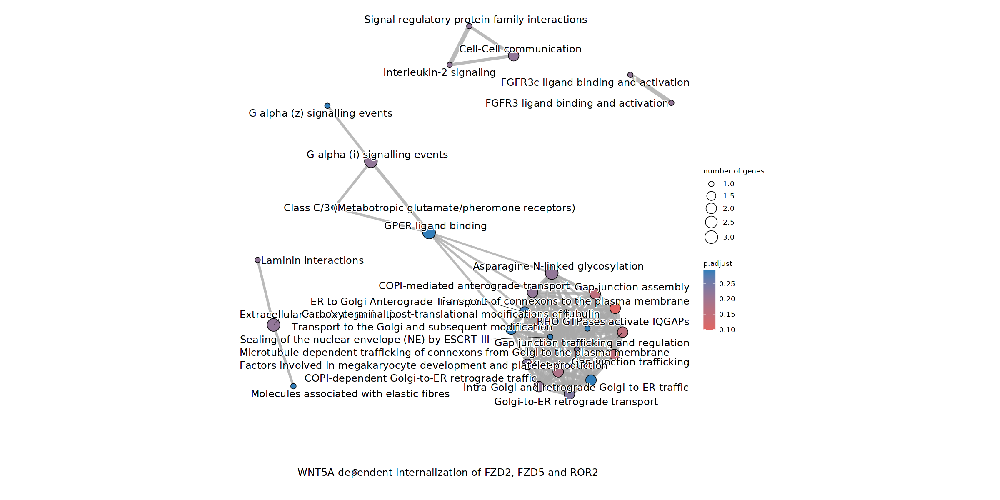

In [219]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Early

In [220]:
timepoint = "Early"

In [221]:
tmp_res_MOL2 <- res_MOL2.list[[timepoint]]

In [222]:
if(nrow(tmp_res_MOL2)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),]
}

In [223]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [224]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [225]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [226]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [227]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [228]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:46] "109979" "12524" "414127" "545370" "50768" "64929" "70363" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...3 enriched terms found
'data.frame':	3 obs. of  9 variables:
 $ ID         : chr  "R-MMU-1474244" "R-MMU-1650814" "R-MMU-1474290"
 $ Description: chr  "Extracellular matrix organization" "Collagen biosynthesis and modifying enzymes" "Collagen formation"
 $ GeneRatio  : chr  "5/21" "3/21" "3/21"
 $ BgRatio    : chr  "230/8582" "60/8582" "73/8582"
 $ pvalue     : num  0.00019 0.000395 0.000704
 $ p.adjust   : num  0.0163 0.017 0.0202
 $ qvalue     : num  0.0138 0.0143 0.017
 $ geneID     : chr  "Fbln2/Col1a2/Colgalt2/Nid1/Col22a1" "Col1a2/Colgalt2/Col22a1" "Col1a2/Colgalt2/Col22a1"
 $ Count      : int  5 3 3
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular 

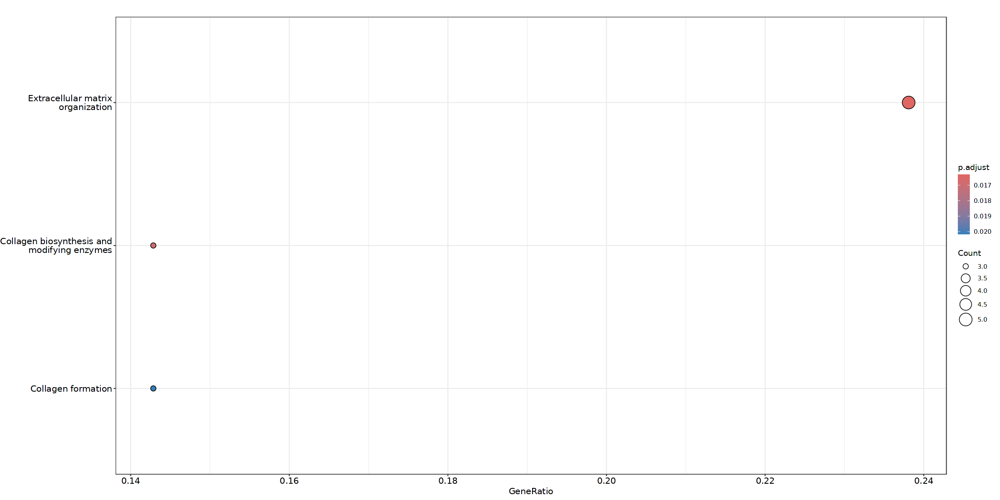

In [229]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [230]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

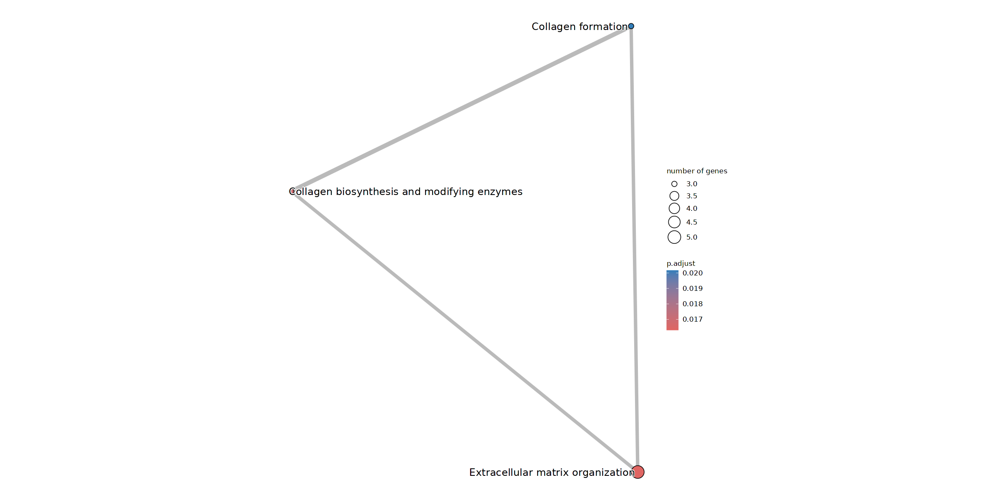

In [231]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

In [232]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [233]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:46] "109979" "12524" "414127" "545370" "50768" "64929" "70363" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...86 enriched terms found
'data.frame':	86 obs. of  9 variables:
 $ ID         : chr  "R-MMU-1474244" "R-MMU-1650814" "R-MMU-1474290" "R-MMU-8948216" ...
 $ Description: chr  "Extracellular matrix organization" "Collagen biosynthesis and modifying enzymes" "Collagen formation" "Collagen chain trimerization" ...
 $ GeneRatio  : chr  "5/21" "3/21" "3/21" "2/21" ...
 $ BgRatio    : chr  "230/8582" "60/8582" "73/8582" "35/8582" ...
 $ pvalue     : num  0.00019 0.000395 0.000704 0.003232 0.014069 ...
 $ p.adjust   : num  0.0163 0.017 0.0202 0.0695 0.2005 ...
 $ qvalue     : num  0.0138 0.0143 0.017 0.0587 0.1693 ...
 $ geneID     : chr  "Fbln2/Col1a2/Colgalt2/Nid1/Col22a1" "Col1a2/Colgalt2/Col22a1" "Col1a2/Colgalt2/Col22a1" "Col1a2/Col22a1" ...
 $ Count   

In [234]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL2_MOL56_",timepoint,".csv"), row.names=FALSE)

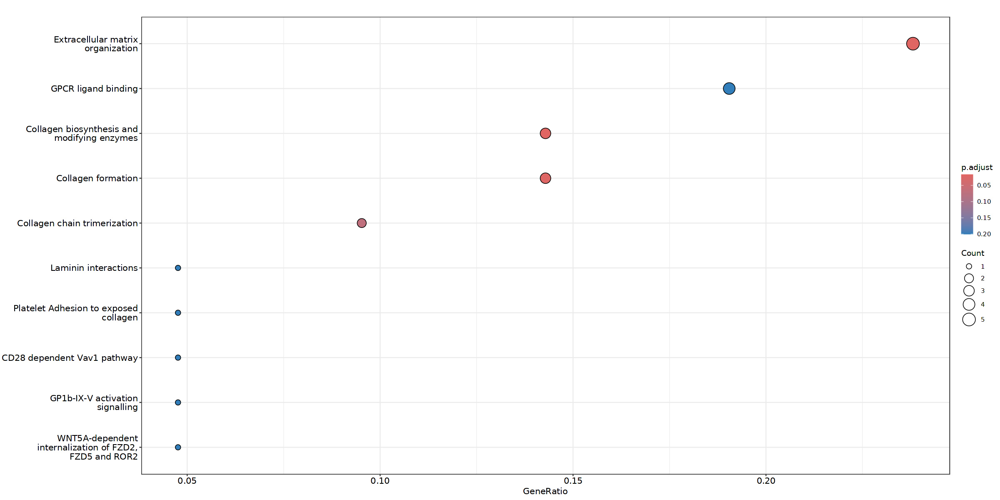

In [235]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [236]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

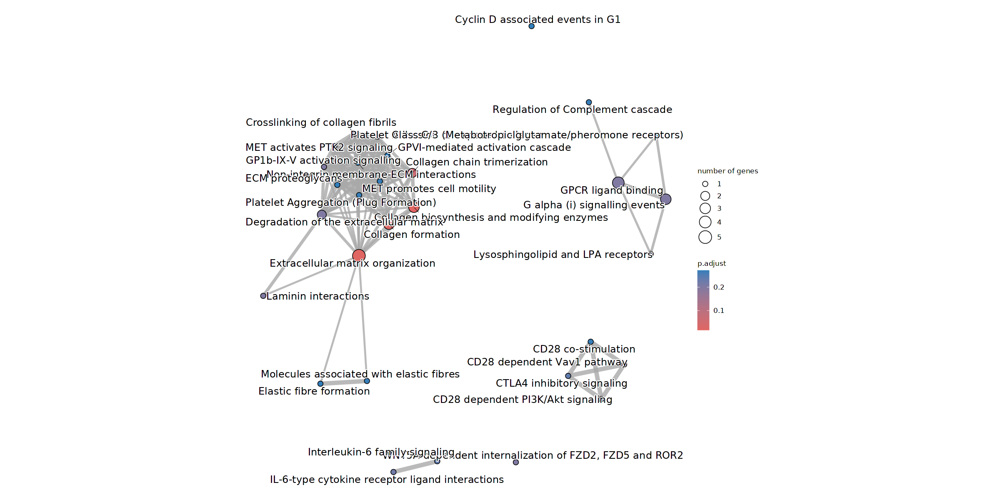

In [237]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Peak

In [269]:
timepoint = "Peak"

In [270]:
tmp_res_MOL2 <- res_MOL2.list[[timepoint]]

In [271]:
if(nrow(tmp_res_MOL2)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),]
}

In [272]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [242]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [243]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [244]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [245]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [246]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:43] "545370" "235379" "70363" "232016" "13730" "64929" "241494" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...7 enriched terms found
'data.frame':	7 obs. of  9 variables:
 $ ID         : chr  "R-MMU-373080" "R-MMU-449836" "R-MMU-1474244" "R-MMU-2129379" ...
 $ Description: chr  "Class B/2 (Secretin family receptors)" "Other interleukin signaling" "Extracellular matrix organization" "Molecules associated with elastic fibres" ...
 $ GeneRatio  : chr  "3/20" "2/20" "4/20" "2/20" ...
 $ BgRatio    : chr  "56/8582" "15/8582" "230/8582" "32/8582" ...
 $ pvalue     : num  0.000277 0.000532 0.001736 0.002454 0.002454 ...
 $ p.adjust   : num  0.0245 0.0245 0.0376 0.0376 0.0376 ...
 $ qvalue     : num  0.0182 0.0182 0.028 0.028 0.028 ...
 $ geneID     : chr  "Ramp2/Adm/Ucn2" "Sdc1/Il34" "Bmp7/Sdc1/Col1a2/Tgfb2" "Bmp7/Tgfb2" ...
 $ Count      : int  3 2 4 2 2 2 2


In [214]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [215]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:44] "319854" "56175" "225742" "64929" "545370" "109979" "50768" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...117 enriched terms found
'data.frame':	117 obs. of  9 variables:
 $ ID         : chr  "R-MMU-190872" "R-MMU-190861" "R-MMU-190828" "R-MMU-157858" ...
 $ Description: chr  "Transport of connexons to the plasma membrane" "Gap junction assembly" "Gap junction trafficking" "Gap junction trafficking and regulation" ...
 $ GeneRatio  : chr  "2/22" "2/22" "2/22" "2/22" ...
 $ BgRatio    : chr  "17/8582" "32/8582" "41/8582" "43/8582" ...
 $ pvalue     : num  0.000834 0.00297 0.004842 0.005316 0.007698 ...
 $ p.adjust   : num  0.0975 0.1555 0.1555 0.1555 0.1801 ...
 $ qvalue     : num  0.0851 0.1357 0.1357 0.1357 0.1572 ...
 $ geneID     : chr  "Gjb2/Tubb2b" "Gjb2/Tubb2b" "Gjb2/Tubb2b" "Gjb2/Tubb2b" ...
 $ Count      : int  2 2 2 2 2 3 2 2 2 1 ...
#...Citat

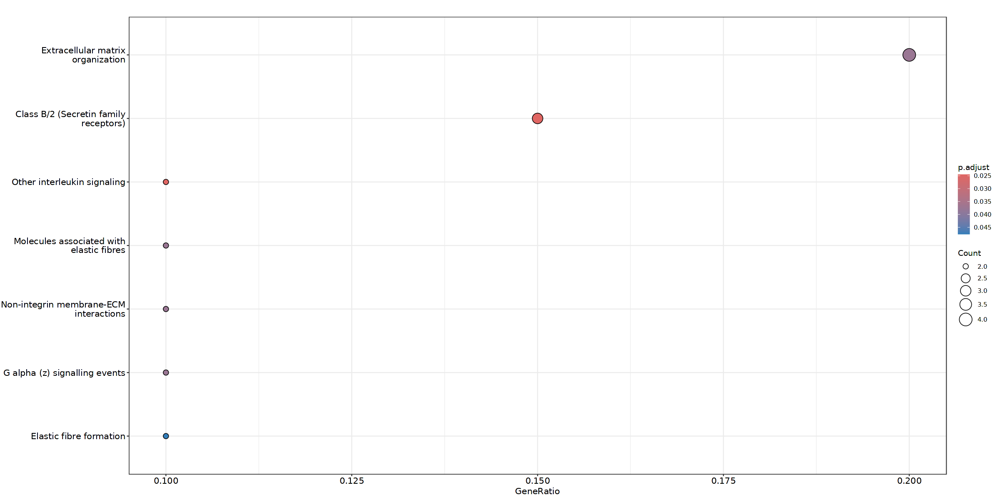

In [247]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [248]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

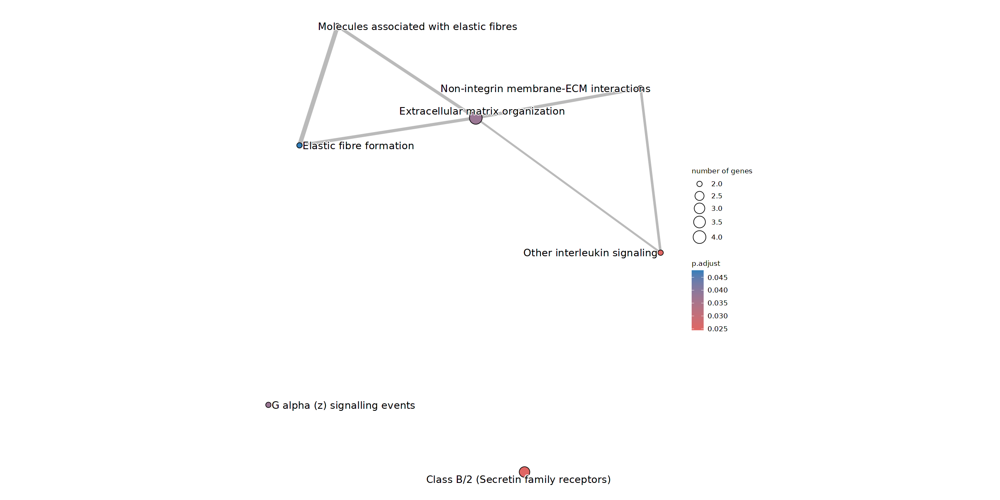

In [249]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

In [250]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL2_MOL56_",timepoint,".csv"), row.names=FALSE)

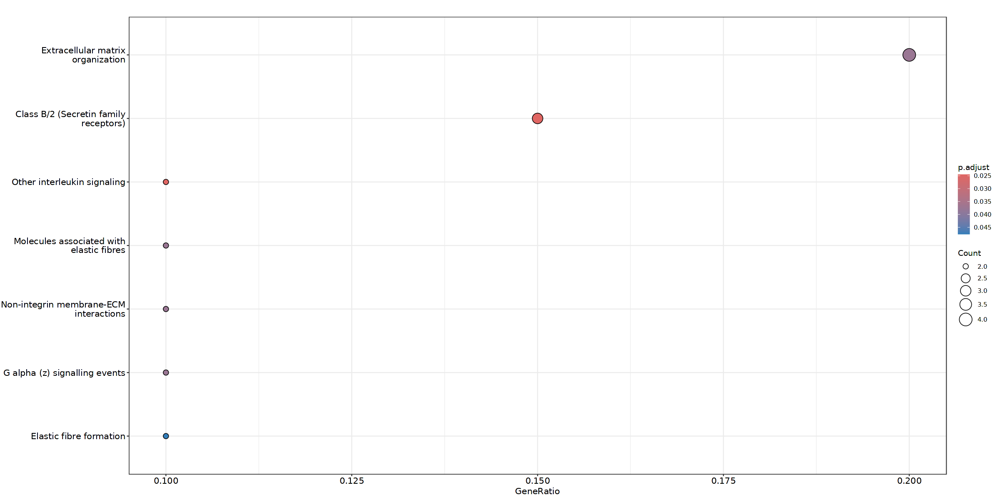

In [251]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [252]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

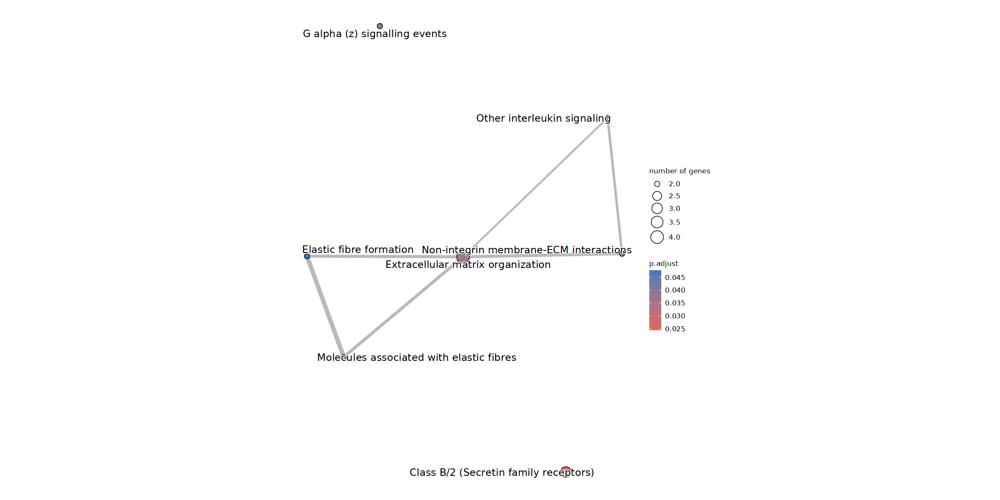

In [253]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

###### Late

In [254]:
timepoint = "Late"

In [255]:
tmp_res_MOL2 <- res_MOL2.list[[timepoint]]

In [256]:
if(nrow(tmp_res_MOL2)>threshold_nb_genes){
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),][1:threshold_nb_genes,]
} else{
    top_DEG_filtered <- tmp_res_MOL2[order(tmp_res_MOL2$log2FoldChange, decreasing=FALSE),]
}

In [257]:
top_DEG_filtered_names <- rownames(top_DEG_filtered)

In [258]:
entrezmatched <- entrezID[match(top_DEG_filtered_names,entrezID$mgi_symbol),]

In [259]:
entrezmatched_filtered <- entrezmatched[! apply(entrezmatched[,c(1,3)], 1,function (y) anyNA(y)),]

In [260]:
allLLIDs <- entrezmatched_filtered$entrezgene

In [261]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=0.05, qvalueCutoff = 0.05, pAdjustMethod = "fdr", readable=T)

In [262]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:40] "545370" "70363" "26563" "50768" "109979" "12524" "106347" ...
#...pvalues adjusted by 'fdr' with cutoff <0.05 
#...0 enriched terms found
#...Citation
  Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for
  reactome pathway analysis and visualization. Molecular BioSystems
  2016, 12(2):477-479 


In [263]:
modulesReactome <- enrichPathway(allLLIDs,organism="mouse", pvalueCutoff=1, qvalueCutoff = 1, pAdjustMethod = "fdr", readable=T)

In [264]:
modulesReactome

#
# over-representation test
#
#...@organism 	 mouse 
#...@ontology 	 Reactome 
#...@keytype 	 ENTREZID 
#...@gene 	 chr [1:40] "545370" "70363" "26563" "50768" "109979" "12524" "106347" ...
#...pvalues adjusted by 'fdr' with cutoff <1 
#...126 enriched terms found
'data.frame':	126 obs. of  9 variables:
 $ ID         : chr  "R-MMU-1474228" "R-MMU-1474244" "R-MMU-8948216" "R-MMU-421270" ...
 $ Description: chr  "Degradation of the extracellular matrix" "Extracellular matrix organization" "Collagen chain trimerization" "Cell-cell junction organization" ...
 $ GeneRatio  : chr  "3/21" "4/21" "2/21" "2/21" ...
 $ BgRatio    : chr  "106/8582" "230/8582" "35/8582" "48/8582" ...
 $ pvalue     : num  0.00207 0.0021 0.00323 0.00601 0.00811 ...
 $ p.adjust   : num  0.132 0.132 0.136 0.189 0.195 ...
 $ qvalue     : num  0.114 0.114 0.117 0.163 0.167 ...
 $ geneID     : chr  "Scube1/Nid1/Col1a2" "Col22a1/Scube1/Nid1/Col1a2" "Col22a1/Col1a2" "Sdk1/Sdk2" ...
 $ Count      : int  3 4 2 2 2 2 2 2 2 2

In [265]:
write.csv(as.data.frame(modulesReactome), paste0(OS_path_outputs, "GO_DGE_RNA_MOL2_MOL56_",timepoint,".csv"), row.names=FALSE)

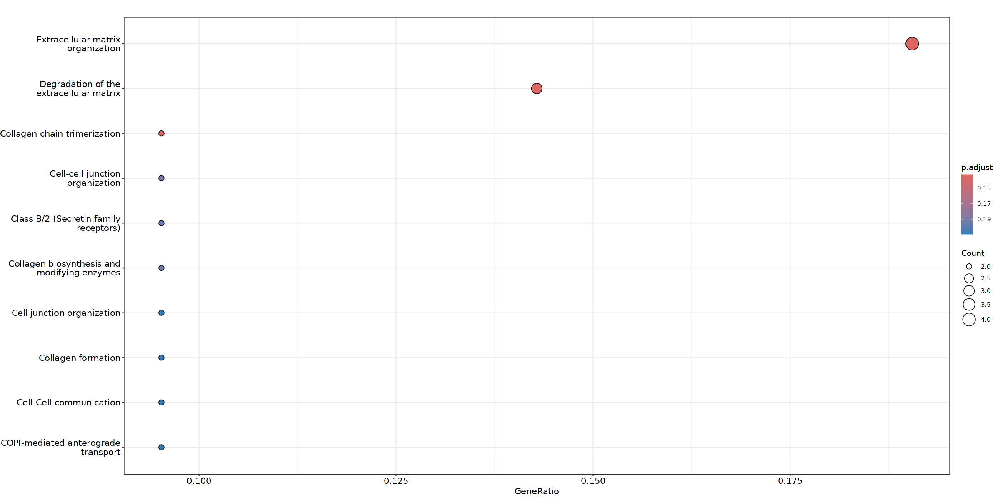

In [266]:
options(repr.plot.width=20, repr.plot.height=10)
dotplot(modulesReactome, showCategory=10, orderBy="GeneRatio")

In [267]:
modulesReactome <- pairwise_termsim(modulesReactome, method = "JC", semData = NULL, showCategory = 50)

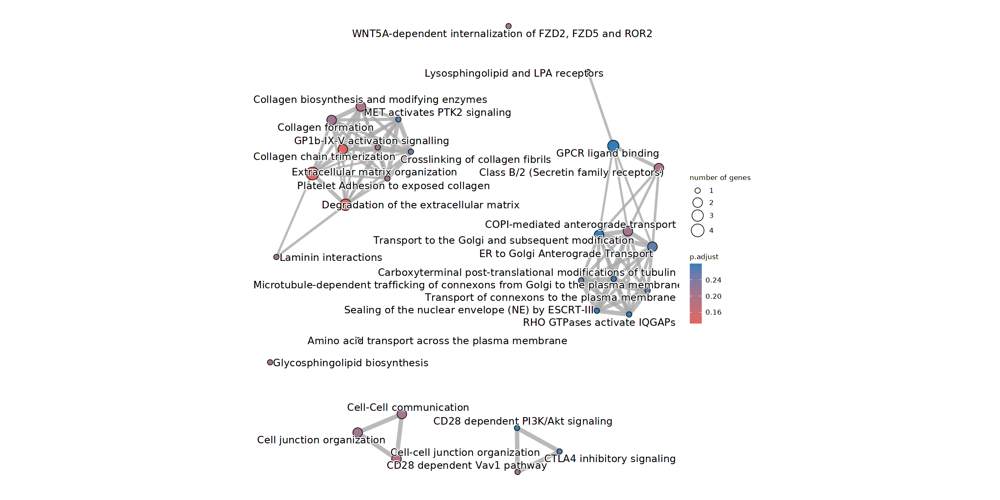

In [268]:
options(repr.plot.width=20, repr.plot.height=10)
emapplot(modulesReactome)

## X. Checkpoints

### X.1 Savings

In [278]:
saveRDS(HVGs.list, paste0(OS_path_outputs, "DGE_MOL56MOL2.rds"))
saveRDS(res.list, paste0(OS_path_outputs, "MOL56MOL2_values.rds"))